# The Problem Statement 

This model is to predict if borrowers in an online peer-to-peer (P2P) lending platform will pay back their loans on time and with lower interest rates. We look at factors related to the borrower, the loan, and their social profile to see how they affect loan performance. By analyzing this data, we can suggest ways for borrowers and lenders to increase their chances of successful lending and repayment.

## This is a multi-regressor problem :
- The regression model predicts three target varaiables which are :
   - EMI ( Equated Monthly Installments ) 
   - ROI ( Return On Investment )
   - ELA ( Eligible Loan Amount )

## Our model predicts three target variables which are : 
- **LoanStatusBinary :** Whether the borrower will repay the loan or not
- **preferred EMI :** Represents the ideal or desired amount that an individual or borrower would like to pay as their monthly installment towards a loan
- **preferred ROI :**  Represents the expected or desired rate of return on an investment. 
- **ELA :** It represents the maximum loan amount for each loan application based on the criteria set by the lending institution. It can be a significant feature in analyzing and modeling loan data, providing insights into loan approval decisions and potential borrowing capacities.


In [1]:
# !pip install klib
# !pip install xgboost
# !pip install mlxtend
# !pip install --upgrade matplotlip

# Importing Libraries

In [2]:
import pandas as pd
import numpy as np
import scipy


# For visualization 
import matplotlib.pyplot as plt
import klib
import seaborn as sns
import plotly.express as ex

# For Feature Engineering
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler , LabelEncoder, OneHotEncoder , MinMaxScaler
from sklearn.feature_selection import mutual_info_classif as MIC
from sklearn.feature_selection import mutual_info_regression as MIR
from sklearn.feature_selection import SelectKBest, chi2 , f_regression
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import ExtraTreesRegressor




# For data splitting 
from sklearn.model_selection import train_test_split

# For Modeling
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from xgboost import XGBRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import MultiTaskLasso
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import Ridge


# For model evaluation
from sklearn import metrics
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import classification_report , accuracy_score
from mlxtend.plotting import plot_confusion_matrix
from sklearn.metrics import confusion_matrix 
from sklearn.metrics import mean_absolute_percentage_error , r2_score



# For Hyperparameter tunning
from sklearn.datasets import make_blobs
from sklearn.model_selection import GridSearchCV

# For ploting learning curve
from sklearn.model_selection import learning_curve
from scipy.stats import ttest_rel

# For piplineing 
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.compose import ColumnTransformer


# For model saving for deployment 
import pickle

# Loading the data 

In [3]:
data = pd.read_csv('prosperLoanData.csv')
data.head()

,ListingKey,ListingNumber,ListingCreationDate,CreditGrade,Term,LoanStatus,ClosedDate,BorrowerAPR,BorrowerRate,LenderYield,...,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
0,1021339766868145413AB3B,193129,09:29.3,C,36,Completed,14/08/2009 00:00,0.16516,0.1580,0.1380,...,-133.18,0.0,0.0,0.0,0.0,1.0,0,0,0.0,258
1,10273602499503308B223C1,1209647,28:07.9,NaN,36,Current,NaN,0.12016,0.0920,0.0820,...,0.00,0.0,0.0,0.0,0.0,1.0,0,0,0.0,1
2,0EE9337825851032864889A,81716,00:47.1,HR,36,Completed,17/12/2009 00:00,0.28269,0.2750,0.2400,...,-24.20,0.0,0.0,0.0,0.0,1.0,0,0,0.0,41
3,0EF5356002482715299901A,658116,02:35.0,NaN,36,Current,NaN,0.12528,0.0974,0.0874,...,-108.01,0.0,0.0,0.0,0.0,1.0,0,0,0.0,158
4,0F023589499656230C5E3E2,909464,38:39.1,NaN,36,Current,NaN,0.24614,0.2085,0.1985,...,-60.27,0.0,0.0,0.0,0.0,1.0,0,0,0.0,20


# Data Structure and content

In [4]:
data.shape  

(113937, 81)

> __The dataset consists of 113937 record and 81 feature.__

In [5]:
# The statistical summary of numerical columns in train dataset
data.describe() 

,ListingNumber,Term,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,ProsperRating (numeric),ProsperScore,...,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
count,1.139370e+05,113937.000000,113912.000000,113937.000000,113937.000000,84853.000000,84853.000000,84853.000000,84853.000000,84853.000000,...,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000
mean,6.278857e+05,40.830248,0.218828,0.192764,0.182701,0.168661,0.080306,0.096068,4.072243,5.950067,...,-54.725641,-14.242698,700.446342,681.420499,25.142686,0.998584,0.048027,0.023460,16.550751,80.475228
std,3.280762e+05,10.436212,0.080364,0.074818,0.074516,0.068467,0.046764,0.030403,1.673227,2.376501,...,60.675425,109.232758,2388.513831,2357.167068,275.657937,0.017919,0.332353,0.232412,294.545422,103.239020
min,4.000000e+00,12.000000,0.006530,0.000000,-0.010000,-0.182700,0.004900,-0.182700,1.000000,1.000000,...,-664.870000,-9274.750000,-94.200000,-954.550000,0.000000,0.700000,0.000000,0.000000,0.000000,1.000000
25%,4.009190e+05,36.000000,0.156290,0.134000,0.124200,0.115670,0.042400,0.074080,3.000000,4.000000,...,-73.180000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,2.000000
50%,6.005540e+05,36.000000,0.209760,0.184000,0.173000,0.161500,0.072400,0.091700,4.000000,6.000000,...,-34.440000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,44.000000
75%,8.926340e+05,36.000000,0.283810,0.250000,0.240000,0.224300,0.112000,0.116600,5.000000,8.000000,...,-13.920000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,115.000000
max,1.255725e+06,60.000000,0.512290,0.497500,0.492500,0.319900,0.366000,0.283700,7.000000,11.000000,...,32.060000,0.000000,25000.000000,25000.000000,21117.900000,1.012500,39.000000,33.000000,25000.000000,1189.000000


In [6]:
# To know some info about each feature in the dataframe ( number of non-null values , datatype of the feature )
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113937 entries, 0 to 113936
Data columns (total 81 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   ListingKey                           113937 non-null  object 
 1   ListingNumber                        113937 non-null  int64  
 2   ListingCreationDate                  113937 non-null  object 
 3   CreditGrade                          28953 non-null   object 
 4   Term                                 113937 non-null  int64  
 5   LoanStatus                           113937 non-null  object 
 6   ClosedDate                           55089 non-null   object 
 7   BorrowerAPR                          113912 non-null  float64
 8   BorrowerRate                         113937 non-null  float64
 9   LenderYield                          113937 non-null  float64
 10  EstimatedEffectiveYield              84853 non-null   float64
 11  EstimatedLoss

In [7]:
# To test if there are duplicates in the dataset or not
print ( data.duplicated() )

print ( data.duplicated().sum() )

0         False
1         False
2         False
3         False
4         False
          ...  
113932    False
113933    False
113934    False
113935    False
113936    False
Length: 113937, dtype: bool
0


> __There are no duplicates in the data.__

# Data Preparation

## Dropping some features that aren't important

In [8]:
# As these columns are not important
data.drop(['ListingKey', 'LoanKey', 'ListingNumber' , 'LoanNumber'  , 'MemberKey','FirstRecordedCreditLine',],axis=1 ,
          inplace = True)

### Get the numerical features 

In [9]:
# To get the nuumerical features in the dataset
numeric_features = data.select_dtypes(include=np.number)
numeric_columns= numeric_features.columns
numeric_features = list(numeric_columns) 
print ( " The dataset contains " , len(numeric_features) , " numeric features which are : " )
print(numeric_features)

 The dataset contains  59  numeric features which are : 
['Term', 'BorrowerAPR', 'BorrowerRate', 'LenderYield', 'EstimatedEffectiveYield', 'EstimatedLoss', 'EstimatedReturn', 'ProsperRating (numeric)', 'ProsperScore', 'ListingCategory (numeric)', 'EmploymentStatusDuration', 'CreditScoreRangeLower', 'CreditScoreRangeUpper', 'CurrentCreditLines', 'OpenCreditLines', 'TotalCreditLinespast7years', 'OpenRevolvingAccounts', 'OpenRevolvingMonthlyPayment', 'InquiriesLast6Months', 'TotalInquiries', 'CurrentDelinquencies', 'AmountDelinquent', 'DelinquenciesLast7Years', 'PublicRecordsLast10Years', 'PublicRecordsLast12Months', 'RevolvingCreditBalance', 'BankcardUtilization', 'AvailableBankcardCredit', 'TotalTrades', 'TradesNeverDelinquent (percentage)', 'TradesOpenedLast6Months', 'DebtToIncomeRatio', 'StatedMonthlyIncome', 'TotalProsperLoans', 'TotalProsperPaymentsBilled', 'OnTimeProsperPayments', 'ProsperPaymentsLessThanOneMonthLate', 'ProsperPaymentsOneMonthPlusLate', 'ProsperPrincipalBorrowed', 

In [10]:
# To get the number of unique values in each numerical feature
for feature in numeric_features:
    print('The feature is {} and number of unique values are {}'.format(feature,len(data[feature].unique())))

The feature is Term and number of unique values are 3
The feature is BorrowerAPR and number of unique values are 6678
The feature is BorrowerRate and number of unique values are 2294
The feature is LenderYield and number of unique values are 2283
The feature is EstimatedEffectiveYield and number of unique values are 1583
The feature is EstimatedLoss and number of unique values are 121
The feature is EstimatedReturn and number of unique values are 1477
The feature is ProsperRating (numeric) and number of unique values are 8
The feature is ProsperScore and number of unique values are 12
The feature is ListingCategory (numeric) and number of unique values are 21
The feature is EmploymentStatusDuration and number of unique values are 606
The feature is CreditScoreRangeLower and number of unique values are 27
The feature is CreditScoreRangeUpper and number of unique values are 27
The feature is CurrentCreditLines and number of unique values are 55
The feature is OpenCreditLines and number o

### Get the categorical features 

In [11]:
# To get the categorical features in the dataframe 
categoric_features = data.select_dtypes(exclude = 'number')
categoric_columns= categoric_features.columns
categoric_features = list(categoric_columns) 

# To add these two features to categoric features list as they contains true , false 

print ( " The train dataframe contains " , len(categoric_features) ," categoric features which are : " )
print(categoric_features)

 The train dataframe contains  16  categoric features which are : 
['ListingCreationDate', 'CreditGrade', 'LoanStatus', 'ClosedDate', 'ProsperRating (Alpha)', 'BorrowerState', 'Occupation', 'EmploymentStatus', 'IsBorrowerHomeowner', 'CurrentlyInGroup', 'GroupKey', 'DateCreditPulled', 'IncomeRange', 'IncomeVerifiable', 'LoanOriginationDate', 'LoanOriginationQuarter']


In [12]:
# To get the number of unique categories in each feature
for feature in categoric_features:
    print('The feature is {} and number of categories are {}'.format(feature,len(data[feature].unique())))

The feature is ListingCreationDate and number of categories are 34801
The feature is CreditGrade and number of categories are 9
The feature is LoanStatus and number of categories are 12
The feature is ClosedDate and number of categories are 2803
The feature is ProsperRating (Alpha) and number of categories are 8
The feature is BorrowerState and number of categories are 52
The feature is Occupation and number of categories are 68
The feature is EmploymentStatus and number of categories are 9
The feature is IsBorrowerHomeowner and number of categories are 2
The feature is CurrentlyInGroup and number of categories are 2
The feature is GroupKey and number of categories are 707
The feature is DateCreditPulled and number of categories are 100278
The feature is IncomeRange and number of categories are 8
The feature is IncomeVerifiable and number of categories are 2
The feature is LoanOriginationDate and number of categories are 1873
The feature is LoanOriginationQuarter and number of categori

# Data Preprocessing

## Binary encoding 

In [13]:
data[ (data['LoanStatus']=='Current') & (data['LoanMonthsSinceOrigination']<data['Term']) ][['ListingCreationDate',
                                                                                             'CreditGrade',
                                                                                             'Term',
                                                                                             'LoanStatus', 
                                                                                            'LoanMonthsSinceOrigination', 
                                                                                            'LoanCurrentDaysDelinquent']]

,ListingCreationDate,CreditGrade,Term,LoanStatus,LoanMonthsSinceOrigination,LoanCurrentDaysDelinquent
1,28:07.9,NaN,36,Current,0,0
3,02:35.0,NaN,36,Current,16,0
4,38:39.1,NaN,36,Current,6,0
5,26:37.1,NaN,60,Current,3,0
6,52:56.1,NaN,36,Current,11,0
...,...,...,...,...,...,...
113930,24:49.7,NaN,36,Current,8,0
113931,13:08.0,NaN,60,Current,2,0
113932,55:02.7,NaN,36,Current,11,0
113934,49:12.7,NaN,60,Current,3,0


In [14]:
data[ (data['LoanStatus']=='Current') & (data['LoanMonthsSinceOrigination']<data['Term'])]['LoanCurrentDaysDelinquent'].unique()

array([0], dtype=int64)

### Dropping rows where:
- 'LoanStatus' is 'Current'
- 'LoanMonthsSinceOrigination' is less than 'Term'.

> __As in these cells we checked to see rows where the ‘LoanStatus’ is current and the months since origination were less than the ‘Term’.__
> __So we concluded that these rows represented the newly issued loans which would logically be not defaulted as they were either just or newly issued so they can’t really give a good representation of their other features.__



In [15]:
data.drop(data[(data['LoanStatus']=='Current') & (data['LoanMonthsSinceOrigination']<data['Term'])].index, axis=0, inplace=True)


data.reset_index(inplace=True)
data.drop(['index'], axis=1, inplace=True)
data.head()

,ListingCreationDate,CreditGrade,Term,LoanStatus,ClosedDate,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,...,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
0,09:29.3,C,36,Completed,14/08/2009 00:00,0.16516,0.1580,0.1380,NaN,NaN,...,-133.18,0.0,0.00,0.00,0.0,1.0,0,0,0.0,258
1,00:47.1,HR,36,Completed,17/12/2009 00:00,0.28269,0.2750,0.2400,NaN,NaN,...,-24.20,0.0,0.00,0.00,0.0,1.0,0,0,0.0,41
2,28:33.6,C,36,Completed,07/01/2008 00:00,0.15033,0.1325,0.1225,NaN,NaN,...,-0.88,0.0,0.00,0.00,0.0,1.0,0,0,0.0,53
3,01:10.8,NaN,36,Past Due (1-15 days),NaN,0.17969,0.1435,0.1335,0.1264,0.0524,...,-3.40,0.0,0.00,0.00,0.0,1.0,0,0,0.0,1
4,14:46.3,NaN,36,Defaulted,19/12/2012 00:00,0.35797,0.3177,0.3077,0.2896,0.1650,...,-9.81,0.0,3790.25,3790.25,0.0,1.0,0,0,0.0,10


In [16]:
data.shape

(57522, 75)

In [17]:
data['LoanStatus'].unique()

array(['Completed', 'Past Due (1-15 days)', 'Defaulted', 'Chargedoff',
       'Past Due (16-30 days)', 'Cancelled', 'Current',
       'Past Due (61-90 days)', 'Past Due (31-60 days)',
       'Past Due (91-120 days)', 'FinalPaymentInProgress',
       'Past Due (>120 days)'], dtype=object)

##  LoanStatusBinary  ( our 1st target variable )

> __The LoanStatus feature will be replaced with 1 if the LoanCurrentDaysDelinquent > 180 , otherwise 0.__

In [18]:
# Create a new column called "LoanStatus"
data["LoanStatusBinary"] = data["LoanCurrentDaysDelinquent"] > 180

# Replace the values in the "LoanStatus" column
data["LoanStatusBinary"] = data["LoanStatusBinary"].replace({True:0, False:1})

# Print the first few rows of the dataset
data.head()

,ListingCreationDate,CreditGrade,Term,LoanStatus,ClosedDate,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,...,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors,LoanStatusBinary
0,09:29.3,C,36,Completed,14/08/2009 00:00,0.16516,0.1580,0.1380,NaN,NaN,...,0.0,0.00,0.00,0.0,1.0,0,0,0.0,258,1
1,00:47.1,HR,36,Completed,17/12/2009 00:00,0.28269,0.2750,0.2400,NaN,NaN,...,0.0,0.00,0.00,0.0,1.0,0,0,0.0,41,1
2,28:33.6,C,36,Completed,07/01/2008 00:00,0.15033,0.1325,0.1225,NaN,NaN,...,0.0,0.00,0.00,0.0,1.0,0,0,0.0,53,1
3,01:10.8,NaN,36,Past Due (1-15 days),NaN,0.17969,0.1435,0.1335,0.1264,0.0524,...,0.0,0.00,0.00,0.0,1.0,0,0,0.0,1,1
4,14:46.3,NaN,36,Defaulted,19/12/2012 00:00,0.35797,0.3177,0.3077,0.2896,0.1650,...,0.0,3790.25,3790.25,0.0,1.0,0,0,0.0,10,1


In [19]:
data['LoanStatusBinary'].value_counts()

1    42459
0    15063
Name: LoanStatusBinary, dtype: int64

## Dropping the original 'LoanStatus' feature

In [20]:
data.drop('LoanStatus' , axis=1, inplace=True)

## Checking for Null values in the features

In [21]:
# To get the number of null values in each feature ( missing values ) 
for feature in data :
    print( feature , " : " , data[feature].isna().sum() )

ListingCreationDate  :  0
CreditGrade  :  28569
Term  :  0
ClosedDate  :  2433
BorrowerAPR  :  25
BorrowerRate  :  0
LenderYield  :  0
EstimatedEffectiveYield  :  29084
EstimatedLoss  :  29084
EstimatedReturn  :  29084
ProsperRating (numeric)  :  29084
ProsperRating (Alpha)  :  29084
ProsperScore  :  29084
ListingCategory (numeric)  :  0
BorrowerState  :  5515
Occupation  :  2284
EmploymentStatus  :  2255
EmploymentStatusDuration  :  7615
IsBorrowerHomeowner  :  0
CurrentlyInGroup  :  0
GroupKey  :  44800
DateCreditPulled  :  0
CreditScoreRangeLower  :  591
CreditScoreRangeUpper  :  591
CurrentCreditLines  :  7604
OpenCreditLines  :  7604
TotalCreditLinespast7years  :  697
OpenRevolvingAccounts  :  0
OpenRevolvingMonthlyPayment  :  0
InquiriesLast6Months  :  697
TotalInquiries  :  1159
CurrentDelinquencies  :  697
AmountDelinquent  :  7622
DelinquenciesLast7Years  :  990
PublicRecordsLast10Years  :  697
PublicRecordsLast12Months  :  7604
RevolvingCreditBalance  :  7604
BankcardUtilizat

In [22]:
#Total columns having missing values
cols_missing= data.isnull().sum() != 0
cols_missing.sum()

42

In [23]:
#Showing number and percentage of nulls in addition columns' data type
pd.DataFrame({'Missing_Percentage%': data.isnull().sum()[cols_missing] / data.shape[0] *100,
              'Missing_Rows': data.isnull().sum()[cols_missing],
             'Column_dtype': data.dtypes[cols_missing]})

,Missing_Percentage%,Missing_Rows,Column_dtype
CreditGrade,49.666215,28569,object
ClosedDate,4.229686,2433,object
BorrowerAPR,0.043462,25,float64
EstimatedEffectiveYield,50.561524,29084,float64
EstimatedLoss,50.561524,29084,float64
EstimatedReturn,50.561524,29084,float64
ProsperRating (numeric),50.561524,29084,float64
ProsperRating (Alpha),50.561524,29084,object
ProsperScore,50.561524,29084,float64
BorrowerState,9.587636,5515,object


## Handling null values

### Dropping columns containing  > 70% null values

In [24]:
# Calculate the percentage of missing values for each column
missing_values = data.isna().sum() / len(data)

# Find the columns with more than 70% missing values
columns_with_more_than_70_missing_values = missing_values[missing_values > 0.7].index

# Print the names of the columns with more than 80% missing values
print(columns_with_more_than_70_missing_values)

Index(['GroupKey', 'TotalProsperLoans', 'TotalProsperPaymentsBilled',
       'OnTimeProsperPayments', 'ProsperPaymentsLessThanOneMonthLate',
       'ProsperPaymentsOneMonthPlusLate', 'ProsperPrincipalBorrowed',
       'ProsperPrincipalOutstanding', 'ScorexChangeAtTimeOfListing',
       'LoanFirstDefaultedCycleNumber'],
      dtype='object')


In [25]:
# Drop the columns
data = data.drop(['GroupKey' , 'TotalProsperLoans', 'TotalProsperPaymentsBilled','OnTimeProsperPayments', 
                  'ProsperPaymentsLessThanOneMonthLate','ProsperPaymentsOneMonthPlusLate', 'ProsperPrincipalBorrowed',
                  'ProsperPrincipalOutstanding', 'ScorexChangeAtTimeOfListing','LoanFirstDefaultedCycleNumber' ], axis=1)

# Print the first few rows of the dataset
data.head()

,ListingCreationDate,CreditGrade,Term,ClosedDate,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,...,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors,LoanStatusBinary
0,09:29.3,C,36,14/08/2009 00:00,0.16516,0.1580,0.1380,NaN,NaN,NaN,...,0.0,0.00,0.00,0.0,1.0,0,0,0.0,258,1
1,00:47.1,HR,36,17/12/2009 00:00,0.28269,0.2750,0.2400,NaN,NaN,NaN,...,0.0,0.00,0.00,0.0,1.0,0,0,0.0,41,1
2,28:33.6,C,36,07/01/2008 00:00,0.15033,0.1325,0.1225,NaN,NaN,NaN,...,0.0,0.00,0.00,0.0,1.0,0,0,0.0,53,1
3,01:10.8,NaN,36,NaN,0.17969,0.1435,0.1335,0.1264,0.0524,0.0740,...,0.0,0.00,0.00,0.0,1.0,0,0,0.0,1,1
4,14:46.3,NaN,36,19/12/2012 00:00,0.35797,0.3177,0.3077,0.2896,0.1650,0.1246,...,0.0,3790.25,3790.25,0.0,1.0,0,0,0.0,10,1


### Null values filling

In [26]:
# Fill missing values in the of numeric features with appropriate method ( the median )
numeric_features = data.select_dtypes(include=np.number)
for feature in numeric_features :
    data[feature].fillna(data[feature].median(), inplace=True)

In [27]:
# Fill missing values in the rest of categorical features with appropriate method ( the mode )
categorical_features = data.select_dtypes(include=object)
for feature in categorical_features :
    data[feature].fillna(data[feature].mode()[0], inplace=True)

In [28]:
# To get the number of null values in each feature ( missing values ) after filling them
for feature in data :
    print( feature , " : " , data[feature].isna().sum() )

ListingCreationDate  :  0
CreditGrade  :  0
Term  :  0
ClosedDate  :  0
BorrowerAPR  :  0
BorrowerRate  :  0
LenderYield  :  0
EstimatedEffectiveYield  :  0
EstimatedLoss  :  0
EstimatedReturn  :  0
ProsperRating (numeric)  :  0
ProsperRating (Alpha)  :  0
ProsperScore  :  0
ListingCategory (numeric)  :  0
BorrowerState  :  0
Occupation  :  0
EmploymentStatus  :  0
EmploymentStatusDuration  :  0
IsBorrowerHomeowner  :  0
CurrentlyInGroup  :  0
DateCreditPulled  :  0
CreditScoreRangeLower  :  0
CreditScoreRangeUpper  :  0
CurrentCreditLines  :  0
OpenCreditLines  :  0
TotalCreditLinespast7years  :  0
OpenRevolvingAccounts  :  0
OpenRevolvingMonthlyPayment  :  0
InquiriesLast6Months  :  0
TotalInquiries  :  0
CurrentDelinquencies  :  0
AmountDelinquent  :  0
DelinquenciesLast7Years  :  0
PublicRecordsLast10Years  :  0
PublicRecordsLast12Months  :  0
RevolvingCreditBalance  :  0
BankcardUtilization  :  0
AvailableBankcardCredit  :  0
TotalTrades  :  0
TradesNeverDelinquent (percentage)  :

# EDA ( Explotary Data Analysis )

## Checking for outliers

In [29]:
# To print all of the 4 quartiles & the lower bound of each feature 
def show_percentiles_and_quartiles(feature):
    Q1=data[feature].quantile(0.25)
    Q2=data[feature].quantile(0.50)
    Q3=data[feature].quantile(0.75)
    IQR=Q3-Q1
    LR=Q1-(IQR*1.5)
    UR=Q3+(IQR*1.5)
    print("The Lower Quartile outlier is: {}".format(LR))
    print("The 25th Percentile is: {}".format(Q1))
    print("The 50th Percentile is: {}".format(Q2))
    print("The 75th Percentile is: {}".format(Q3))
    print("The Upper Quartile outlier is: {}".format(UR))

## Box-plot

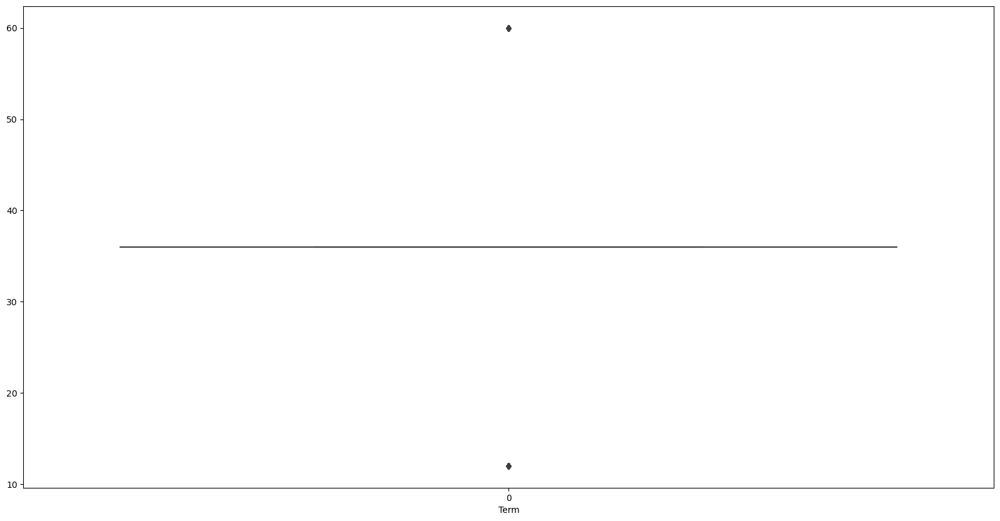

The Lower Quartile outlier is: 36.0
The 25th Percentile is: 36.0
The 50th Percentile is: 36.0
The 75th Percentile is: 36.0
The Upper Quartile outlier is: 36.0
__________________________________________________________________________________________________________________


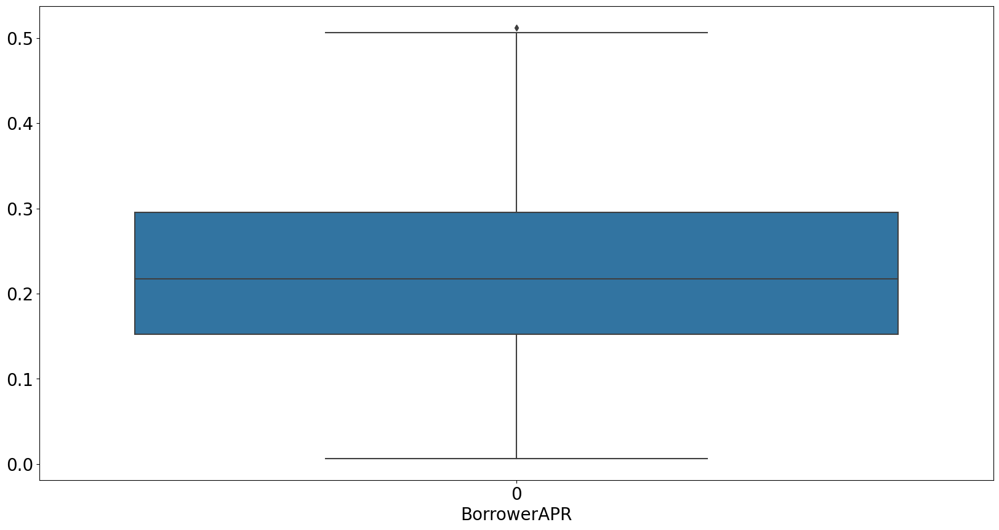

The Lower Quartile outlier is: -0.06303500000000004
The 25th Percentile is: 0.15211
The 50th Percentile is: 0.21739
The 75th Percentile is: 0.29554
The Upper Quartile outlier is: 0.5106850000000001
__________________________________________________________________________________________________________________


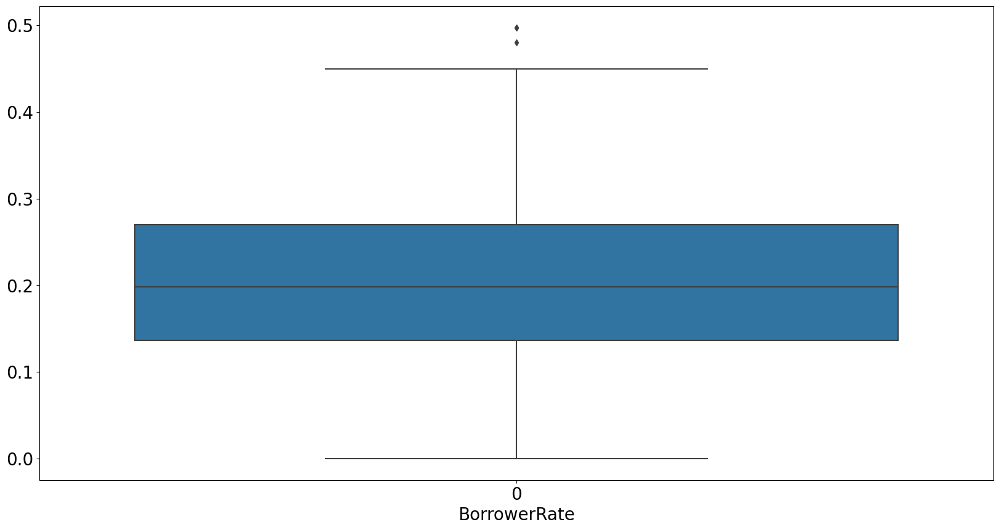

The Lower Quartile outlier is: -0.06384999999999999
The 25th Percentile is: 0.1364
The 50th Percentile is: 0.1979
The 75th Percentile is: 0.2699
The Upper Quartile outlier is: 0.47014999999999996
__________________________________________________________________________________________________________________


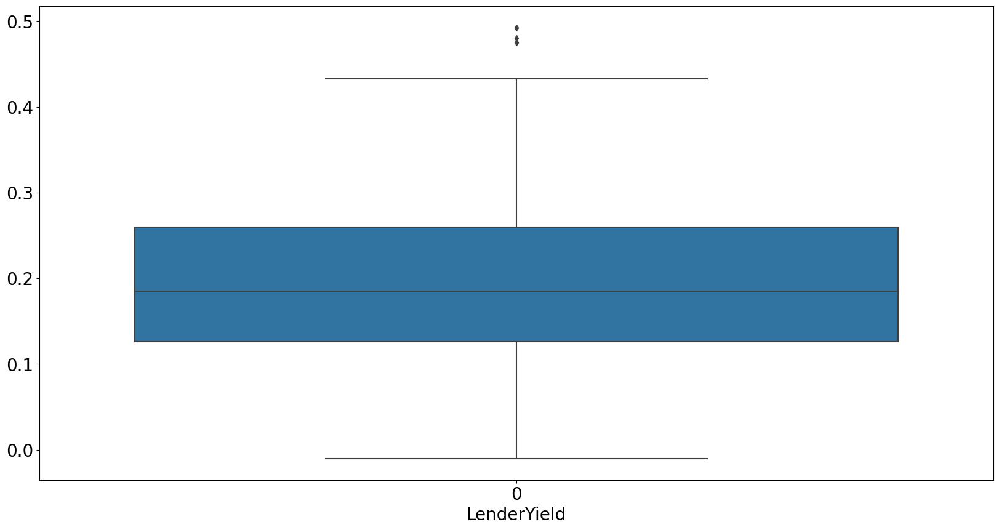

The Lower Quartile outlier is: -0.0751
The 25th Percentile is: 0.1259
The 50th Percentile is: 0.185
The 75th Percentile is: 0.2599
The Upper Quartile outlier is: 0.46090000000000003
__________________________________________________________________________________________________________________


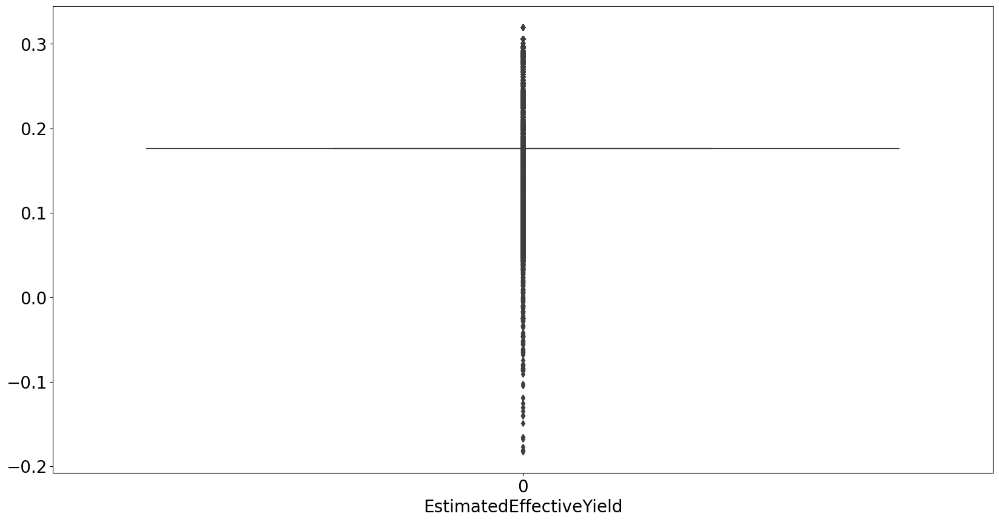

The Lower Quartile outlier is: 0.1758
The 25th Percentile is: 0.1758
The 50th Percentile is: 0.1758
The 75th Percentile is: 0.1758
The Upper Quartile outlier is: 0.1758
__________________________________________________________________________________________________________________


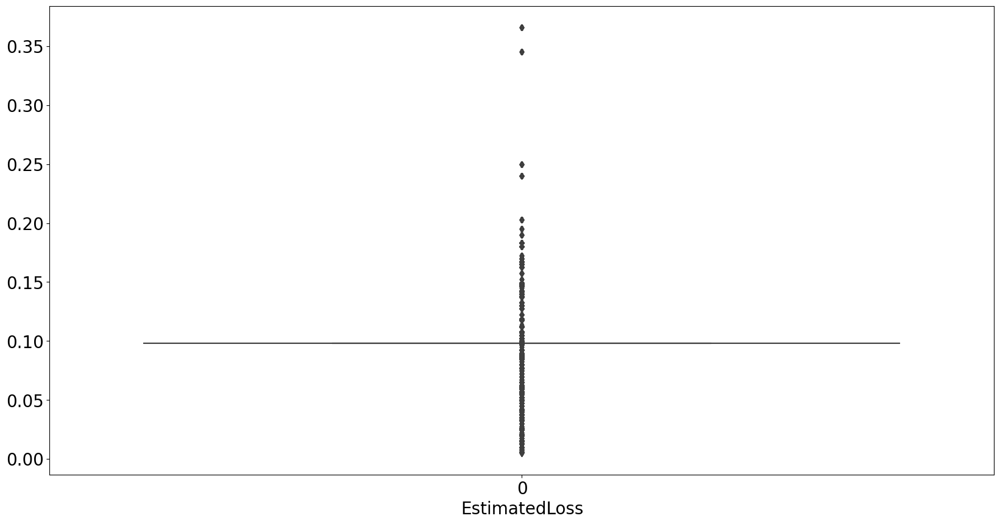

The Lower Quartile outlier is: 0.098
The 25th Percentile is: 0.098
The 50th Percentile is: 0.098
The 75th Percentile is: 0.098
The Upper Quartile outlier is: 0.098
__________________________________________________________________________________________________________________


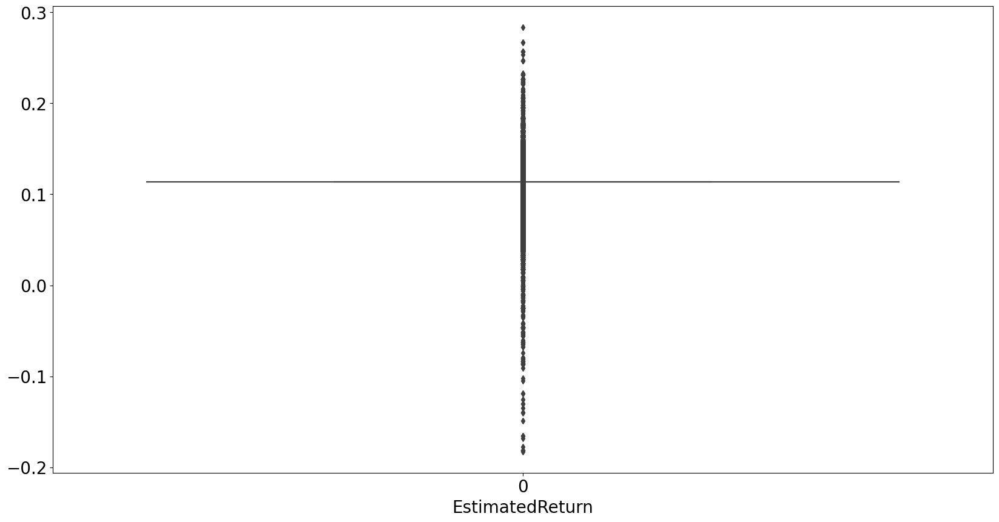

The Lower Quartile outlier is: 0.1134
The 25th Percentile is: 0.1134
The 50th Percentile is: 0.1134
The 75th Percentile is: 0.1134
The Upper Quartile outlier is: 0.1134
__________________________________________________________________________________________________________________


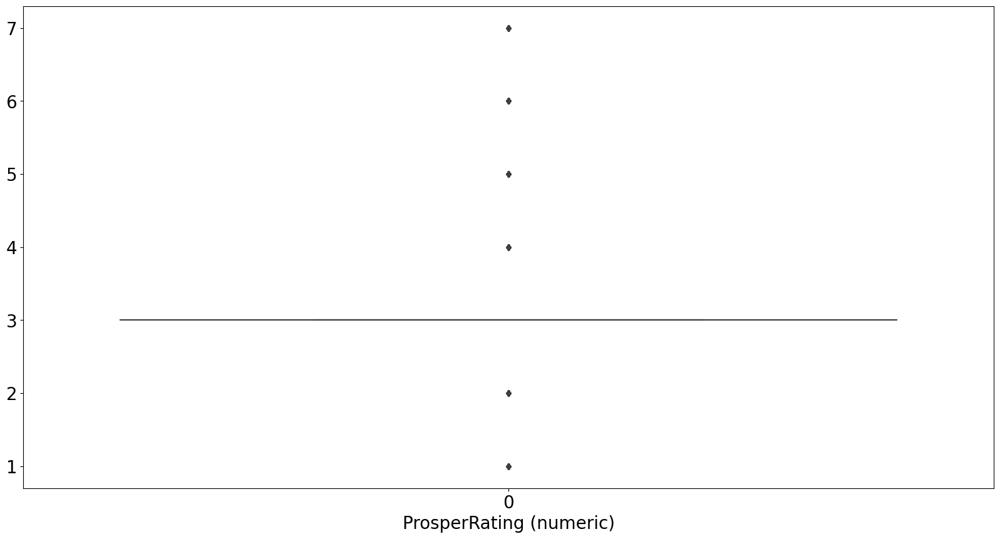

The Lower Quartile outlier is: 3.0
The 25th Percentile is: 3.0
The 50th Percentile is: 3.0
The 75th Percentile is: 3.0
The Upper Quartile outlier is: 3.0
__________________________________________________________________________________________________________________


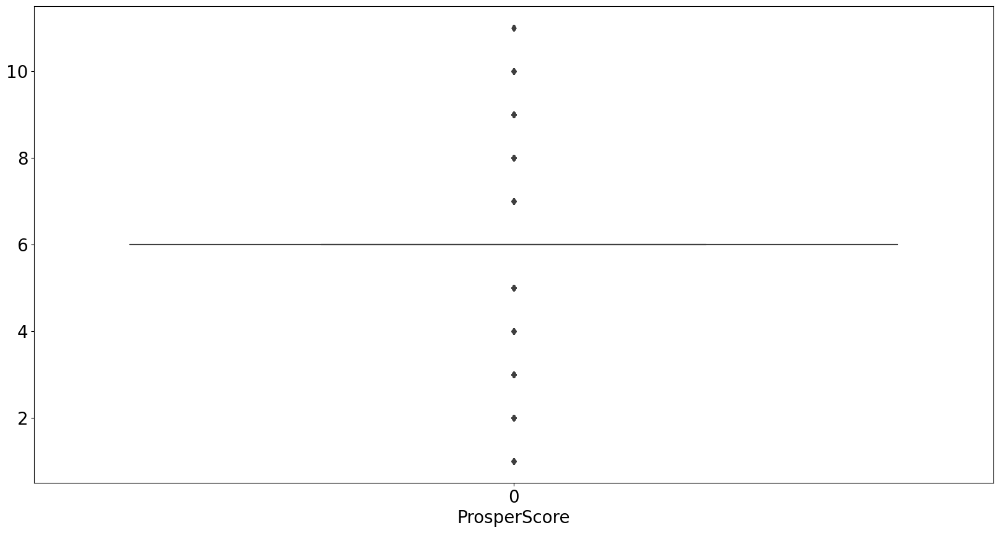

The Lower Quartile outlier is: 6.0
The 25th Percentile is: 6.0
The 50th Percentile is: 6.0
The 75th Percentile is: 6.0
The Upper Quartile outlier is: 6.0
__________________________________________________________________________________________________________________


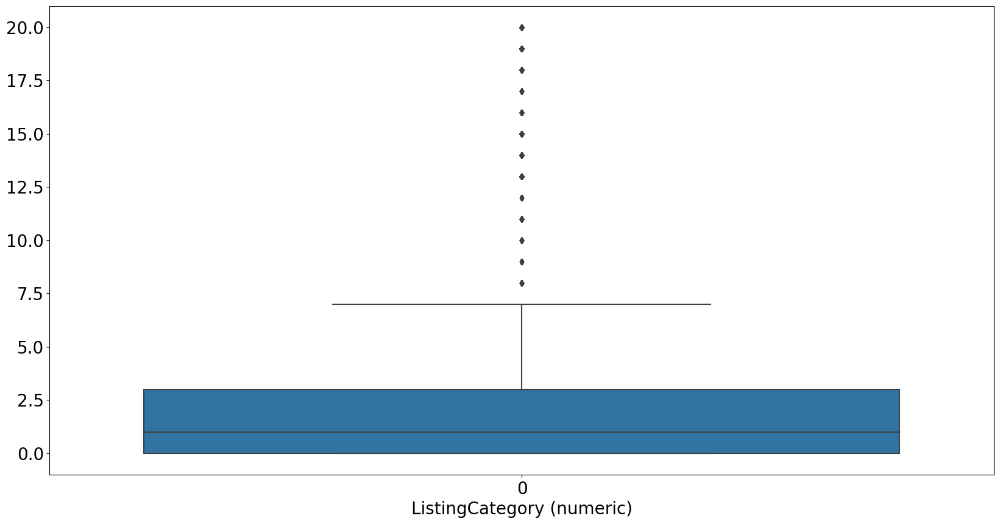

The Lower Quartile outlier is: -4.5
The 25th Percentile is: 0.0
The 50th Percentile is: 1.0
The 75th Percentile is: 3.0
The Upper Quartile outlier is: 7.5
__________________________________________________________________________________________________________________


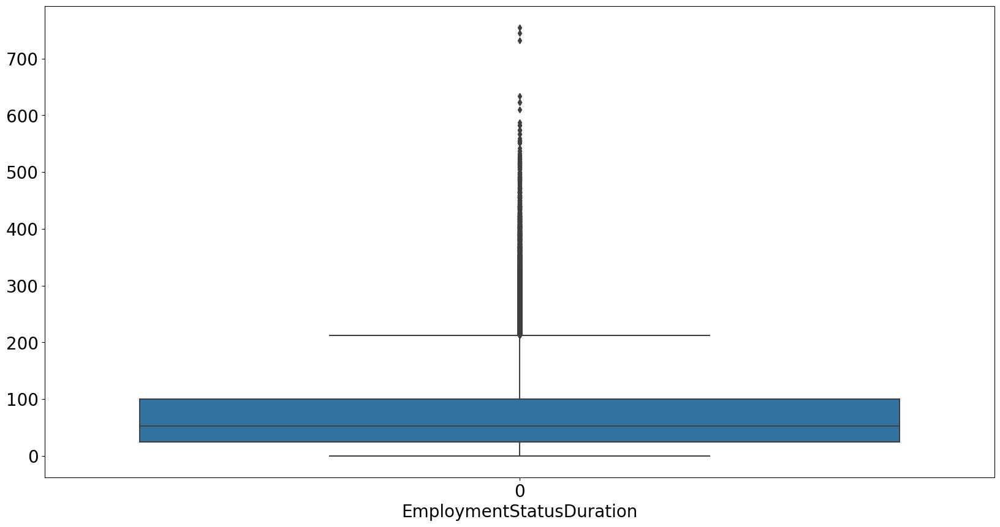

The Lower Quartile outlier is: -87.5
The 25th Percentile is: 25.0
The 50th Percentile is: 53.0
The 75th Percentile is: 100.0
The Upper Quartile outlier is: 212.5
__________________________________________________________________________________________________________________


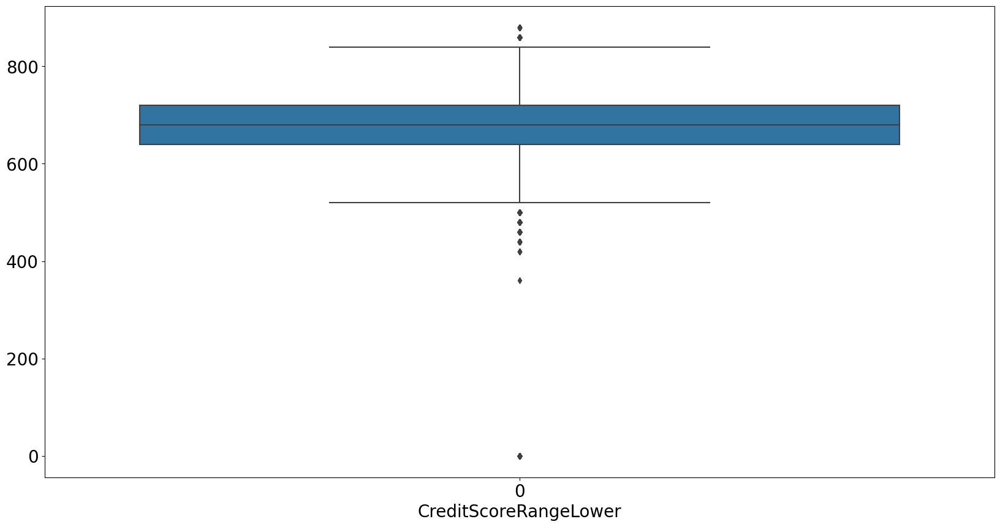

The Lower Quartile outlier is: 520.0
The 25th Percentile is: 640.0
The 50th Percentile is: 680.0
The 75th Percentile is: 720.0
The Upper Quartile outlier is: 840.0
__________________________________________________________________________________________________________________


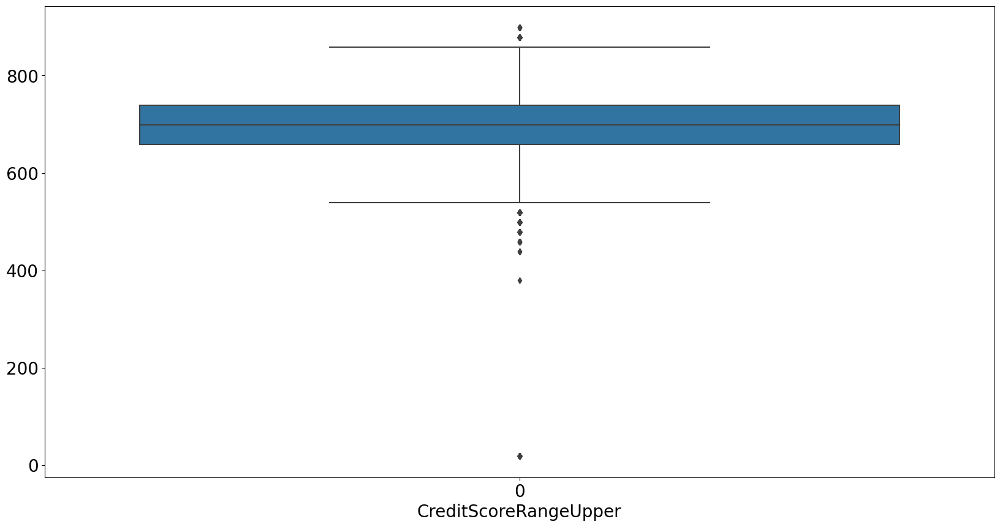

The Lower Quartile outlier is: 539.0
The 25th Percentile is: 659.0
The 50th Percentile is: 699.0
The 75th Percentile is: 739.0
The Upper Quartile outlier is: 859.0
__________________________________________________________________________________________________________________


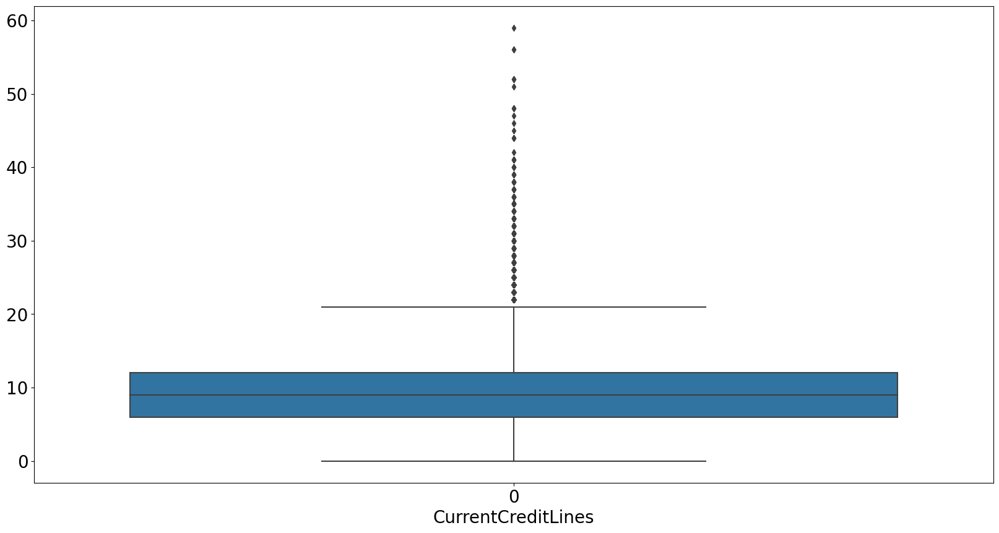

The Lower Quartile outlier is: -3.0
The 25th Percentile is: 6.0
The 50th Percentile is: 9.0
The 75th Percentile is: 12.0
The Upper Quartile outlier is: 21.0
__________________________________________________________________________________________________________________


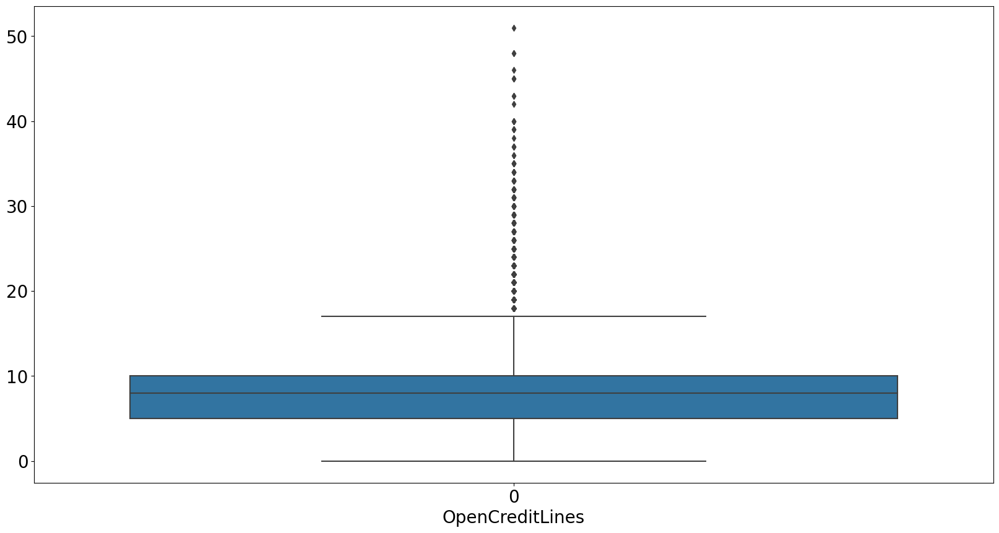

The Lower Quartile outlier is: -2.5
The 25th Percentile is: 5.0
The 50th Percentile is: 8.0
The 75th Percentile is: 10.0
The Upper Quartile outlier is: 17.5
__________________________________________________________________________________________________________________


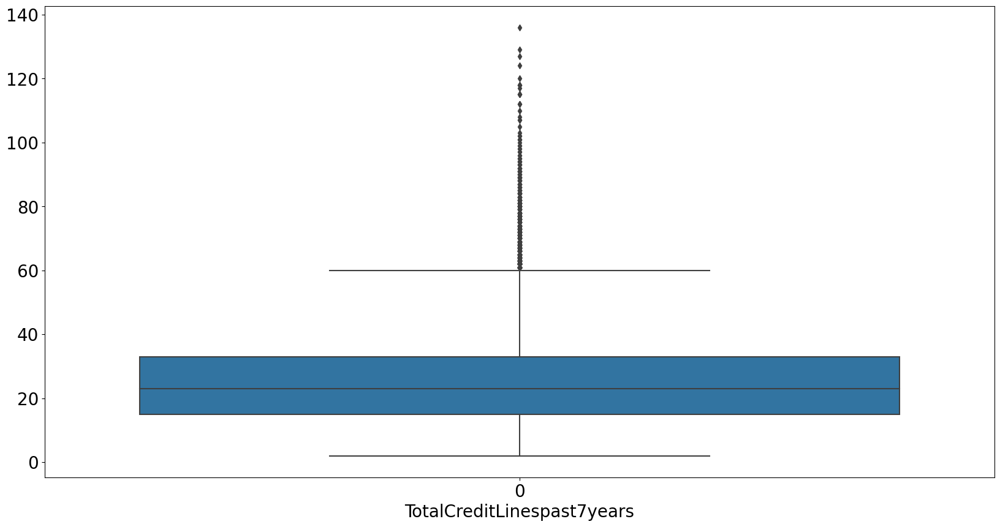

The Lower Quartile outlier is: -12.0
The 25th Percentile is: 15.0
The 50th Percentile is: 23.0
The 75th Percentile is: 33.0
The Upper Quartile outlier is: 60.0
__________________________________________________________________________________________________________________


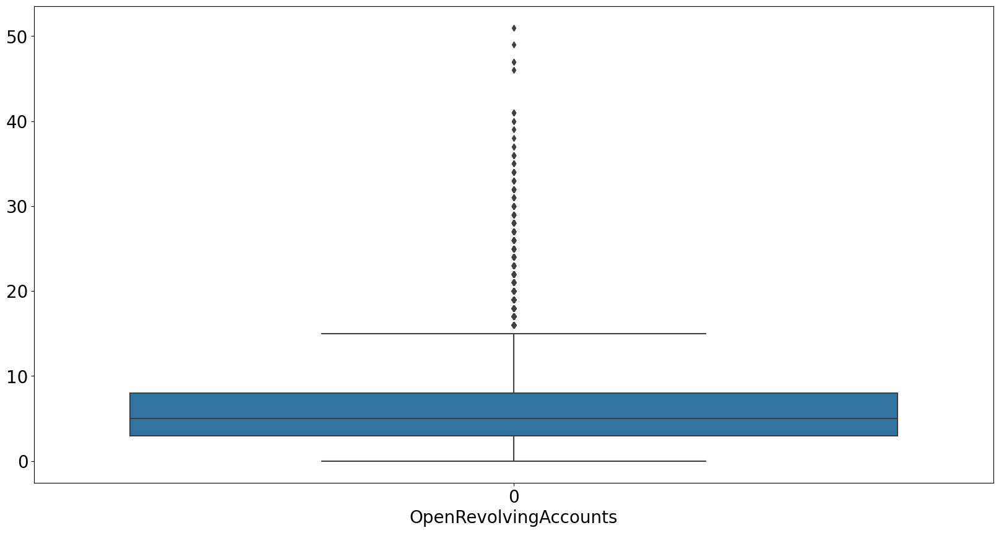

The Lower Quartile outlier is: -4.5
The 25th Percentile is: 3.0
The 50th Percentile is: 5.0
The 75th Percentile is: 8.0
The Upper Quartile outlier is: 15.5
__________________________________________________________________________________________________________________


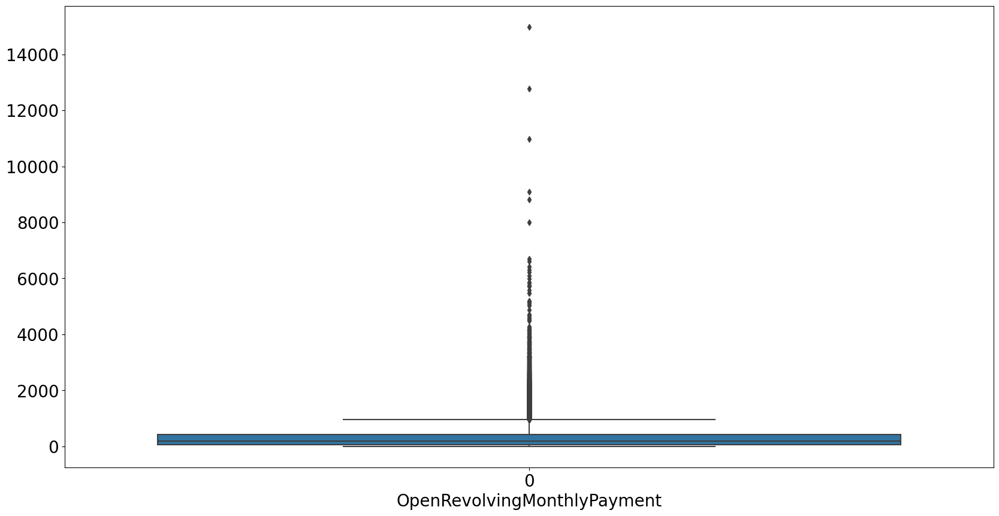

The Lower Quartile outlier is: -478.0
The 25th Percentile is: 62.0
The 50th Percentile is: 186.0
The 75th Percentile is: 422.0
The Upper Quartile outlier is: 962.0
__________________________________________________________________________________________________________________


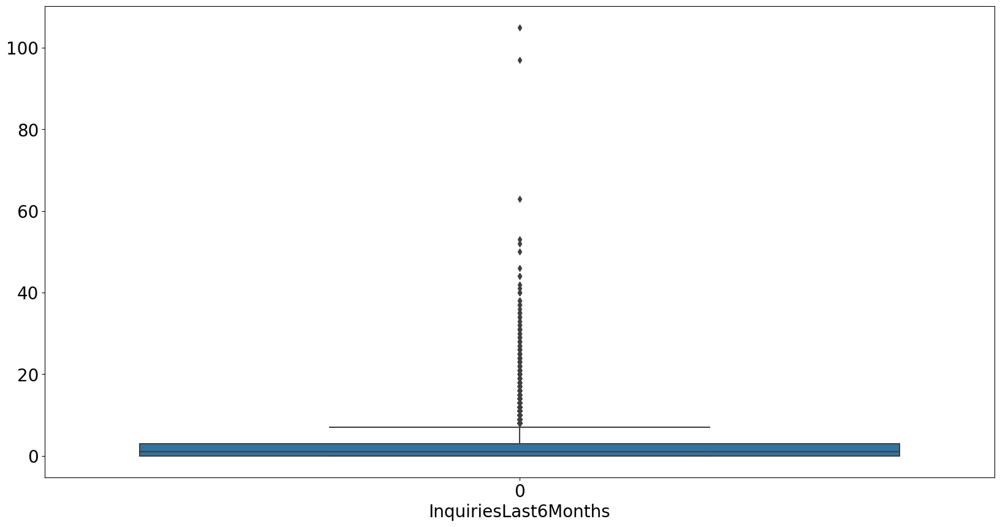

The Lower Quartile outlier is: -4.5
The 25th Percentile is: 0.0
The 50th Percentile is: 1.0
The 75th Percentile is: 3.0
The Upper Quartile outlier is: 7.5
__________________________________________________________________________________________________________________


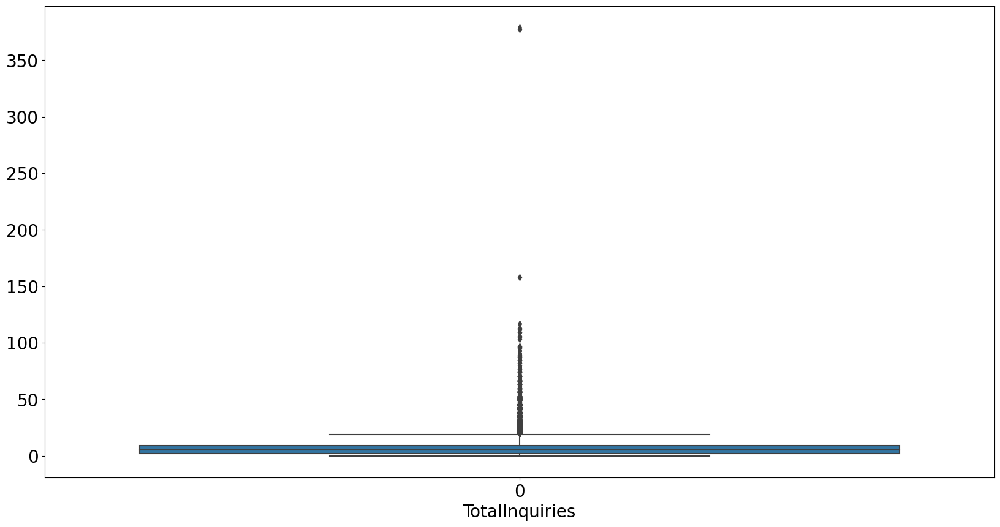

The Lower Quartile outlier is: -8.5
The 25th Percentile is: 2.0
The 50th Percentile is: 5.0
The 75th Percentile is: 9.0
The Upper Quartile outlier is: 19.5
__________________________________________________________________________________________________________________


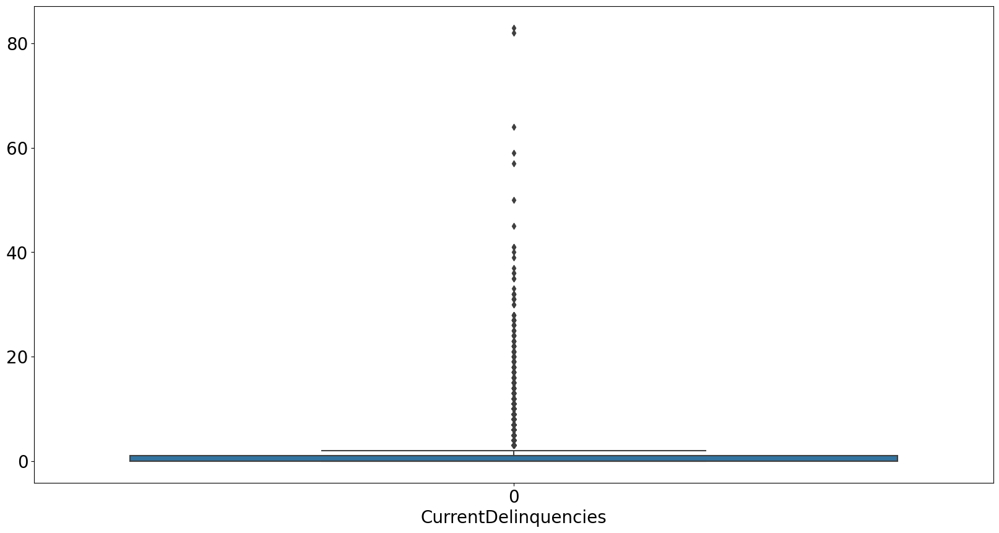

The Lower Quartile outlier is: -1.5
The 25th Percentile is: 0.0
The 50th Percentile is: 0.0
The 75th Percentile is: 1.0
The Upper Quartile outlier is: 2.5
__________________________________________________________________________________________________________________


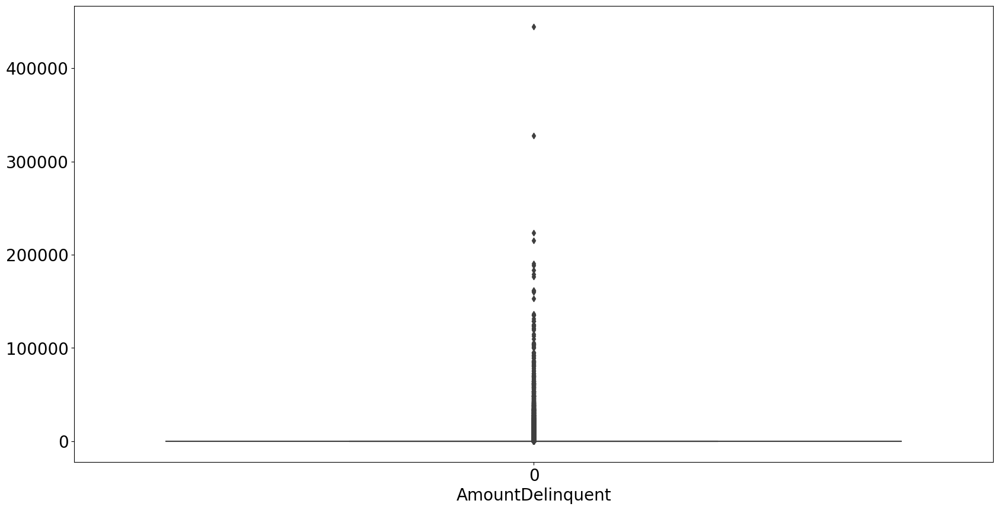

The Lower Quartile outlier is: 0.0
The 25th Percentile is: 0.0
The 50th Percentile is: 0.0
The 75th Percentile is: 0.0
The Upper Quartile outlier is: 0.0
__________________________________________________________________________________________________________________


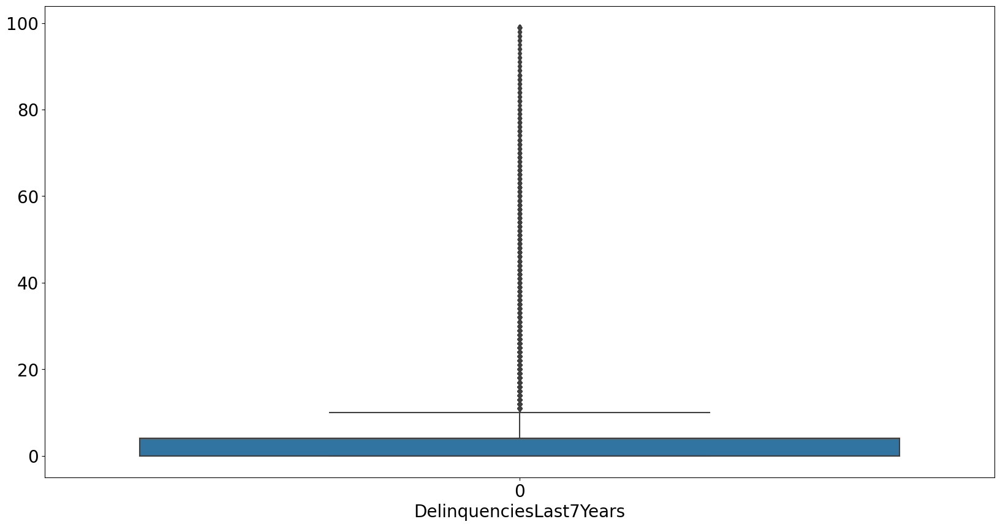

The Lower Quartile outlier is: -6.0
The 25th Percentile is: 0.0
The 50th Percentile is: 0.0
The 75th Percentile is: 4.0
The Upper Quartile outlier is: 10.0
__________________________________________________________________________________________________________________


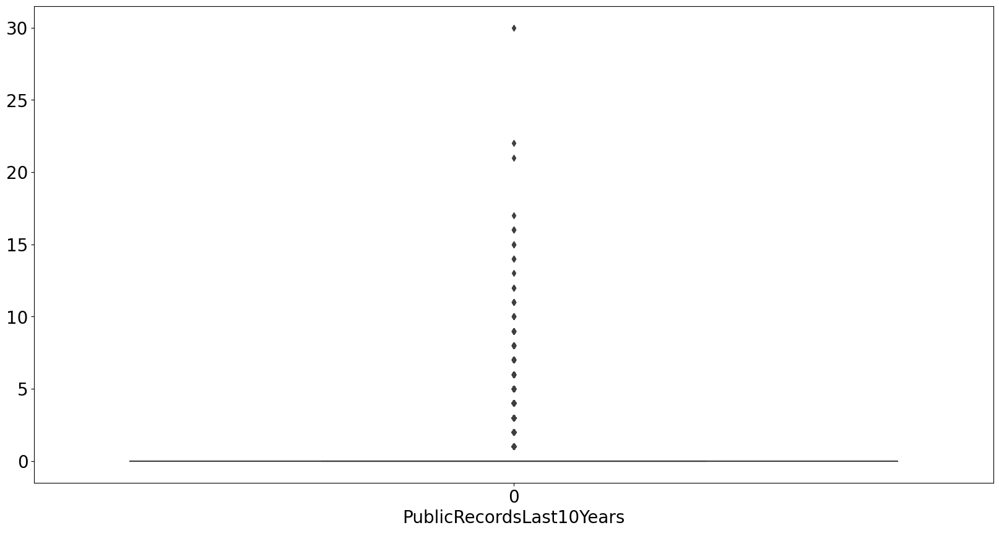

The Lower Quartile outlier is: 0.0
The 25th Percentile is: 0.0
The 50th Percentile is: 0.0
The 75th Percentile is: 0.0
The Upper Quartile outlier is: 0.0
__________________________________________________________________________________________________________________


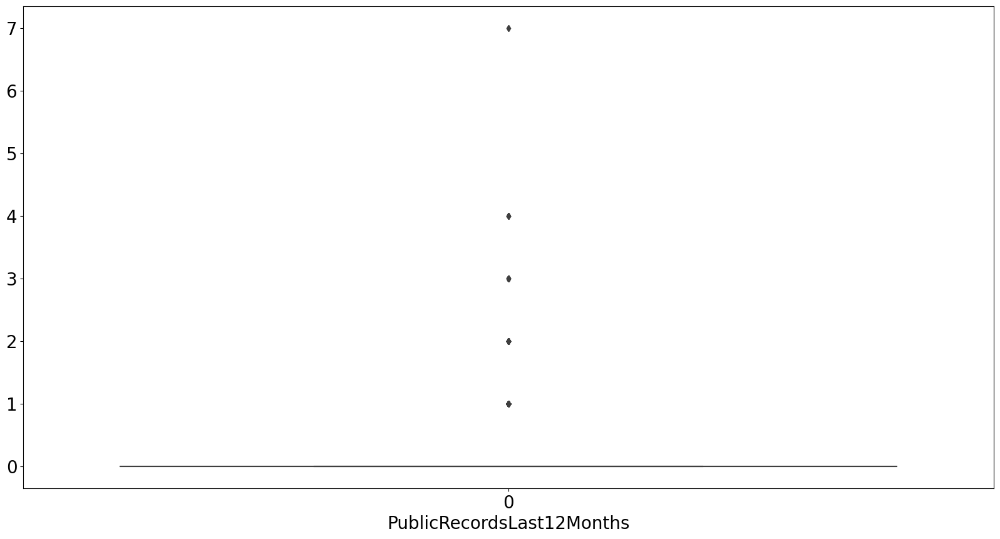

The Lower Quartile outlier is: 0.0
The 25th Percentile is: 0.0
The 50th Percentile is: 0.0
The 75th Percentile is: 0.0
The Upper Quartile outlier is: 0.0
__________________________________________________________________________________________________________________


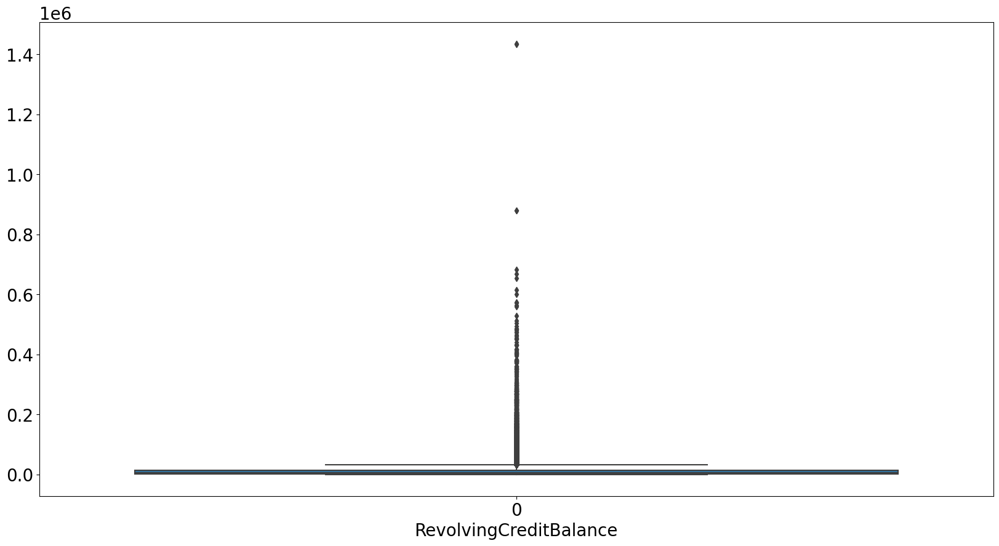

The Lower Quartile outlier is: -15468.625
The 25th Percentile is: 2159.0
The 50th Percentile is: 6113.5
The 75th Percentile is: 13910.75
The Upper Quartile outlier is: 31538.375
__________________________________________________________________________________________________________________


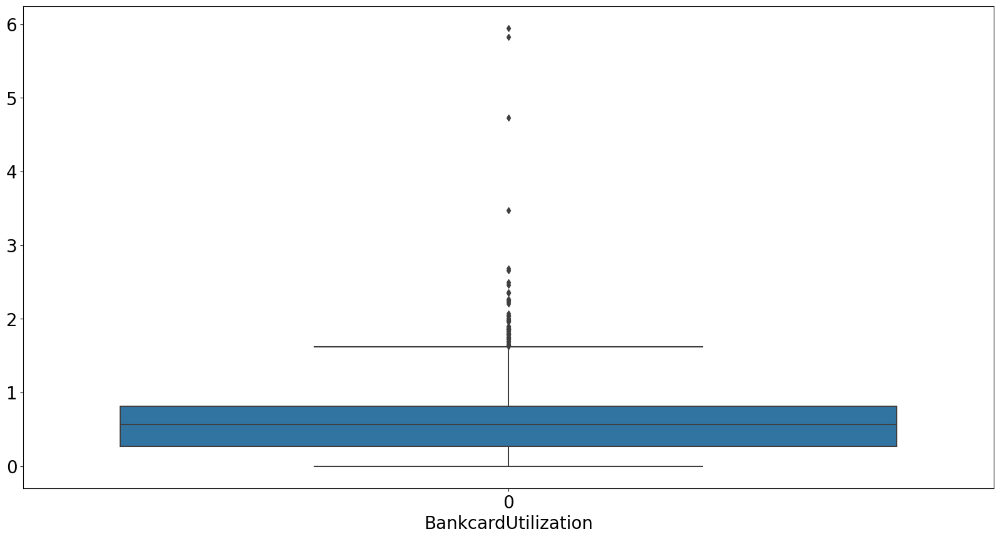

The Lower Quartile outlier is: -0.54
The 25th Percentile is: 0.27
The 50th Percentile is: 0.57
The 75th Percentile is: 0.81
The Upper Quartile outlier is: 1.62
__________________________________________________________________________________________________________________


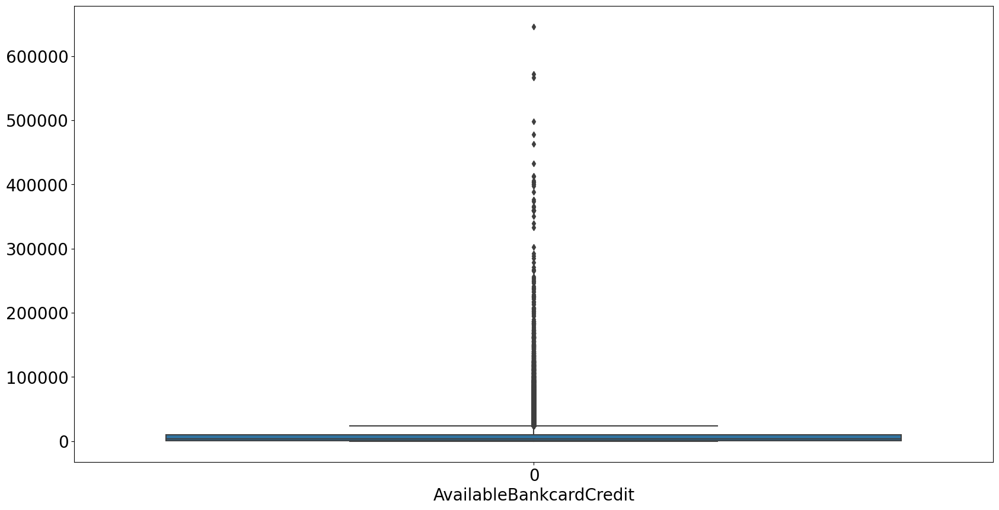

The Lower Quartile outlier is: -12828.875
The 25th Percentile is: 738.25
The 50th Percentile is: 3229.5
The 75th Percentile is: 9783.0
The Upper Quartile outlier is: 23350.125
__________________________________________________________________________________________________________________


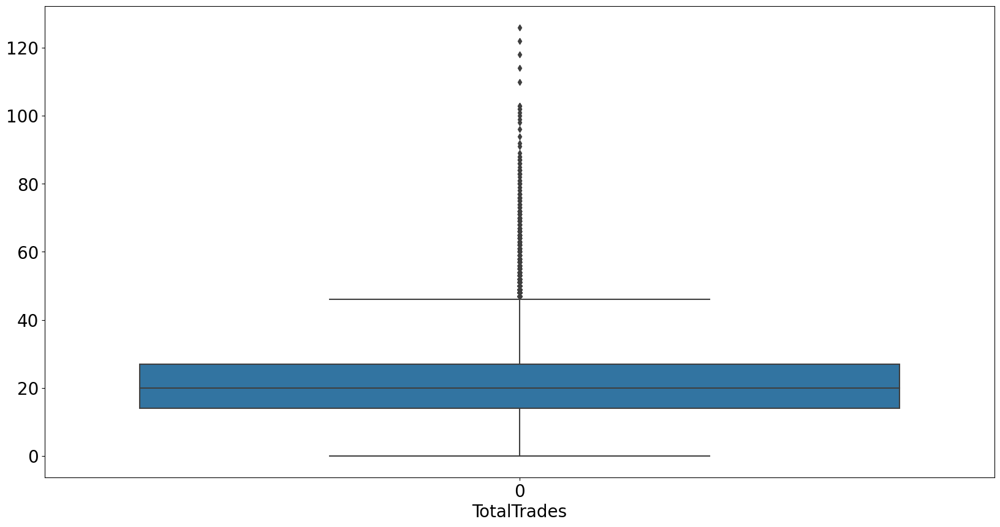

The Lower Quartile outlier is: -5.5
The 25th Percentile is: 14.0
The 50th Percentile is: 20.0
The 75th Percentile is: 27.0
The Upper Quartile outlier is: 46.5
__________________________________________________________________________________________________________________


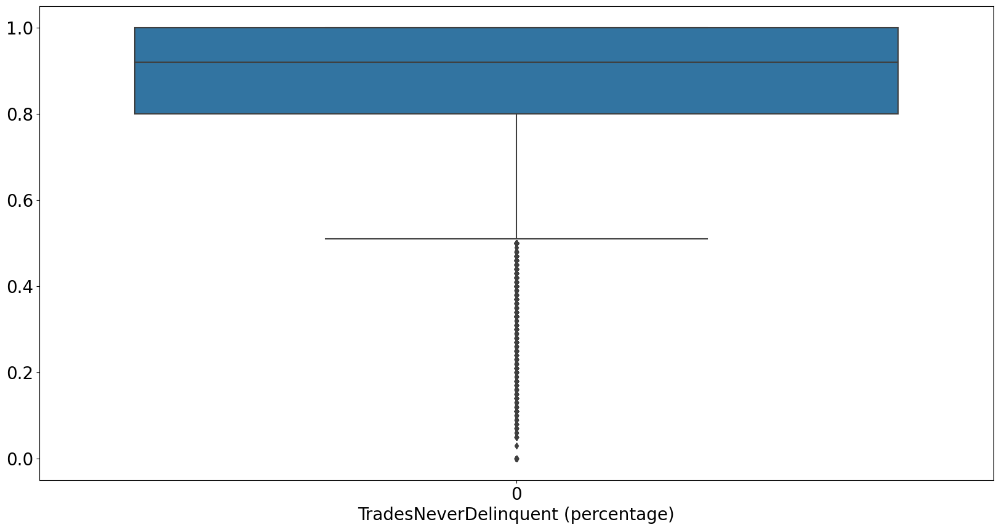

The Lower Quartile outlier is: 0.5000000000000001
The 25th Percentile is: 0.8
The 50th Percentile is: 0.92
The 75th Percentile is: 1.0
The Upper Quartile outlier is: 1.2999999999999998
__________________________________________________________________________________________________________________


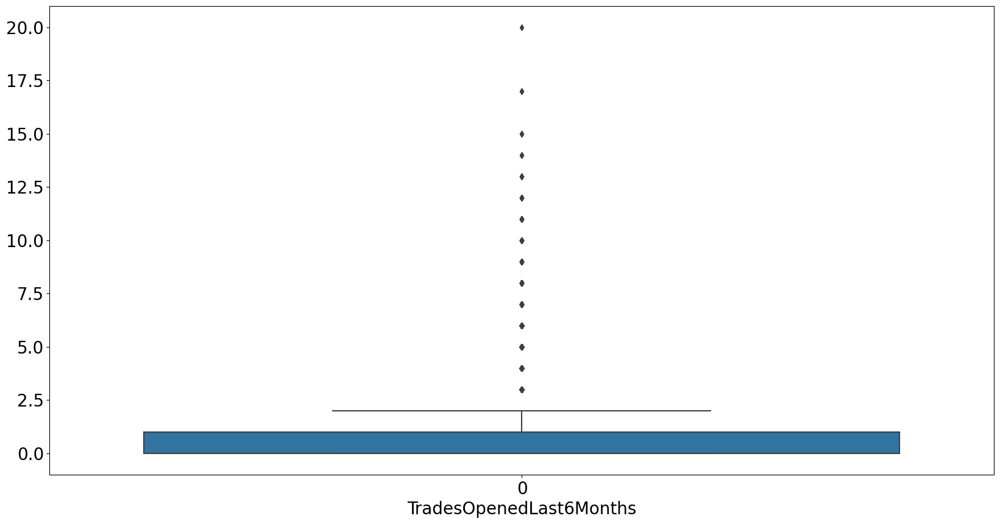

The Lower Quartile outlier is: -1.5
The 25th Percentile is: 0.0
The 50th Percentile is: 1.0
The 75th Percentile is: 1.0
The Upper Quartile outlier is: 2.5
__________________________________________________________________________________________________________________


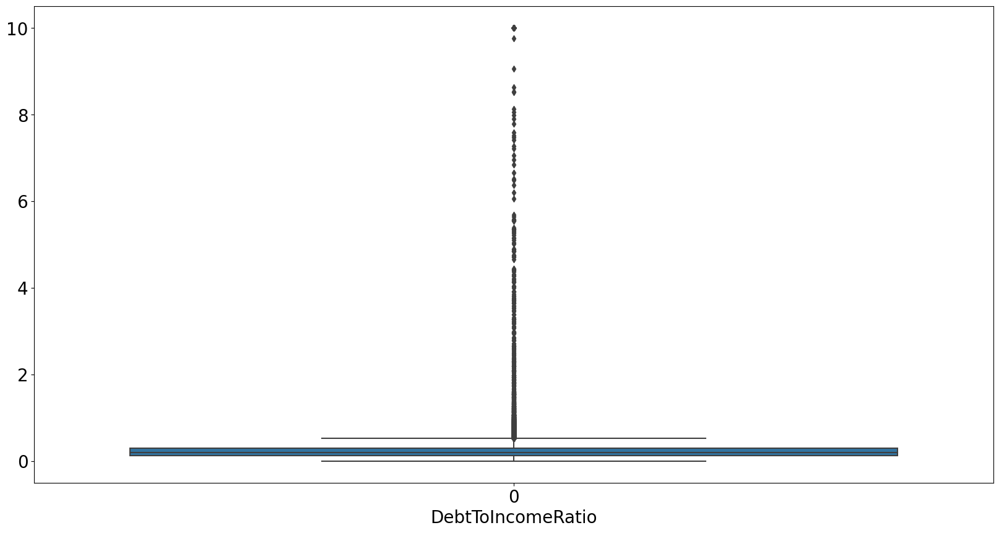

The Lower Quartile outlier is: -0.10999999999999996
The 25th Percentile is: 0.13
The 50th Percentile is: 0.2
The 75th Percentile is: 0.29
The Upper Quartile outlier is: 0.5299999999999999
__________________________________________________________________________________________________________________


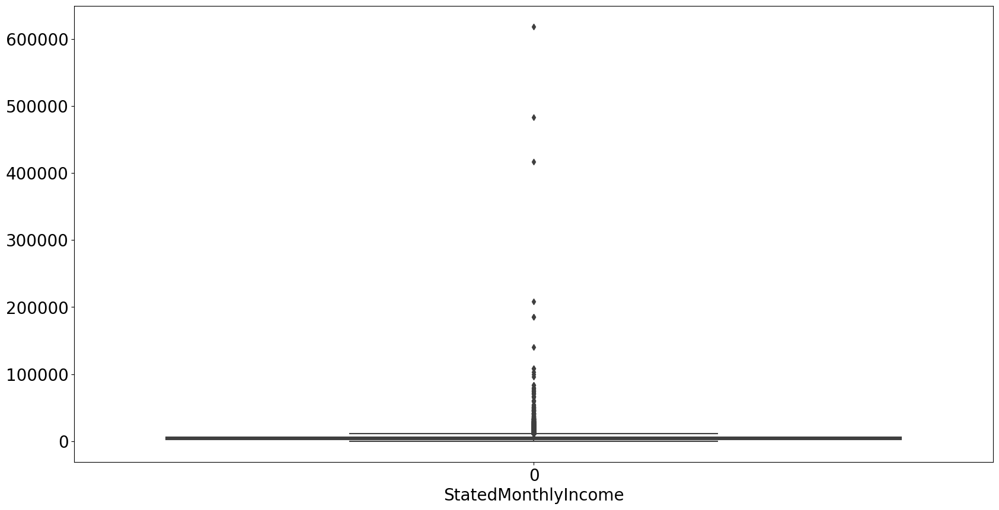

The Lower Quartile outlier is: -2291.6666675
The 25th Percentile is: 2833.333333
The 50th Percentile is: 4166.666667
The 75th Percentile is: 6250.0
The Upper Quartile outlier is: 11375.0000005
__________________________________________________________________________________________________________________


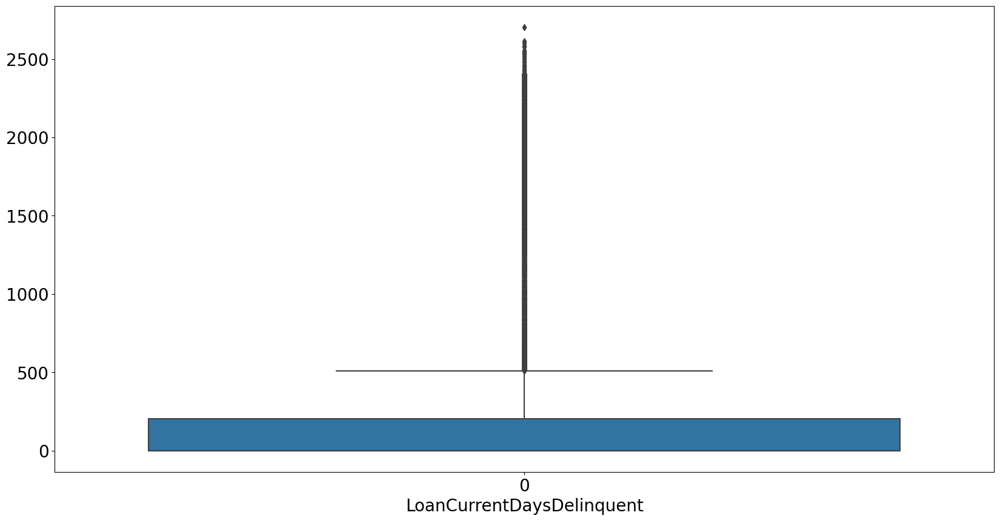

The Lower Quartile outlier is: -306.0
The 25th Percentile is: 0.0
The 50th Percentile is: 0.0
The 75th Percentile is: 204.0
The Upper Quartile outlier is: 510.0
__________________________________________________________________________________________________________________


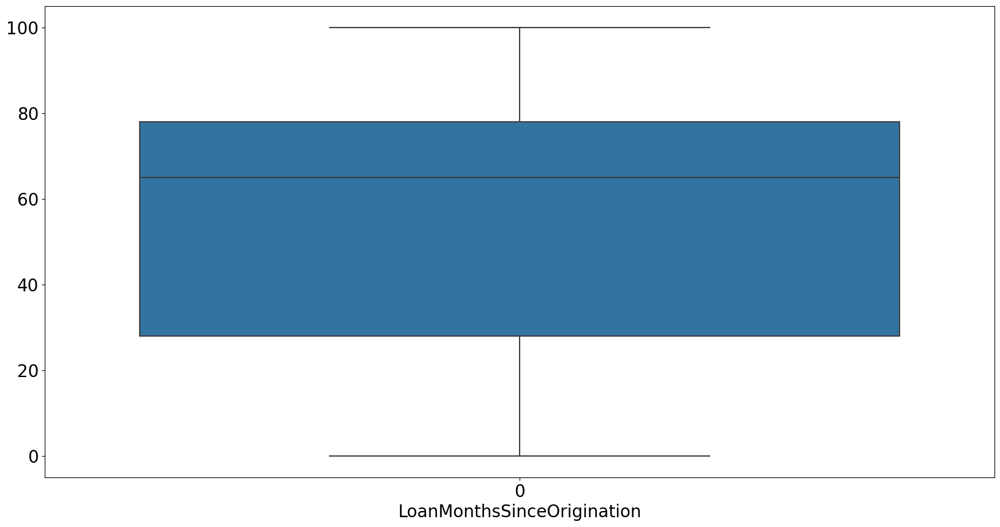

The Lower Quartile outlier is: -47.0
The 25th Percentile is: 28.0
The 50th Percentile is: 65.0
The 75th Percentile is: 78.0
The Upper Quartile outlier is: 153.0
__________________________________________________________________________________________________________________


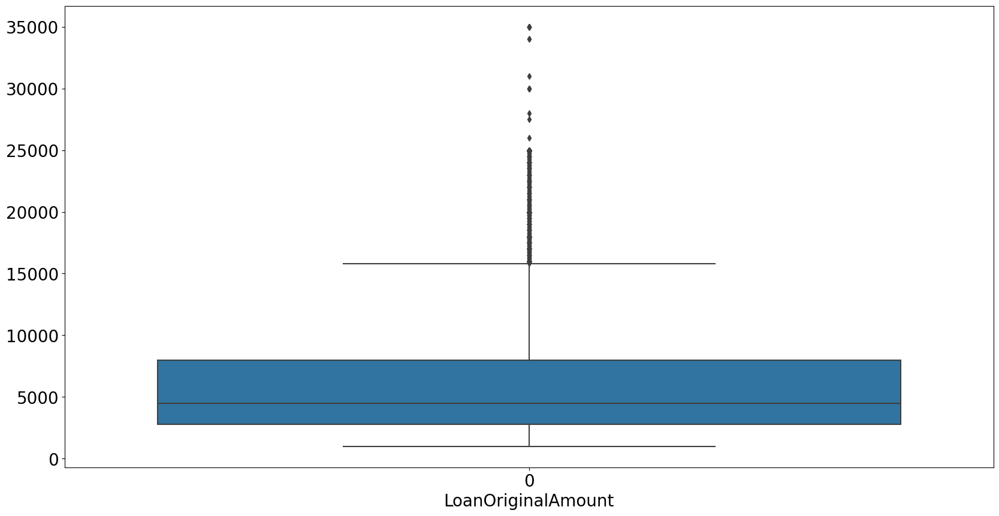

The Lower Quartile outlier is: -5000.0
The 25th Percentile is: 2800.0
The 50th Percentile is: 4500.0
The 75th Percentile is: 8000.0
The Upper Quartile outlier is: 15800.0
__________________________________________________________________________________________________________________


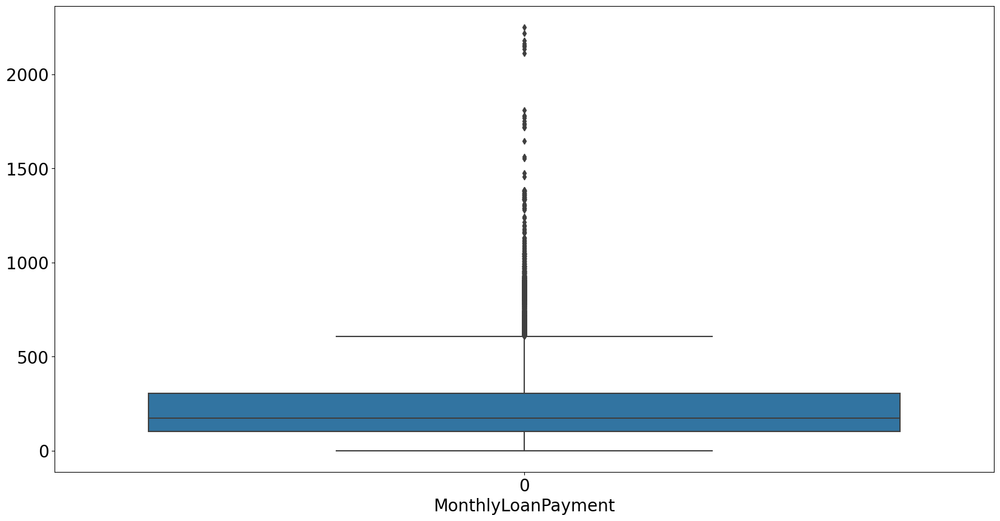

The Lower Quartile outlier is: -203.73125000000005
The 25th Percentile is: 100.8175
The 50th Percentile is: 173.71
The 75th Percentile is: 303.85
The Upper Quartile outlier is: 608.3987500000001
__________________________________________________________________________________________________________________


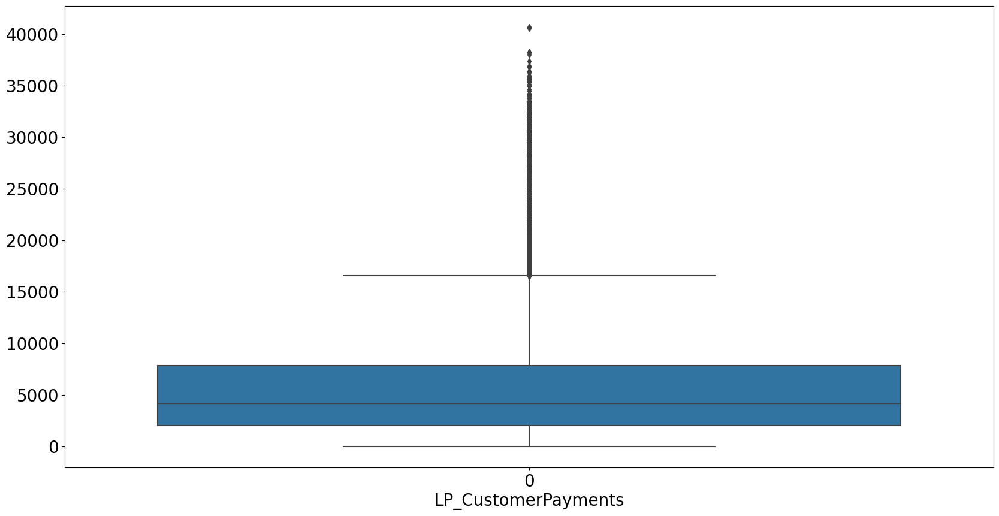

The Lower Quartile outlier is: -6715.665
The 25th Percentile is: 2004.6299999999999
The 50th Percentile is: 4148.9349999999995
The 75th Percentile is: 7818.16
The Upper Quartile outlier is: 16538.455
__________________________________________________________________________________________________________________


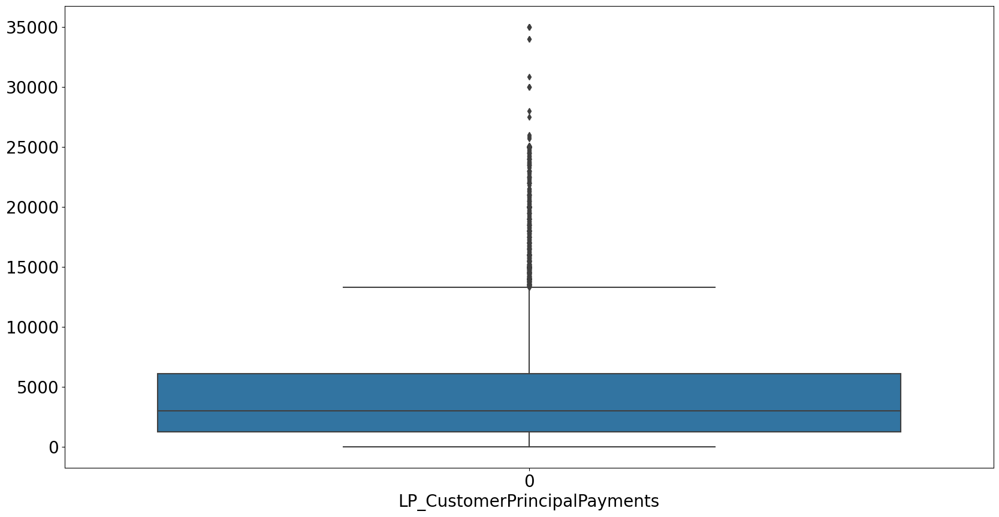

The Lower Quartile outlier is: -5978.805
The 25th Percentile is: 1249.98
The 50th Percentile is: 3000.05
The 75th Percentile is: 6069.17
The Upper Quartile outlier is: 13297.955000000002
__________________________________________________________________________________________________________________


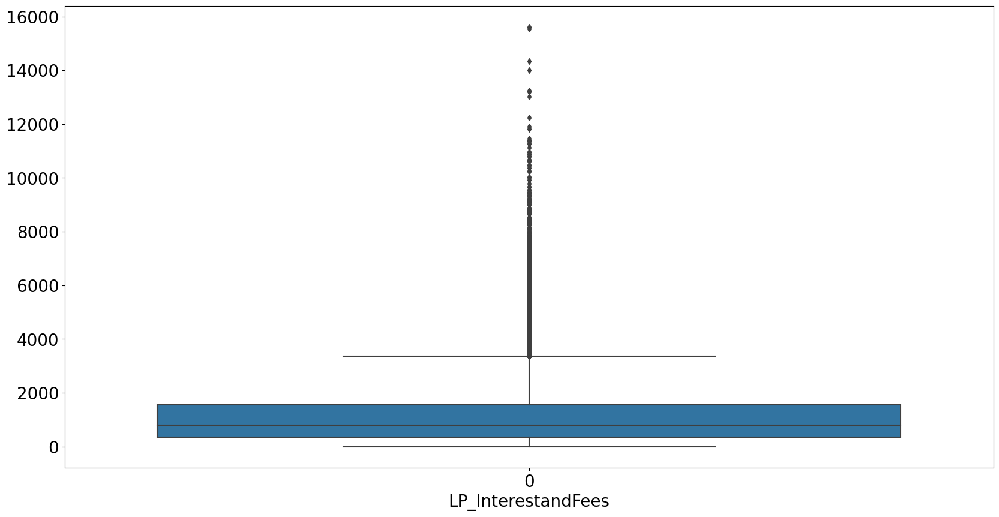

The Lower Quartile outlier is: -1471.7937499999998
The 25th Percentile is: 339.0625
The 50th Percentile is: 783.6600000000001
The 75th Percentile is: 1546.3
The Upper Quartile outlier is: 3357.15625
__________________________________________________________________________________________________________________


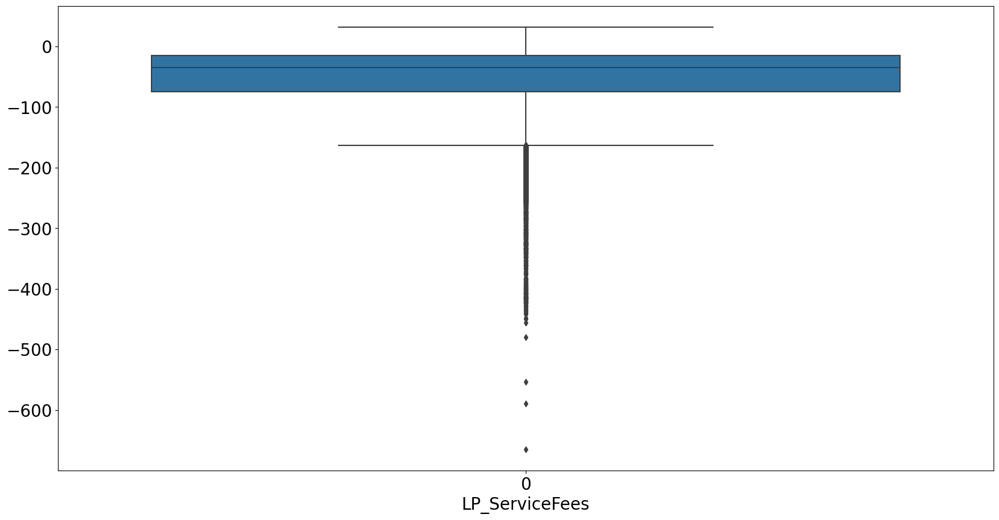

The Lower Quartile outlier is: -163.24874999999997
The 25th Percentile is: -74.3175
The 50th Percentile is: -35.065
The 75th Percentile is: -15.03
The Upper Quartile outlier is: 73.90124999999999
__________________________________________________________________________________________________________________


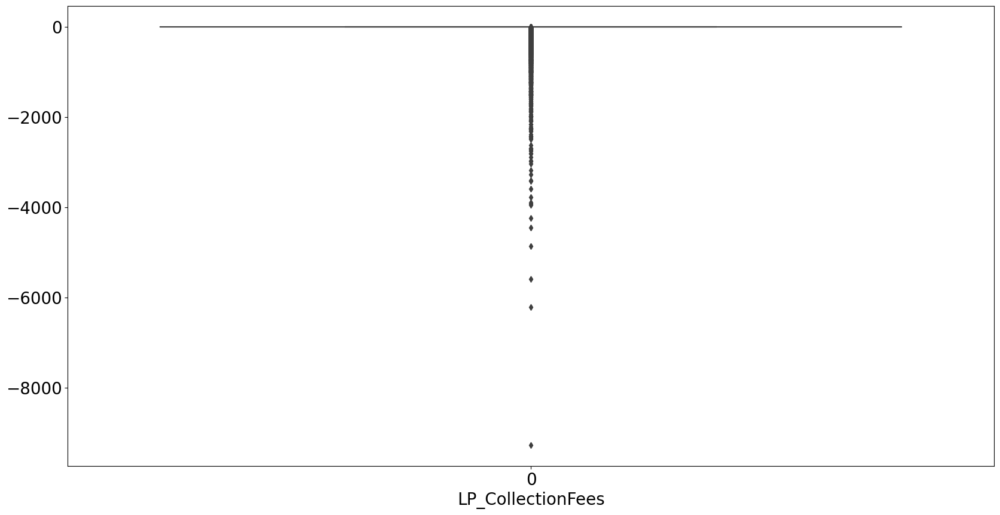

The Lower Quartile outlier is: 0.0
The 25th Percentile is: 0.0
The 50th Percentile is: 0.0
The 75th Percentile is: 0.0
The Upper Quartile outlier is: 0.0
__________________________________________________________________________________________________________________


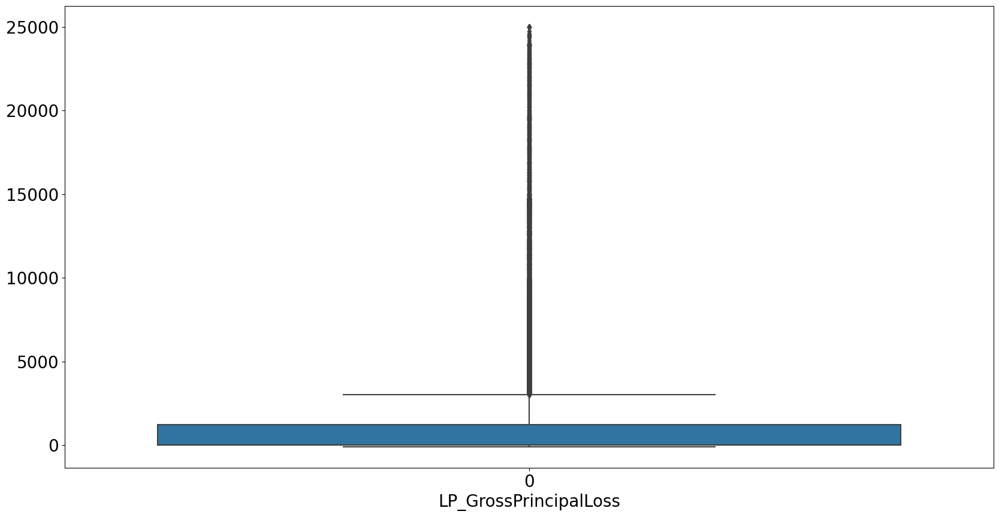

The Lower Quartile outlier is: -1816.875
The 25th Percentile is: 0.0
The 50th Percentile is: 0.0
The 75th Percentile is: 1211.25
The Upper Quartile outlier is: 3028.125
__________________________________________________________________________________________________________________


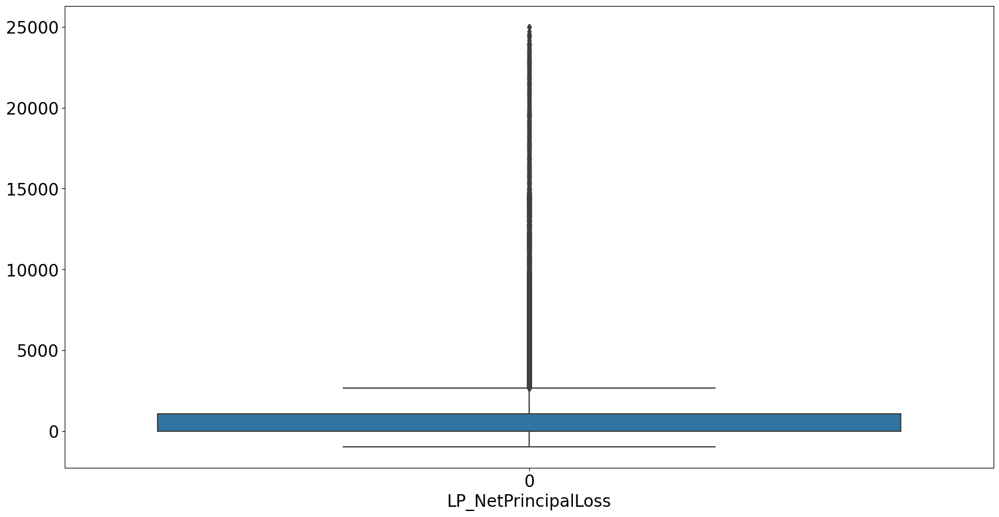

The Lower Quartile outlier is: -1601.3325
The 25th Percentile is: 0.0
The 50th Percentile is: 0.0
The 75th Percentile is: 1067.555
The Upper Quartile outlier is: 2668.8875
__________________________________________________________________________________________________________________


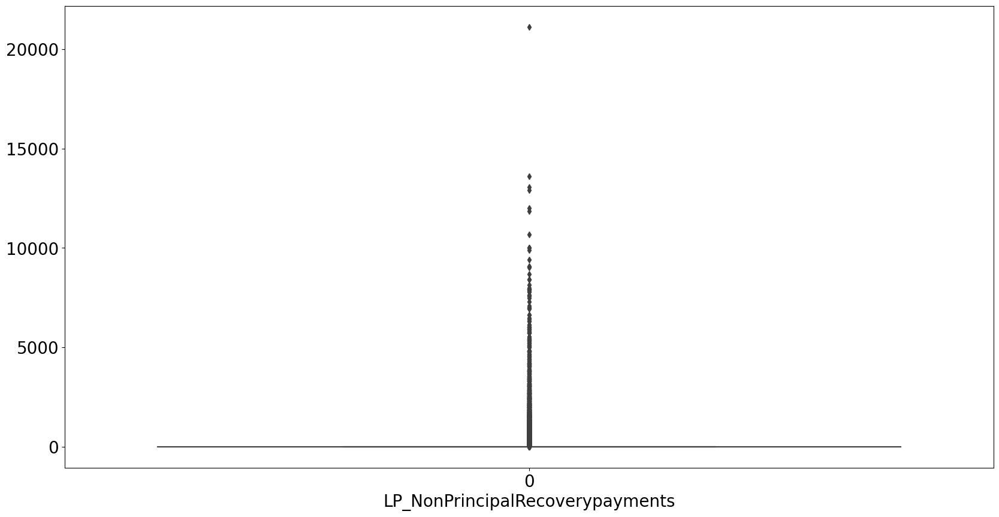

The Lower Quartile outlier is: 0.0
The 25th Percentile is: 0.0
The 50th Percentile is: 0.0
The 75th Percentile is: 0.0
The Upper Quartile outlier is: 0.0
__________________________________________________________________________________________________________________


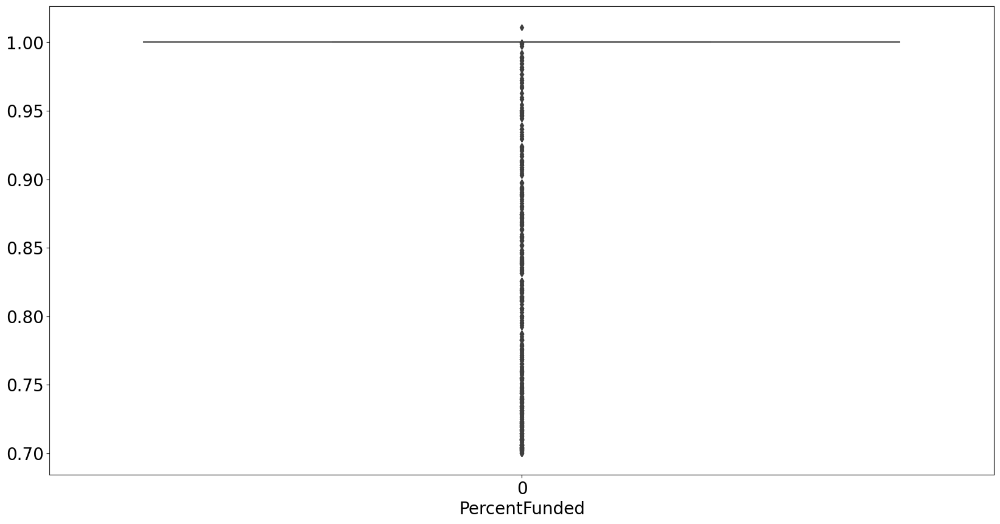

The Lower Quartile outlier is: 1.0
The 25th Percentile is: 1.0
The 50th Percentile is: 1.0
The 75th Percentile is: 1.0
The Upper Quartile outlier is: 1.0
__________________________________________________________________________________________________________________


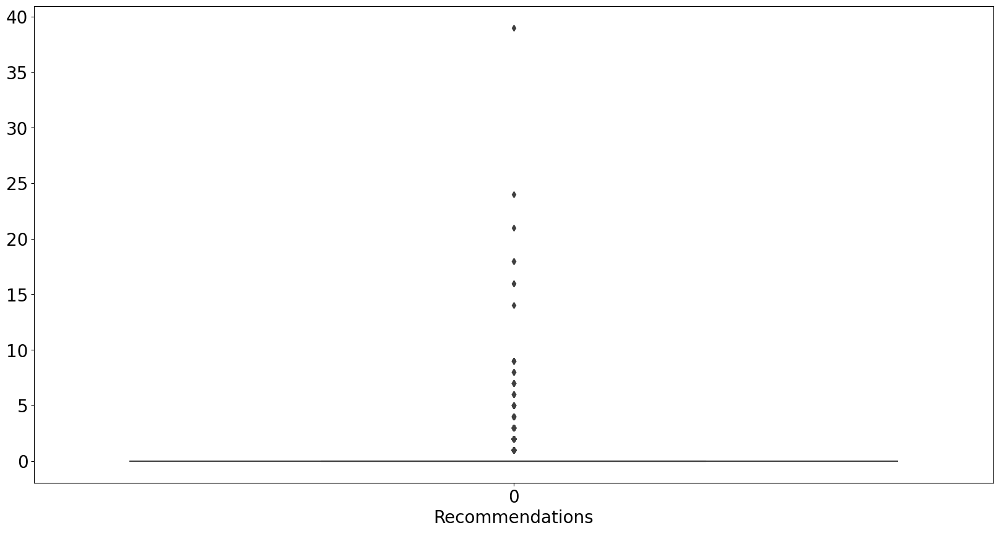

The Lower Quartile outlier is: 0.0
The 25th Percentile is: 0.0
The 50th Percentile is: 0.0
The 75th Percentile is: 0.0
The Upper Quartile outlier is: 0.0
__________________________________________________________________________________________________________________


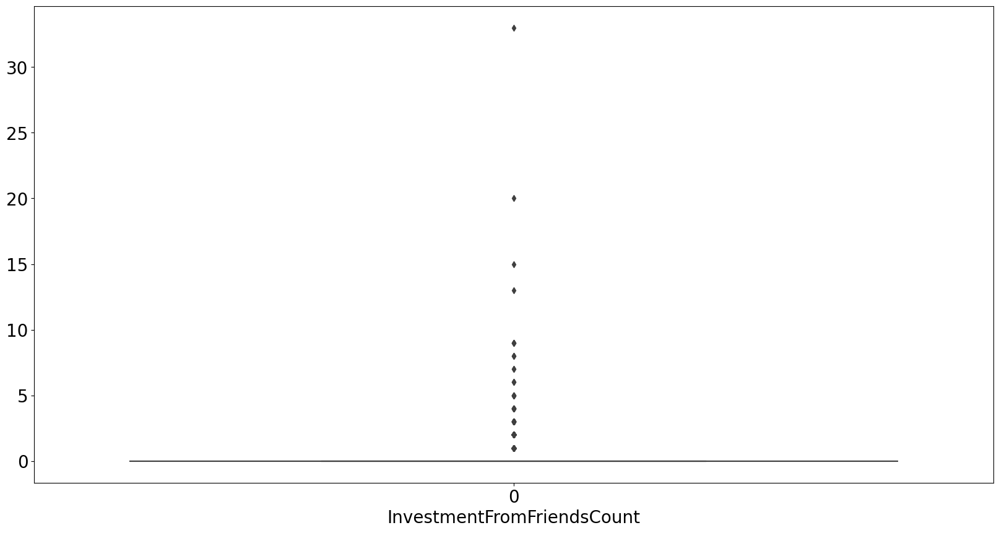

The Lower Quartile outlier is: 0.0
The 25th Percentile is: 0.0
The 50th Percentile is: 0.0
The 75th Percentile is: 0.0
The Upper Quartile outlier is: 0.0
__________________________________________________________________________________________________________________


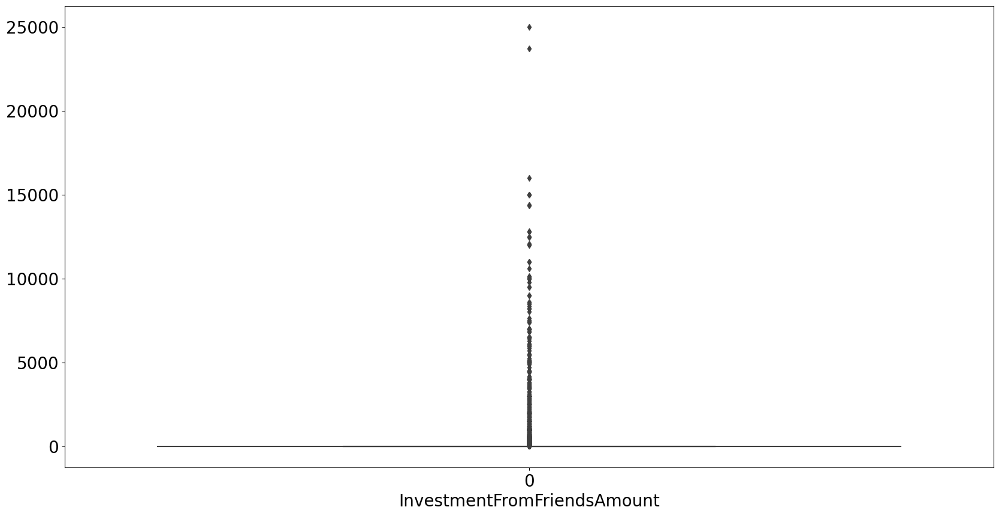

The Lower Quartile outlier is: 0.0
The 25th Percentile is: 0.0
The 50th Percentile is: 0.0
The 75th Percentile is: 0.0
The Upper Quartile outlier is: 0.0
__________________________________________________________________________________________________________________


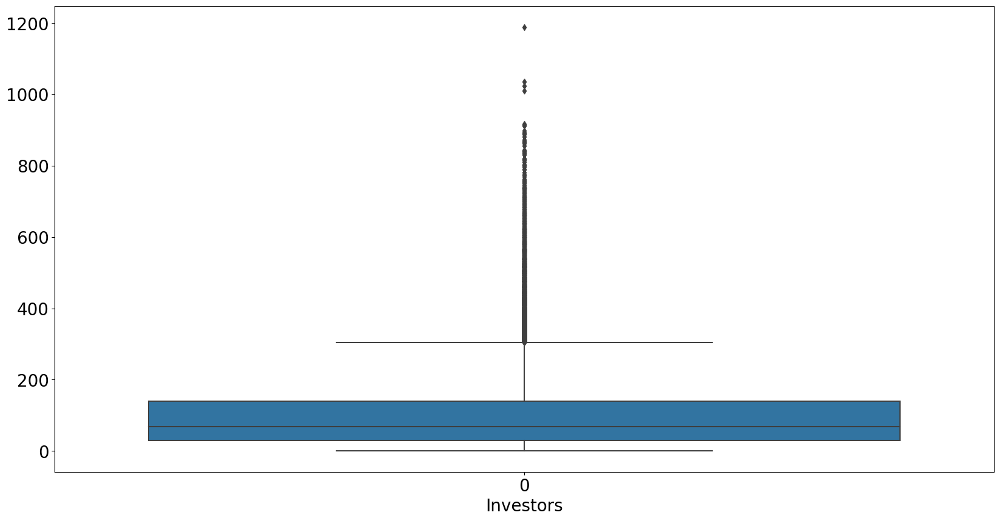

The Lower Quartile outlier is: -135.0
The 25th Percentile is: 30.0
The 50th Percentile is: 68.0
The 75th Percentile is: 140.0
The Upper Quartile outlier is: 305.0
__________________________________________________________________________________________________________________


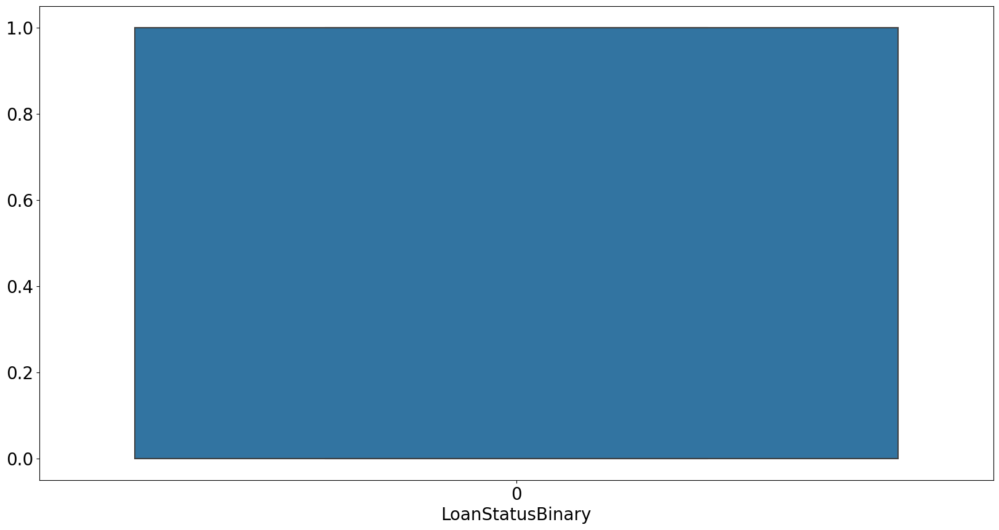

The Lower Quartile outlier is: -1.5
The 25th Percentile is: 0.0
The 50th Percentile is: 1.0
The 75th Percentile is: 1.0
The Upper Quartile outlier is: 2.5
__________________________________________________________________________________________________________________


In [30]:
numerical_columns = data.select_dtypes(include=np.number).columns
for feature in numerical_columns :
    fig = plt.subplots(figsize=(20, 10))
    plt.rcParams.update({'font.size': 20})
    sns.boxplot(data[feature])
    plt.xlabel(feature)
    plt.show()
    show_percentiles_and_quartiles(feature)
    print("__________________________________________________________________________________________________________________")

> __The outliers in some features will be remained as it is ( will not be handled ) as they don't have box plot as shown in the previous plotting .__

## Handling outliers 

In [31]:
# To replace outliers in specific features whether with max , min values in the column 
for x in (data[['CreditScoreRangeUpper','LP_InterestandFees','LP_ServiceFees','LenderYield','MonthlyLoanPayment',
                'OpenCreditLines','OpenRevolvingAccounts','RevolvingCreditBalance','TotalTrades']]):
    Q3,Q1 = np.percentile(data.loc[:,x],[75,25])
    IQR = Q3-Q1
 
    max = Q3+(1.5*IQR)
    min = Q1-(1.5*IQR)
  
    data.loc[data[x] > max,x] = max
    data.loc[data[x] <min,x] = min

In [32]:
print ( data.shape )
data.head()

(57522, 65)


,ListingCreationDate,CreditGrade,Term,ClosedDate,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,...,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors,LoanStatusBinary
0,09:29.3,C,36,14/08/2009 00:00,0.16516,0.1580,0.1380,0.1758,0.0980,0.1134,...,0.0,0.00,0.00,0.0,1.0,0,0,0.0,258,1
1,00:47.1,HR,36,17/12/2009 00:00,0.28269,0.2750,0.2400,0.1758,0.0980,0.1134,...,0.0,0.00,0.00,0.0,1.0,0,0,0.0,41,1
2,28:33.6,C,36,07/01/2008 00:00,0.15033,0.1325,0.1225,0.1758,0.0980,0.1134,...,0.0,0.00,0.00,0.0,1.0,0,0,0.0,53,1
3,01:10.8,C,36,04/03/2014 00:00,0.17969,0.1435,0.1335,0.1264,0.0524,0.0740,...,0.0,0.00,0.00,0.0,1.0,0,0,0.0,1,1
4,14:46.3,C,36,19/12/2012 00:00,0.35797,0.3177,0.3077,0.2896,0.1650,0.1246,...,0.0,3790.25,3790.25,0.0,1.0,0,0,0.0,10,1


## Loan Tenure ( will be used in creating the target variables )

> __It represents the duration or length of the loan in terms of months or years. It indicates the period for which the borrower has agreed to repay the loan amount. The tenure determines the number of installments or payments that need to be made to fully repay the loan__

In [33]:
data["Term"].describe()

count    57522.000000
mean        37.175759
std          7.673345
min         12.000000
25%         36.000000
50%         36.000000
75%         36.000000
max         60.000000
Name: Term, dtype: float64

### Converting these columns into datetime format to be suitable for usage

In [34]:
date_cols = ["ClosedDate", "LoanOriginationDate", "ListingCreationDate"]

for col in date_cols:
    data[col] = pd.to_datetime(data[col], errors='coerce')
data.shape

(57522, 65)

In [35]:
print(data.shape)
data[date_cols].head()

(57522, 65)


,ClosedDate,LoanOriginationDate,ListingCreationDate
0,2009-08-14,2007-12-09,2023-07-12 09:29:18
1,2009-12-17,2007-01-17,2023-07-12 00:47:06
2,2008-07-01,2007-10-18,NaT
3,2014-04-03,2014-07-01,2023-07-12 01:10:48
4,2012-12-19,2012-04-19,2023-07-12 14:46:18


In [36]:
data.head()

,ListingCreationDate,CreditGrade,Term,ClosedDate,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,...,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors,LoanStatusBinary
0,2023-07-12 09:29:18,C,36,2009-08-14,0.16516,0.1580,0.1380,0.1758,0.0980,0.1134,...,0.0,0.00,0.00,0.0,1.0,0,0,0.0,258,1
1,2023-07-12 00:47:06,HR,36,2009-12-17,0.28269,0.2750,0.2400,0.1758,0.0980,0.1134,...,0.0,0.00,0.00,0.0,1.0,0,0,0.0,41,1
2,NaT,C,36,2008-07-01,0.15033,0.1325,0.1225,0.1758,0.0980,0.1134,...,0.0,0.00,0.00,0.0,1.0,0,0,0.0,53,1
3,2023-07-12 01:10:48,C,36,2014-04-03,0.17969,0.1435,0.1335,0.1264,0.0524,0.0740,...,0.0,0.00,0.00,0.0,1.0,0,0,0.0,1,1
4,2023-07-12 14:46:18,C,36,2012-12-19,0.35797,0.3177,0.3077,0.2896,0.1650,0.1246,...,0.0,3790.25,3790.25,0.0,1.0,0,0,0.0,10,1


**LoanTenure = (𝑀𝑎𝑡𝑢𝑟𝑖𝑡𝑦𝐷𝑎𝑡_𝑂𝑟𝑖𝑔𝑖𝑛𝑎𝑙𝑦𝑒𝑎𝑟 − 𝐿𝑜𝑎𝑛𝐷𝑎𝑡𝑒𝑦𝑒𝑎𝑟) 𝑥 12 −
(𝑀𝑎𝑡𝑢𝑟𝑖𝑡𝑦𝐷𝑎𝑡𝑒_𝑂𝑟𝑖𝑔𝑖𝑛𝑎𝑙𝑚𝑜𝑛𝑡ℎ − 𝐿𝑜𝑎𝑛𝐷𝑎𝑡𝑒𝑚𝑜𝑛𝑡ℎ)**

In [37]:
data["LoanTenure"] = ((data["ClosedDate"].dt.year - data["LoanOriginationDate"].dt.year) * 12) - (data["ClosedDate"].dt.month - data["LoanOriginationDate"].dt.month)

In [38]:
print(data["LoanTenure"].shape)
data.shape

(57522,)


(57522, 66)

> __We concluded that there is no much difference between 'Term' column values and 'LoanTenure' column values__

> __So, we can use one of them in our target variables calculation preferred EMI.__

In [39]:
data.drop(date_cols, axis=1, inplace=True)
data.drop("LoanTenure", axis=1, inplace=True)
data.rename(columns={"Term" : "LoanTenure"}, inplace=True)

In [40]:
data.shape

(57522, 62)

## Equated Monthly Installments (EMI) ( our 2nd target variable )

The preferred EMI represents the ideal or desired amount that an individual or borrower would like to pay as their monthly installment towards a loan. It is the fixed amount that includes both the principal repayment and the interest charges for a specific loan. The preferred EMI is usually determined based on the borrower's financial capacity, budget, and repayment preferences. By setting a preferred EMI, borrowers can ensure that their loan repayment fits within their monthly cash flow and financial goals.


- Tenure ---> **LoanTenure**

- Principle repayment ---> **LP_CustomerPrinciplePayments**

- Interest ---> **BorrowerRate**

In [41]:
EMI_cols = ["LP_CustomerPayments", "LP_CustomerPrincipalPayments"]
data[EMI_cols].head()

,LP_CustomerPayments,LP_CustomerPrincipalPayments
0,11396.1400,9425.00
1,4186.6300,3001.00
2,1011.6500,1000.00
3,135.8174,88.64
4,521.1300,209.75


**For each row in the dataset:**
1. Calculate result_1 = P * r * ( (1+r) ^n )
2. Calculate result_2 = ( (1+r)^n ) – 1
3. Calculate EMI = result_1 / result_2

## Calculating the EMI

**EMI = P × r × (1 + r) ^ n / ((1 + r) ^ n – 1)**

**p --> LP_CustomerPrincipalPayments**

**r --> BorrowerRate**

**n --> LoanTenure**

In [42]:
def cal_EMI(P, r, n):
    P = P.values
    r = r.values
    n = n.values
    result_1 = np.empty(0)
    result_2 = np.empty(0)
    result = np.empty(0)
    for i in range(P.shape[0]):
        result_1 = np.append(result_1, P[i] * r[i] * np.power((1 + r[i]),n[i]))
        result_2 = np.append(result_2, np.power((1 + r[i]),n[i]) - 1)
        result = np.append(result, (result_1[i] / result_2[i]))

    return result

In [43]:
data['BorrowerRate'].describe()

count    57522.000000
mean         0.201617
std          0.080960
min          0.000000
25%          0.136400
50%          0.197900
75%          0.269900
max          0.497500
Name: BorrowerRate, dtype: float64

In [44]:
data["EMI"] = cal_EMI(data['LP_CustomerPrincipalPayments'], data['BorrowerRate'], data['LoanTenure'])

data["EMI"].describe()

C:\Users\noura\AppData\Local\Temp\ipykernel_21056\1455986113.py:11: RuntimeWarning: invalid value encountered in double_scalars
  result = np.append(result, (result_1[i] / result_2[i]))


count    57514.000000
mean       846.634768
std        858.297363
min          0.000000
25%        238.252825
50%        572.263022
75%       1182.905792
max       8780.054436
Name: EMI, dtype: float64

# Eligible Loan Amount (ELA)

It represents the maximum loan amount for each loan application based on the criteria set by the lending institution. It can be a significant feature in analyzing and modeling loan data, providing insights into loan approval decisions and potential borrowing capacities.

**Components of ELA:**

-	A: “AppliedAmount” ---> **LoanOriginalAmount**

-	R: “Interest” ---> **BorrowerRate**

-	N: “LoanTenure” ---> **LoanTenure**

-	I: “IncomeTotal”  ---> **StatedMonthlyIncome**

In [45]:
ELA_cols = ['DebtToIncomeRatio', 'IncomeRange', 'IncomeVerifiable','StatedMonthlyIncome']

data[ELA_cols].head()

,DebtToIncomeRatio,IncomeRange,IncomeVerifiable,StatedMonthlyIncome
0,0.17,"$25,000-49,999",True,3083.333333
1,0.06,Not displayed,True,2083.333333
2,0.27,"$1-24,999",True,1666.666667
3,0.18,"$25,000-49,999",True,2416.666667
4,0.49,"$50,000-74,999",True,5500.000000


### data_new contains the all data that has 'IncomeVerifiable' = True

In [46]:
data_new = data[data['IncomeVerifiable'] == True]

print(data_new.shape)
print(data.shape[0] - data_new.shape[0])

(52981, 63)
4541


> __There are 4541 rows containing 'IncomeVerifiable' = False.__

**For each row in the dataset:**
 
 1.	Calculate: Total Payment Due = (A + (A*r)) * n
 
 2.	Calculate: Max allowable amount = I * 12 * 30%
 
 3.	If ( Total Payment Due <= Max allowable amount)
             Then ELA = AppliedAmount
             Else ELA = Max allowable amount


In [47]:
def eligible_loan_amount(data):
    data['Ava_Inc'] = (data['StatedMonthlyIncome'] * 12 * 0.3) * data['LoanTenure']
    data['Total_Loan_Amnt'] = np.round(data['LoanOriginalAmount'] + (data['LoanOriginalAmount'] * data['BorrowerRate']) *data['LoanTenure'])
  
    ELA = np.empty(0)
  
    for i in range(len(data['Ava_Inc'].values)):
        if data['Ava_Inc'].iloc[i] <= 0:
            ELA = np.append(ELA, 0)
        elif data['Total_Loan_Amnt'].iloc[i] <= data['Ava_Inc'].iloc[i]:
            ELA = np.append(ELA, data['Total_Loan_Amnt'].iloc[i])
        else:
            ELA = np.append(ELA, data['Ava_Inc'].iloc[i])
            
    data.drop(["Ava_Inc", "Total_Loan_Amnt"], axis=1, inplace=True)

    return ELA

### Creating ELA column ( from the regression model target variables )

In [48]:
data['ELA'] = eligible_loan_amount(data)

data['ELA'].describe()

count     57522.000000
mean      51433.637718
std       48546.765432
min           0.000000
25%       19717.750000
50%       37312.000000
75%       65114.500000
max      416990.000000
Name: ELA, dtype: float64

## Return on Investment ( ROI ) ( our third target variable )

In [49]:
ROI_features = data[['LoanOriginalAmount','BorrowerRate','LP_CustomerPrincipalPayments'
                           ,'ProsperRating (Alpha)','LoanCurrentDaysDelinquent','MonthlyLoanPayment']]
ROI_features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57522 entries, 0 to 57521
Data columns (total 6 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   LoanOriginalAmount            57522 non-null  int64  
 1   BorrowerRate                  57522 non-null  float64
 2   LP_CustomerPrincipalPayments  57522 non-null  float64
 3   ProsperRating (Alpha)         57522 non-null  object 
 4   LoanCurrentDaysDelinquent     57522 non-null  int64  
 5   MonthlyLoanPayment            57522 non-null  float64
dtypes: float64(3), int64(2), object(1)
memory usage: 2.6+ MB


### "PROI" (Preferred ROI) : calculates the preferred ROI for each loan application based on specific conditions and criteria

> __Set PROI: The function sets the initial value of the preferred ROI (PROI) as the median of the calculated ROI values.__

> __Calculate ROI: The function first calculates the ROI (Return on Investment) for each loan application using the formula: (Interest Amount / Total Amount), where the Interest Amount is the product of the LoanOriginalAmount and BorrowerRate, and the Total Amount is the sum of the Interest Amount and LoanOriginalAmount.__

In [50]:
def PROI(df):
    # Calculate ROI
    df['InterestAmount'] = (df['LoanOriginalAmount']*(df['BorrowerRate']))
    df['TotalAmount'] = (df['InterestAmount'] + df['LoanOriginalAmount'])
    df['ROI'] = (df['InterestAmount'] / df['TotalAmount'])
    print(df['ROI'].describe())
    #set the meadian to the proi as an initial value
    # Setting PROI
    df['PROI'] = df['ROI'].median()
    for i in range(df.shape[0]):
      #LP_CustomerPrincipalPayments: If the LP_CustomerPrincipalPayments
      #(customer principal payments) is less than or equal to 1000, the PROI is increased by 0.05. If it is between 2000
        # and 10500, the PROI is decreased by 0.05. If it exceeds 10500, the PROI is decreased by 0.1
        # Check out LP_CustomerPrinciplePayment

        if df['LP_CustomerPrincipalPayments'].iloc[i] <= 1000:
            df['PROI'].iloc[i] = df['PROI'].iloc[i] + 0.05
        elif (df['LP_CustomerPrincipalPayments'].iloc[i] > 2000) & (df['LP_CustomerPrincipalPayments'].iloc[i] <= 10500):
            df['PROI'].iloc[i] = df['PROI'].iloc[i] - 0.05
        elif (df['LP_CustomerPrincipalPayments'].iloc[i] > 10500):
            df['PROI'].iloc[i] = df['PROI'].iloc[i] - 0.1

      #ProsperRating (Alpha): If the ProsperRating (Alpha) is 2 or 3,
      #the PROI is increased by 0.05. If it is 6, the PROI is decreased by 0.05.

        # Check out ProsperRating
        if df['ProsperRating (Alpha)'].iloc[i] in [2, 3]:
            df['PROI'].iloc[i] = df['PROI'].iloc[i] + 0.05
        elif df['ProsperRating (Alpha)'].iloc[i] == 6:
            df['PROI'].iloc[i] = df['PROI'].iloc[i] - 0.05

      #LoanOriginalAmount: If the LoanOriginalAmount is less than or equal to 2000,
      # the PROI is decreased by 0.05. If it is between 19500 and 25500, the PROI is increased by 0.05.
      # If it exceeds 25500, the PROI is increased by 0.1.

        # Check out LoanOriginalAmount
        if df['LoanOriginalAmount'].iloc[i] <= 2000:
            df['PROI'].iloc[i] = df['PROI'].iloc[i] - 0.05
        elif (df['LoanOriginalAmount'].iloc[i] > 19500) & (df['LoanOriginalAmount'].iloc[i] <= 25500):
            df['PROI'].iloc[i] = df['PROI'].iloc[i] + 0.05
        elif df['LoanOriginalAmount'].iloc[i] > 25500:
            df['PROI'].iloc[i] = df['PROI'].iloc[i] + 0.1

      #LoanCurrentDaysDelinquent: If the LoanCurrentDaysDelinquent is greater than or equal to 50,
      # the PROI is increased by 0.05.

        # Check out LoanCurrentDaysDelinquent
        if (df['LoanCurrentDaysDelinquent'].iloc[i] >= 50):
            df['PROI'].iloc[i] = df['PROI'].iloc[i] + 0.05

      #MonthlyLoanPayment: If the MonthlyLoanPayment is less than or equal to 90,
      #the PROI is decreased by 0.05. If it is between 360 and 750, the PROI is increased by 0.05.

        # Check out MonthlyLoanPayment
        if (df['MonthlyLoanPayment'].iloc[i] <= 90):
            df['PROI'].iloc[i] = df['PROI'].iloc[i] - 0.05
        elif (df['MonthlyLoanPayment'].iloc[i] <= 750) & (df['MonthlyLoanPayment'].iloc[i] > 360):
            df['PROI'].iloc[i] = df['PROI'].iloc[i] + 0.05
   #Return PROI: Finally, the function returns the modified PROI values.
    print(df['ROI'].describe())

    return df['PROI']

In [51]:
data['PROI']= PROI(data)

count    57522.000000
mean         0.164010
std          0.056193
min          0.000000
25%          0.120028
50%          0.165206
75%          0.212536
max          0.332220
Name: ROI, dtype: float64


C:\Users\noura\AppData\Local\Temp\ipykernel_21056\1474646245.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['PROI'].iloc[i] = df['PROI'].iloc[i] - 0.05
C:\Users\noura\AppData\Local\Temp\ipykernel_21056\1474646245.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['PROI'].iloc[i] = df['PROI'].iloc[i] + 0.05
C:\Users\noura\AppData\Local\Temp\ipykernel_21056\1474646245.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[

count    57522.000000
mean         0.164010
std          0.056193
min          0.000000
25%          0.120028
50%          0.165206
75%          0.212536
max          0.332220
Name: ROI, dtype: float64


In [52]:
data['PROI'].unique()

array([0.11520578, 0.21520578, 0.26520578, 0.16520578, 0.06520578,
       0.31520578, 0.36520578, 0.01520578, 0.41520578])

In [53]:
data['PROI'].value_counts()

0.115206    29140
0.165206     8184
0.265206     7311
0.065206     7130
0.215206     4771
0.315206      674
0.015206      241
0.365206       70
0.415206        1
Name: PROI, dtype: int64

In [54]:
 data['PROI'].median()

0.11520577677602471

## EDA Business Questions

### Research Question 1 : **What are the most number of borrowers Credit Grade?** 


In [55]:
# Check the univariate relationship of Credit Grade
data['CreditGrade'].value_counts()

C     34218
D      5153
B      4389
AA     3509
HR     3508
A      3315
E      3289
NC      141
Name: CreditGrade, dtype: int64

<Axes: xlabel='count', ylabel='CreditGrade'>

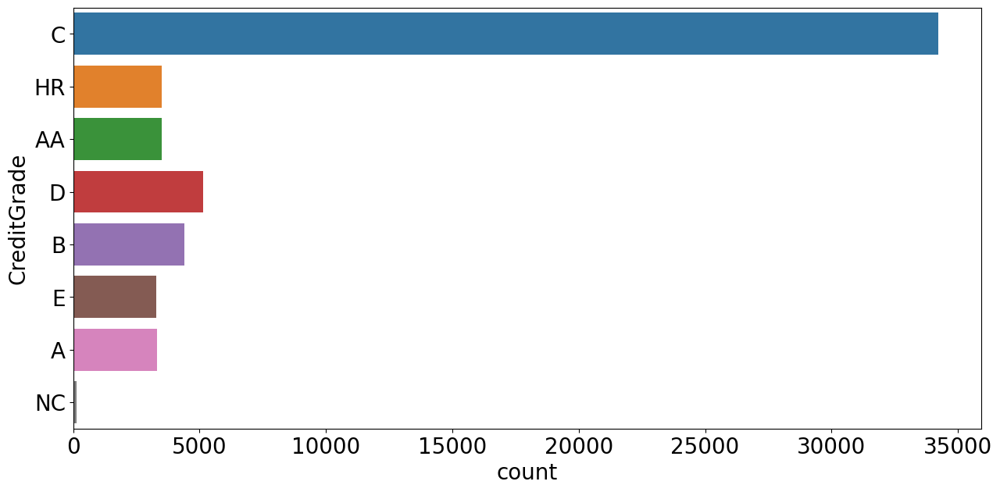

In [56]:
plt.figure(figsize=(15,7))
sns.countplot(y=data['CreditGrade'])

In [57]:
data['CreditGrade'].mode()

0    C
Name: CreditGrade, dtype: object

### Research Question 2 : **Since there are so much low Credit Grade such as C and D , does it lead to a higher amount of deliquency?** 

<Axes: xlabel='count', ylabel='LoanStatusBinary'>

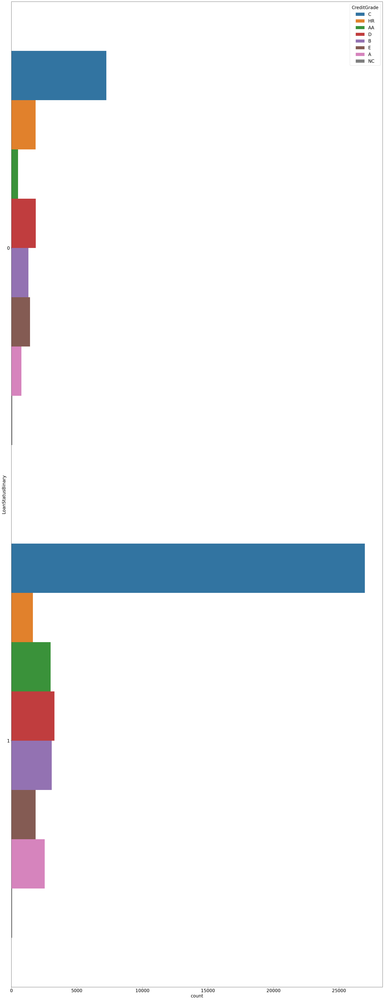

In [58]:
# Check the univariate relationship of Loan Status
plt.figure(figsize=(30,80))
sns.countplot(y='LoanStatusBinary', hue='CreditGrade', data=data)

In [59]:
creditsgrouped = data.groupby('CreditGrade')['LoanStatusBinary'].agg(['sum','count'])

creditsgrouped['CompletedRatio'] = 1 - (creditsgrouped['sum']/creditsgrouped['count']) 
creditsgrouped.rename(columns={'sum':'DeafultedLoans', 'count':'TotalLoans'}, inplace=True)

creditsgrouped.sort_values(by='CompletedRatio', ascending=False)

,DeafultedLoans,TotalLoans,CompletedRatio
CreditGrade,,,
NC,63,141,0.553191
HR,1650,3508,0.529647
E,1858,3289,0.435087
D,3287,5153,0.362119
B,3084,4389,0.297334
A,2544,3315,0.232579
C,26972,34218,0.211760
AA,3001,3509,0.144771


> __Generally low Credit Grade such as C and D do have the highest amount of deliquency. On the other hand, high Credit Grade such as A and B tend to also have their fair share deliquencies but in much fewer numbers compared to being non-defaulted.__

### Research Question 3 : **What is the highest number of BorrowerRate?** 

<Axes: xlabel='BorrowerRate', ylabel='Count'>

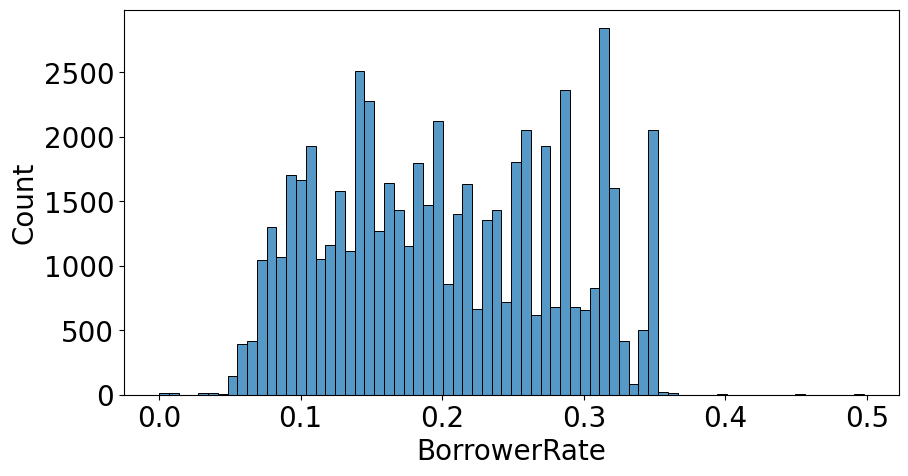

In [60]:
# Check the univariate relationship of Borrower rate
plt.figure(figsize=(10,5))
sns.histplot(data['BorrowerRate'])

### Research Question 4 : **Since the highest number of Borrower Rate is between 0.1 and 0.2, does the highest number of Lender Yield is between 0.1 and 0.2?** 

<Axes: xlabel='LenderYield', ylabel='Count'>

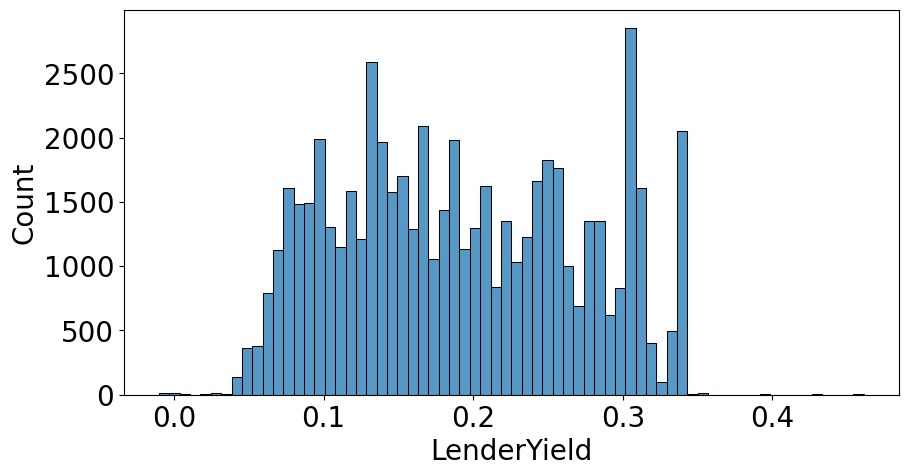

In [61]:
plt.figure(figsize=(10,5))
sns.histplot(data['LenderYield'])

In [62]:
data['LenderYield'].describe()

count    57522.000000
mean         0.191491
std          0.080415
min         -0.010000
25%          0.125900
50%          0.185000
75%          0.259900
max          0.460900
Name: LenderYield, dtype: float64

<Axes: xlabel='BorrowerRate', ylabel='LenderYield'>

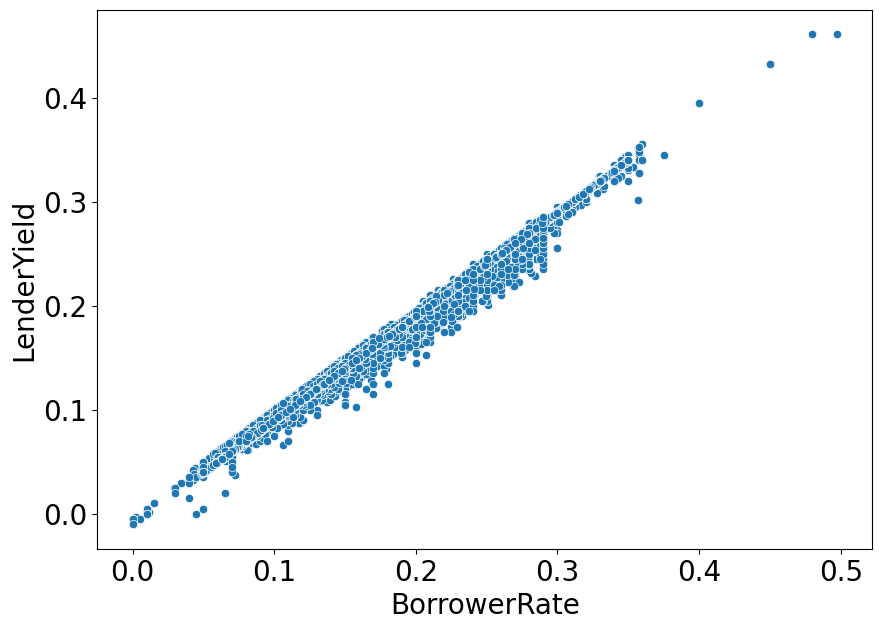

In [63]:
plt.figure(figsize=(10,7))
sns.scatterplot(x='BorrowerRate', y='LenderYield', data=data)

### Research Question 5 : **Is the Credit Grade really accurate? Does higher Credit Grade leads to higher Monthly Loan Payment? As for Higher Credit Grade we mean from Grade AA to B** 

In [64]:
# Check the Bivariate Relationship between CreditGarde and MonthlyLoan Payment
data.groupby(['CreditGrade'])['MonthlyLoanPayment'].describe()

,count,mean,std,min,25%,50%,75%,max
CreditGrade,,,,,,,,
A,3315.0,285.015518,192.275974,0.0,125.51,239.240,439.515,608.39875
AA,3509.0,269.094562,200.989331,0.0,94.00,199.290,442.860,608.39875
B,4389.0,271.688942,177.651578,0.0,131.33,225.860,375.950,608.39875
C,34218.0,226.801893,147.182006,0.0,120.86,176.795,314.170,608.39875
D,5153.0,172.159149,126.217734,0.0,86.66,138.990,222.980,608.39875
E,3289.0,128.052056,98.289418,0.0,62.88,111.490,155.740,608.39875
HR,3508.0,93.119659,65.352710,0.0,44.11,82.285,123.320,608.39875
NC,141.0,86.730071,60.332772,0.0,39.23,80.580,113.220,413.64000


> __Higher Credit Grade does lead to higher Monthly Loan Payment compared with lower Credit Grade as observed in both the statistics and graphs made for each grade.__

### Research Question 6 : **Here we look at the Completed Loan Status and Defaulted Rate to determine the accuracy of Credit Grade.**

<Figure size 1000x800 with 0 Axes>

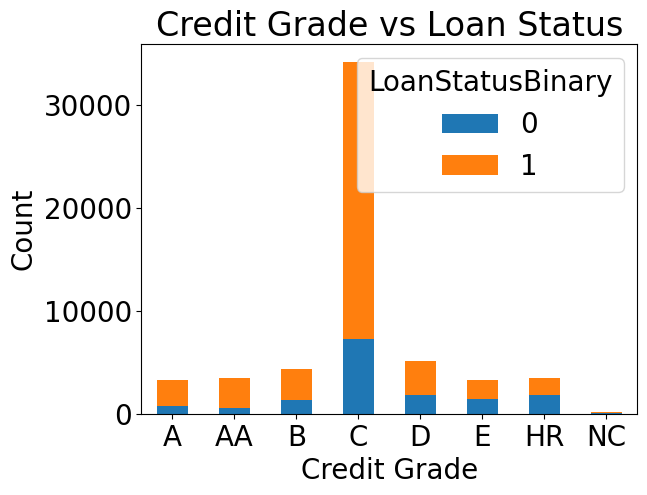

In [65]:
# Creating a stacked bar plot to visualize the relationship between Credit Grade and Loan Status
plt.figure(figsize=(10, 8))
pd.crosstab(data['CreditGrade'], data['LoanStatusBinary']).plot(kind='bar', stacked=True)
plt.title('Credit Grade vs Loan Status')
plt.xlabel('Credit Grade')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.show()

<Axes: xlabel='count', ylabel='CreditGrade'>

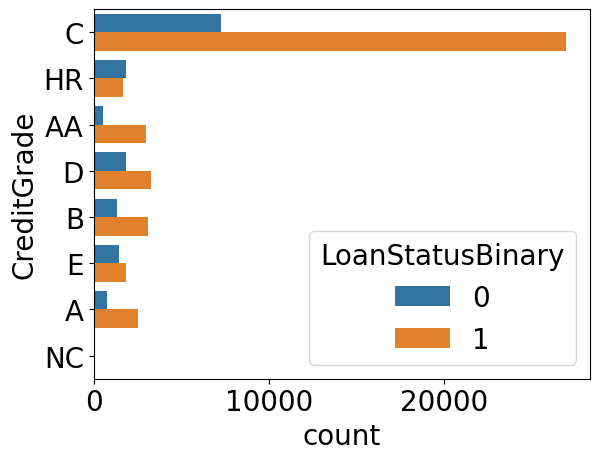

In [66]:
sns.countplot(y='CreditGrade', hue='LoanStatusBinary', data=data)

<Axes: xlabel='count', ylabel='LoanStatusBinary'>

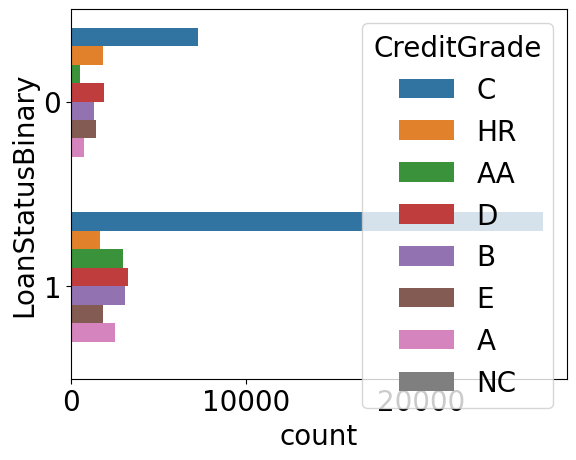

In [67]:
sns.countplot(y='LoanStatusBinary', hue ='CreditGrade',  data=data)

### Research Question 7 : **Now we know the Credit Grade is accurate and is a tool that is used by the organization in determining the person’s creditworthiness. Now we need to understand does the ProsperScore, the custom built risk assesment system is being used in determing borrower’s rate?**

> __From a theoretical standpoint, if the higher ProsperScore leads to lower Borrower Rate and Borrower Annual Percentage Rate that means the Prosper Score is being used alongside the Credit Grade in determing a person’s creditworthiness.__

<Axes: xlabel='BorrowerRate', ylabel='BorrowerAPR'>

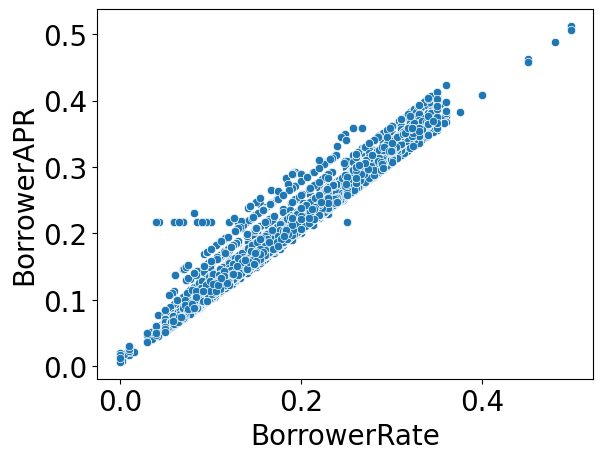

In [68]:
# Check the Multivariate Relationship between BorrowerRate and BorrowerAPR.
sns.scatterplot(x='BorrowerRate', y='BorrowerAPR', data=data)

> __Business Insight :
    Since the most important assest of a P2P lending Organization is its ability in using its tool to determine a borrower’s creditworthiness as accurate as possible. The organization would be more confident to market its organization as a great investment for investor to invest in hence leading to more borrower and higher market capitilization and boost revenue growth.__

## Univariate Analysis

### Par plot for LoanStatusBinary column

<Axes: title={'center': 'Income Distribution of Adults'}, xlabel='Loan Status', ylabel='Percentage'>

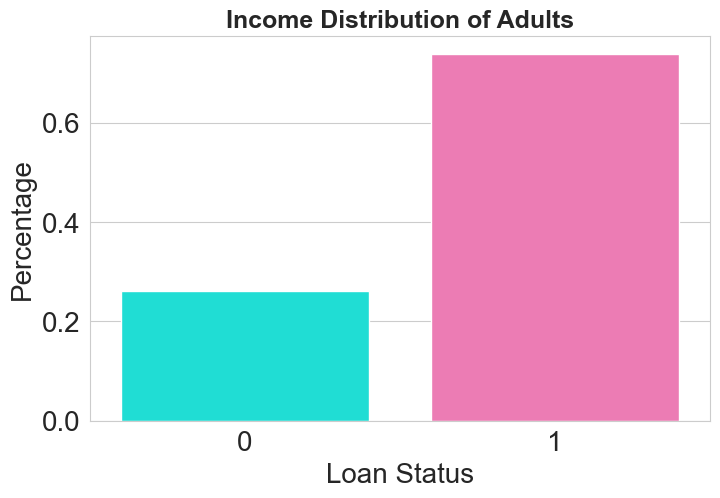

In [69]:
sns.set_style("whitegrid")
plt.figure(figsize = (8,5))
plt.title('Income Distribution of Adults', fontsize=18, fontweight='bold')
Loan_Status = data['LoanStatusBinary'].value_counts(1).rename_axis('Loan Status').reset_index(name = 'Percentage')
sns.barplot(x = 'Loan Status', y = 'Percentage', data = Loan_Status, palette=["#00fdf0","hotpink"])

### Histogram for EMI

<Axes: xlabel='EMI', ylabel='Count'>

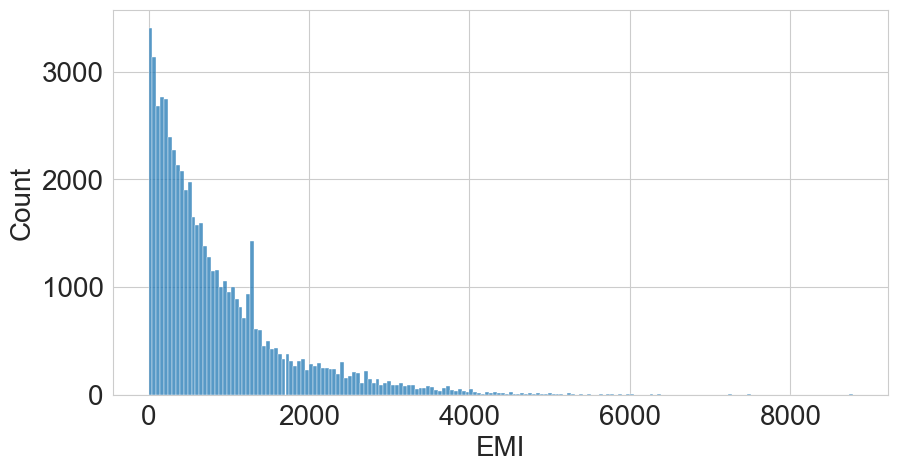

In [70]:
plt.figure(figsize=(10,5))
sns.histplot(data['EMI'])

### LoanTenure 

In [71]:
data['LoanTenure'].unique()

array([36, 60, 12], dtype=int64)

In [72]:
data['LoanTenure'].value_counts()

36    51504
60     4418
12     1600
Name: LoanTenure, dtype: int64

In [73]:
ex.pie(data,names='LoanTenure',width=500,height=500)

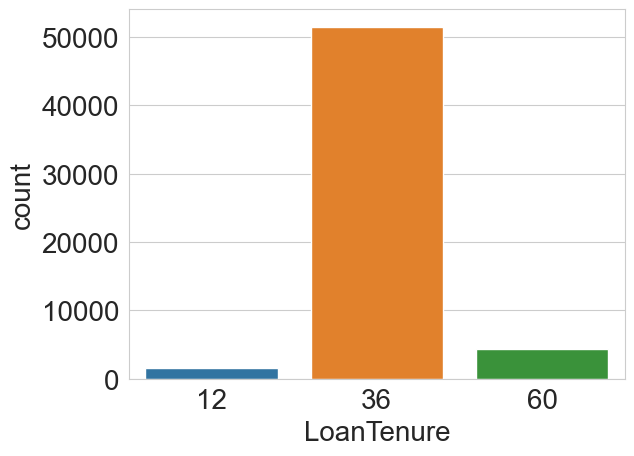

In [74]:
sns.countplot(x ='LoanTenure', data = data)
plt.show()

### ROI features 

C:\Users\noura\AppData\Local\Temp\ipykernel_21056\382937293.py:1: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: xlabel='LoanOriginalAmount', ylabel='Density'>

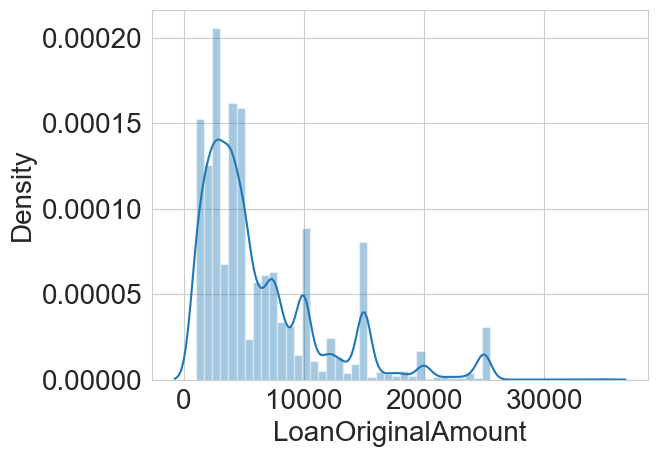

In [75]:
sns.distplot(ROI_features['LoanOriginalAmount'])

C:\Users\noura\AppData\Local\Temp\ipykernel_21056\548401300.py:1: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: xlabel='BorrowerRate', ylabel='Density'>

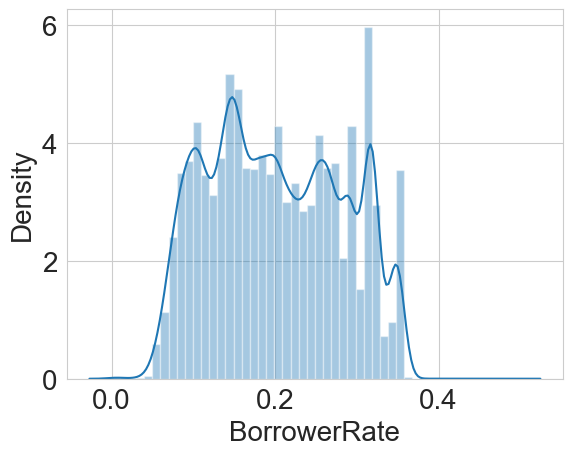

In [76]:
sns.distplot(ROI_features['BorrowerRate'])

<Axes: xlabel='count', ylabel='ProsperRating (Alpha)'>

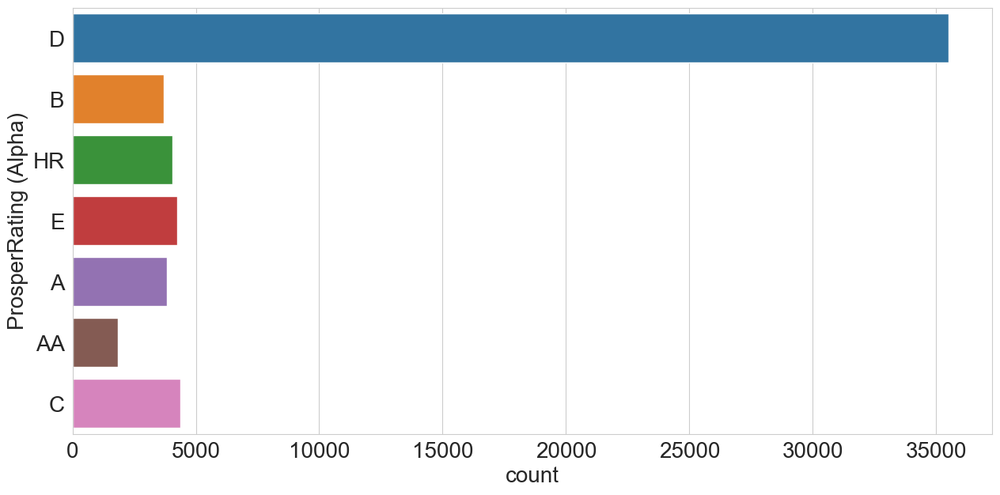

In [77]:
plt.figure(figsize=(15,7))
sns.countplot(y=ROI_features['ProsperRating (Alpha)'])

In [78]:
ex.pie(ROI_features,names='ProsperRating (Alpha)',hole=0.20)

### Histogram for ROI 

<Axes: xlabel='ROI', ylabel='Count'>

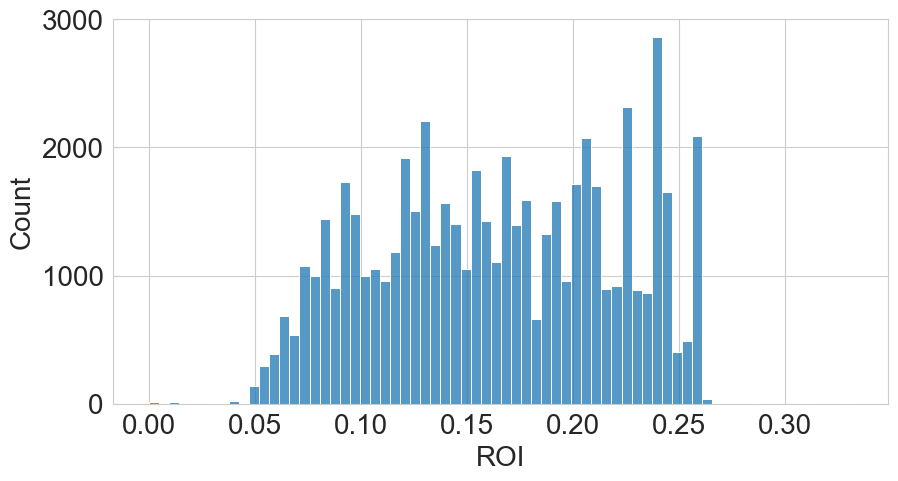

In [79]:
plt.figure(figsize=(10,5))
sns.histplot(data['ROI'])

### Histogram for PROI 

<Axes: xlabel='PROI', ylabel='Count'>

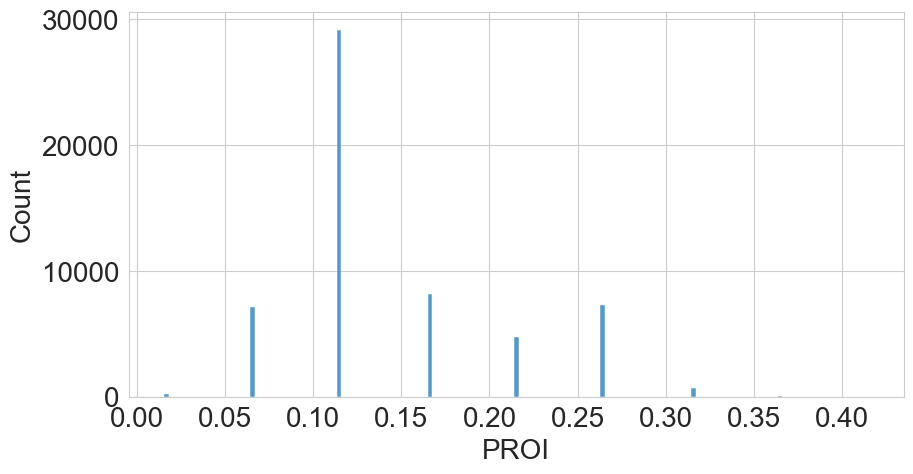

In [80]:
plt.figure(figsize=(10,5))
sns.histplot(data['PROI'])

### Histogram for ELA

<Axes: xlabel='ELA', ylabel='Count'>

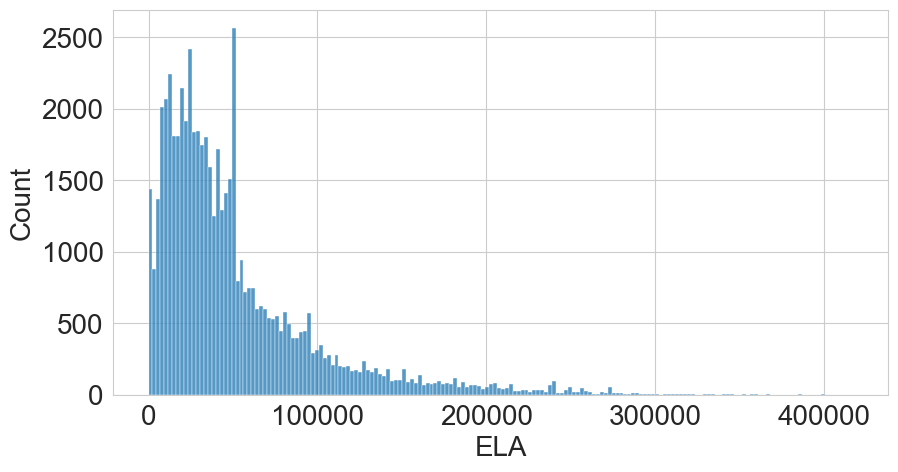

In [81]:
plt.figure(figsize=(10,5))
sns.histplot(data['ELA'])

## Bivariate Analysis

### Scatter plots for EMI

<Axes: xlabel='BorrowerRate', ylabel='EMI'>

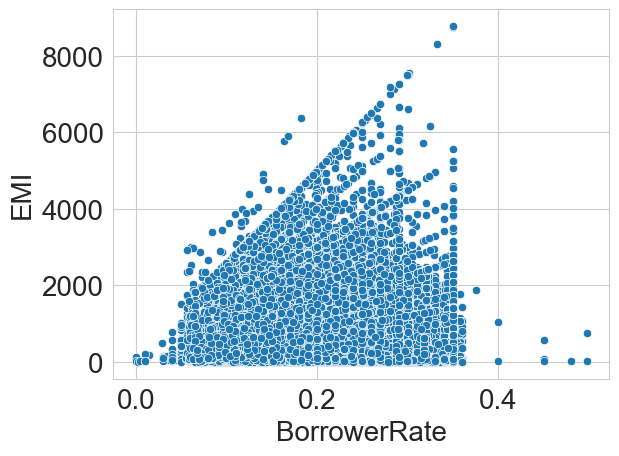

In [82]:
sns.scatterplot(x='BorrowerRate', y='EMI', data=data)

<Axes: xlabel='LoanTenure', ylabel='EMI'>

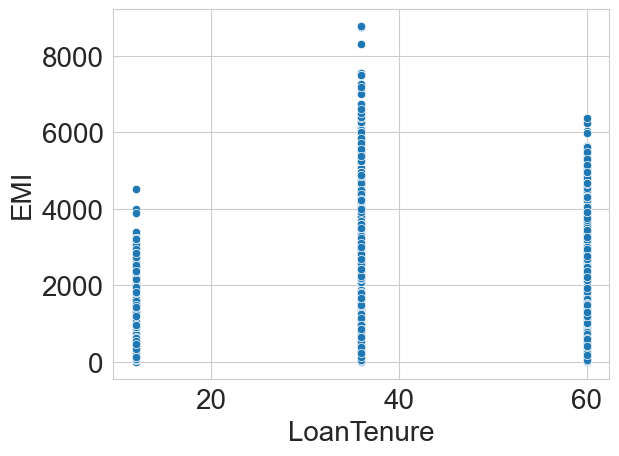

In [83]:
sns.scatterplot(x='LoanTenure', y='EMI', data=data)

<Axes: xlabel='LP_CustomerPrincipalPayments', ylabel='EMI'>

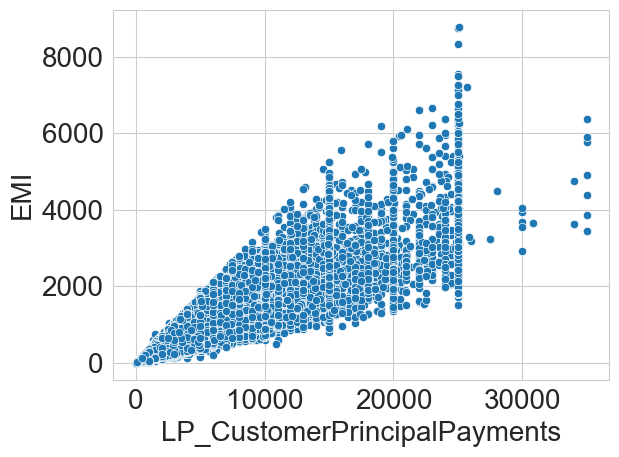

In [84]:
sns.scatterplot(x='LP_CustomerPrincipalPayments', y='EMI', data=data)

<Axes: xlabel='LP_CustomerPayments', ylabel='EMI'>

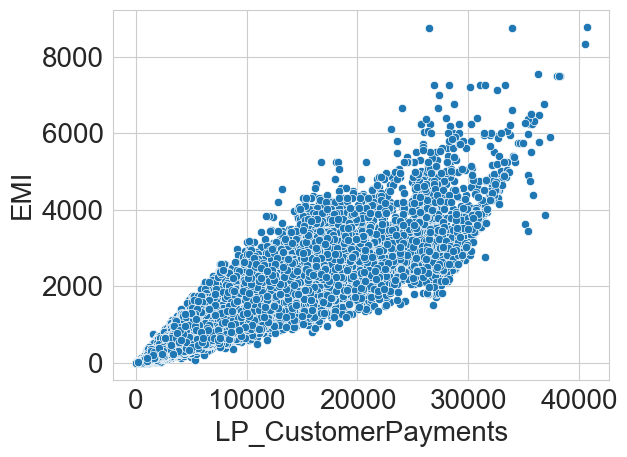

In [85]:
sns.scatterplot(x='LP_CustomerPayments', y='EMI', data=data)

<Axes: xlabel='BorrowerAPR', ylabel='EMI'>

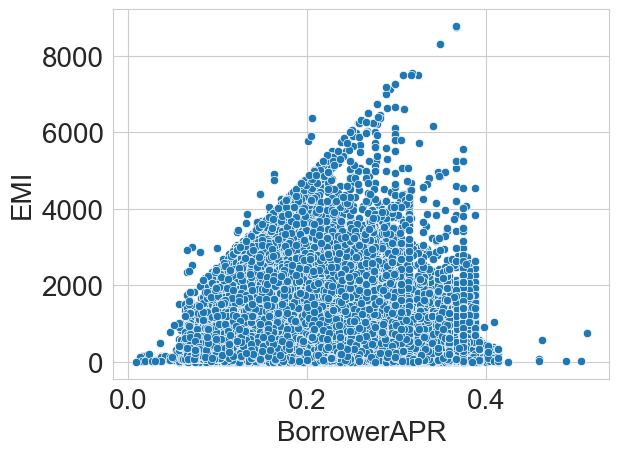

In [86]:
sns.scatterplot(x='BorrowerAPR', y='EMI', data=data)

<Axes: xlabel='LenderYield', ylabel='EMI'>

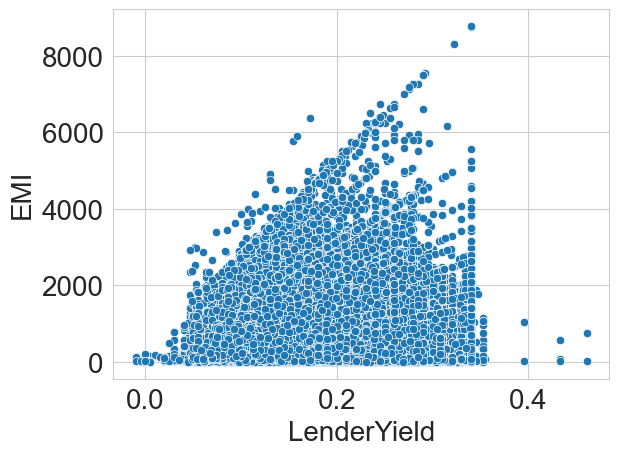

In [87]:
sns.scatterplot(x='LenderYield', y='EMI', data=data)

### Box plot for EMI based on IncomeVerifiable

<Axes: xlabel='IncomeVerifiable', ylabel='EMI'>

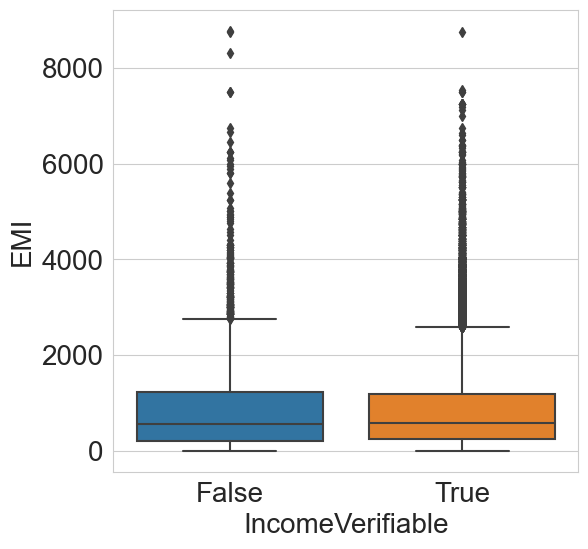

In [88]:
plt.figure(figsize=(6,6))
sns.boxplot(x='IncomeVerifiable', y='EMI', data=data)

### Scatter plot for LoanTenure

<Axes: xlabel='LoanOriginalAmount', ylabel='LoanTenure'>

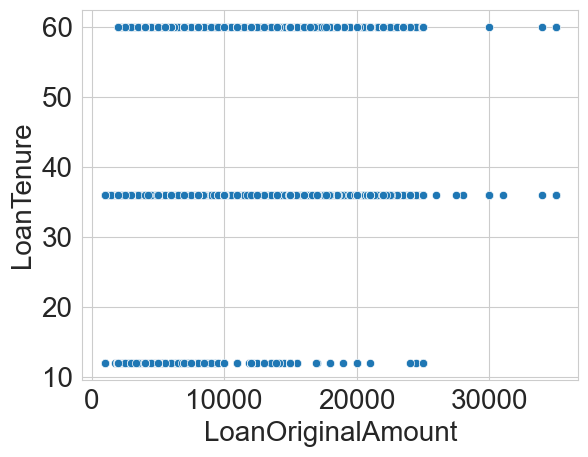

In [89]:
sns.scatterplot(x='LoanOriginalAmount', y='LoanTenure', data=data)

### ROI features 

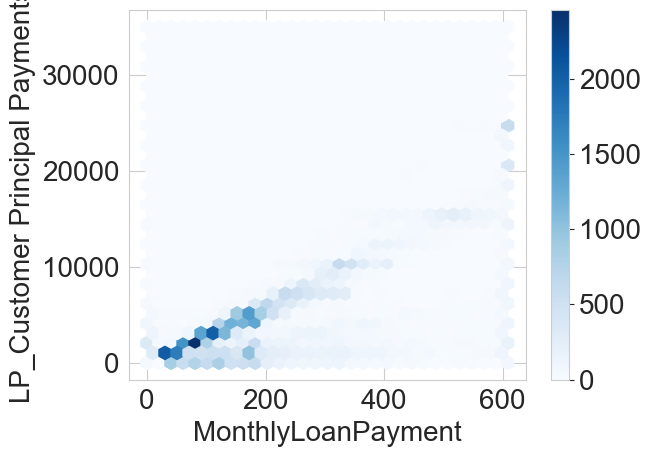

In [90]:
# Extract the x and y columns
x = data['MonthlyLoanPayment']
y = data['LP_CustomerPrincipalPayments']

# Create a hexbin plot
plt.hexbin(x, y, cmap='Blues', gridsize=30)

# Add axis labels and a title
plt.xlabel('MonthlyLoanPayment')
plt.ylabel('LP_Customer Principal Payments')


# Show the plot
plt.colorbar()
plt.show()

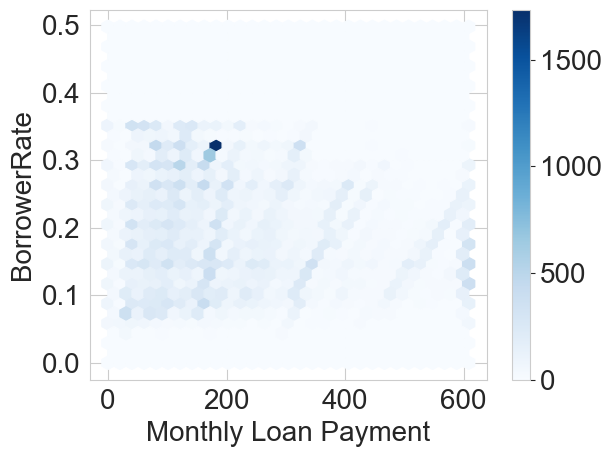

In [91]:
# Extract the x and y columns
x = data['MonthlyLoanPayment']
y = data['BorrowerRate']

# Create a hexbin plot
plt.hexbin(x, y, cmap='Blues', gridsize=30)

# Add axis labels and a title
plt.xlabel('Monthly Loan Payment')
plt.ylabel('BorrowerRate')


# Show the plot
plt.colorbar()
plt.show()

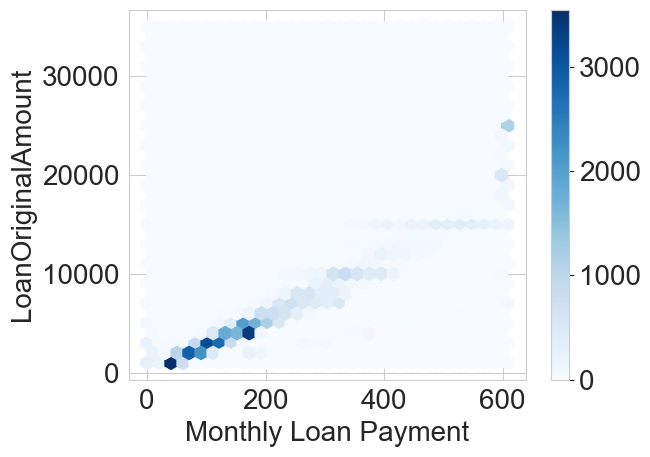

In [92]:
# Extract the x and y columns
x = data['MonthlyLoanPayment']
y = data['LoanOriginalAmount']

# Create a hexbin plot
plt.hexbin(x, y, cmap='Blues', gridsize=30)

# Add axis labels and a title
plt.xlabel('Monthly Loan Payment')
plt.ylabel('LoanOriginalAmount')


# Show the plot
plt.colorbar()
plt.show()

## Scatter plots for ROI

<Axes: xlabel='LoanOriginalAmount', ylabel='ROI'>

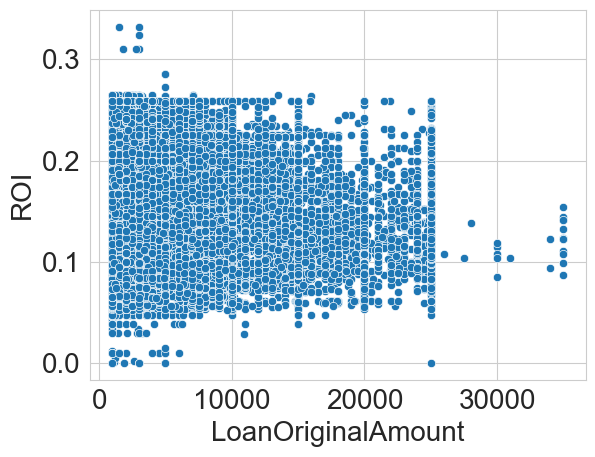

In [93]:
sns.scatterplot(x='LoanOriginalAmount', y='ROI', data=data)

<Axes: xlabel='BorrowerRate', ylabel='ROI'>

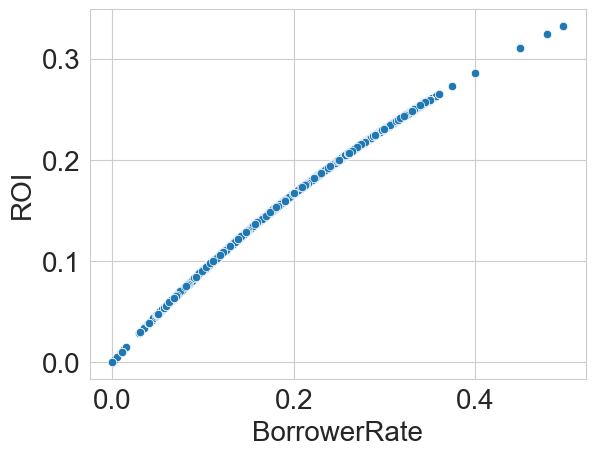

In [94]:
sns.scatterplot(x='BorrowerRate', y='ROI', data=data)

<Axes: xlabel='LP_CustomerPrincipalPayments', ylabel='ROI'>

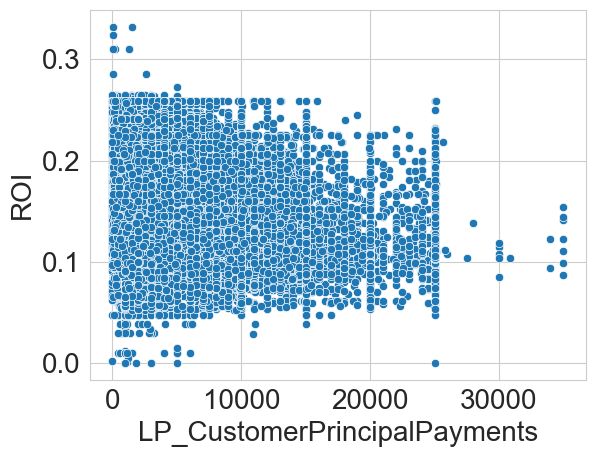

In [95]:
sns.scatterplot(x='LP_CustomerPrincipalPayments', y='ROI', data=data)

<Axes: xlabel='LoanCurrentDaysDelinquent', ylabel='ROI'>

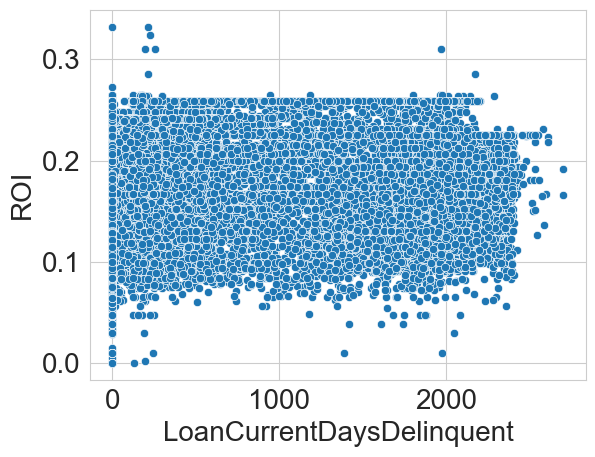

In [96]:
sns.scatterplot(x='LoanCurrentDaysDelinquent', y='ROI', data=data)

<Axes: xlabel='MonthlyLoanPayment', ylabel='ROI'>

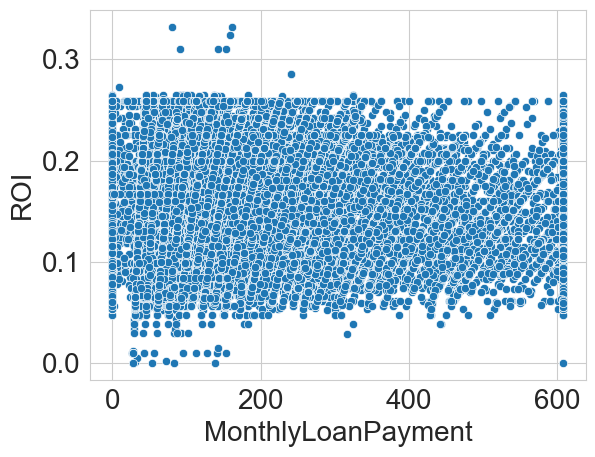

In [97]:
sns.scatterplot(x='MonthlyLoanPayment', y='ROI', data=data)

<Axes: xlabel='ProsperRating (Alpha)', ylabel='ROI'>

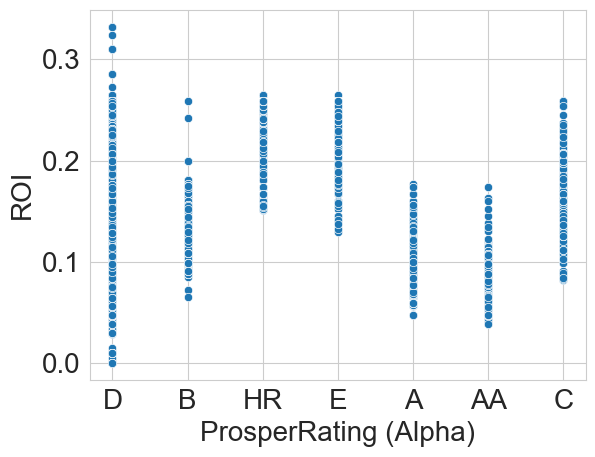

In [98]:
sns.scatterplot(x='ProsperRating (Alpha)', y='ROI', data=data)

<Axes: xlabel='InterestAmount', ylabel='ROI'>

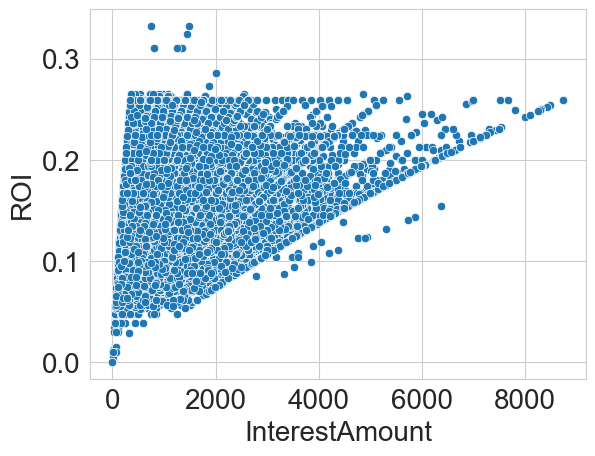

In [99]:
sns.scatterplot(x='InterestAmount', y='ROI', data=data)

<Axes: xlabel='TotalAmount', ylabel='ROI'>

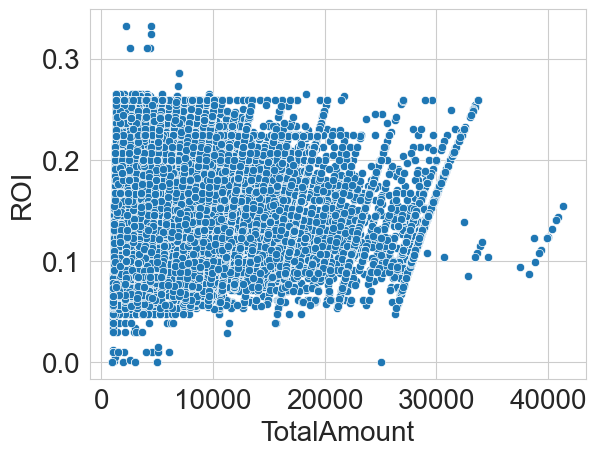

In [100]:
sns.scatterplot(x='TotalAmount', y='ROI', data=data)

<Axes: xlabel='LP_CustomerPrincipalPayments', ylabel='PROI'>

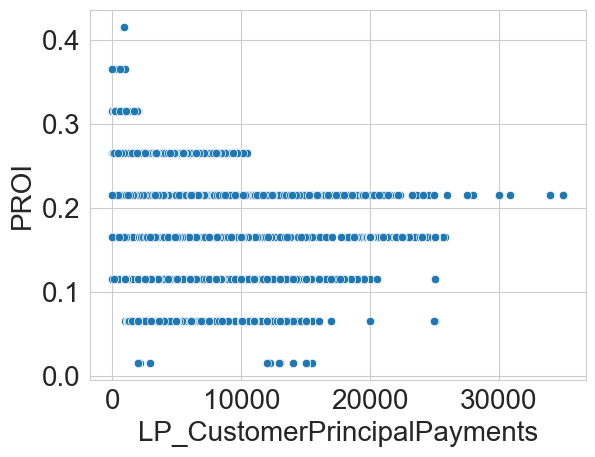

In [101]:
sns.scatterplot(x='LP_CustomerPrincipalPayments', y='PROI', data=data)

<Axes: xlabel='ProsperRating (Alpha)', ylabel='PROI'>

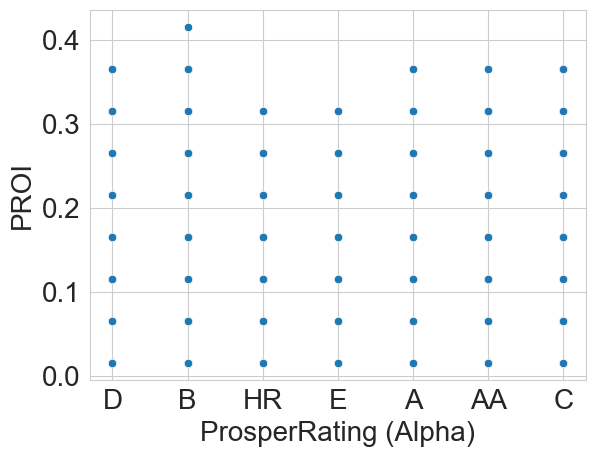

In [102]:
sns.scatterplot(x='ProsperRating (Alpha)', y='PROI', data=data)

<Axes: xlabel='LoanOriginalAmount', ylabel='PROI'>

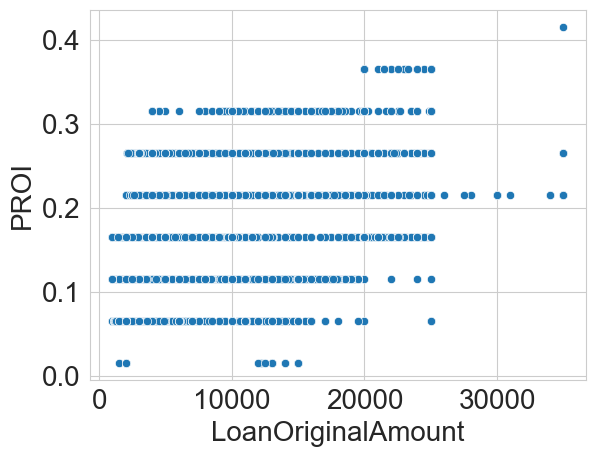

In [103]:
sns.scatterplot(x='LoanOriginalAmount', y='PROI', data=data)

<Axes: xlabel='LoanCurrentDaysDelinquent', ylabel='PROI'>

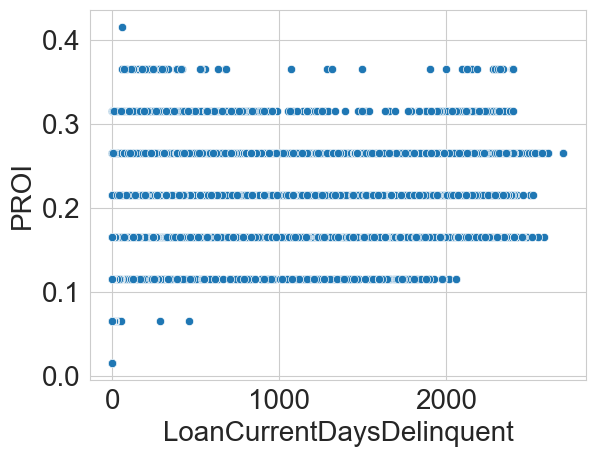

In [104]:
sns.scatterplot(x='LoanCurrentDaysDelinquent', y='PROI', data=data)

<Axes: xlabel='MonthlyLoanPayment', ylabel='PROI'>

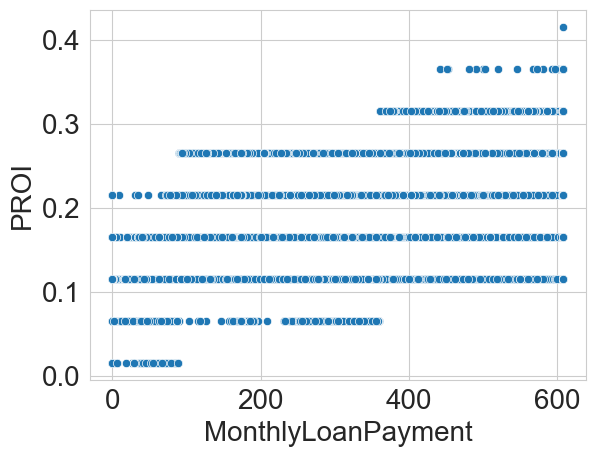

In [105]:
sns.scatterplot(x='MonthlyLoanPayment', y='PROI', data=data)

<Axes: xlabel='LP_CustomerPrincipalPayments', ylabel='PROI'>

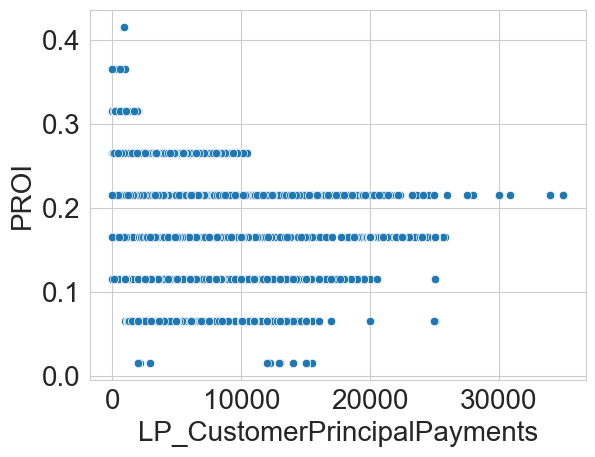

In [106]:
sns.scatterplot(x='LP_CustomerPrincipalPayments', y='PROI', data=data)

### Scatter plots for ELA

<Axes: xlabel='LoanOriginalAmount', ylabel='ELA'>

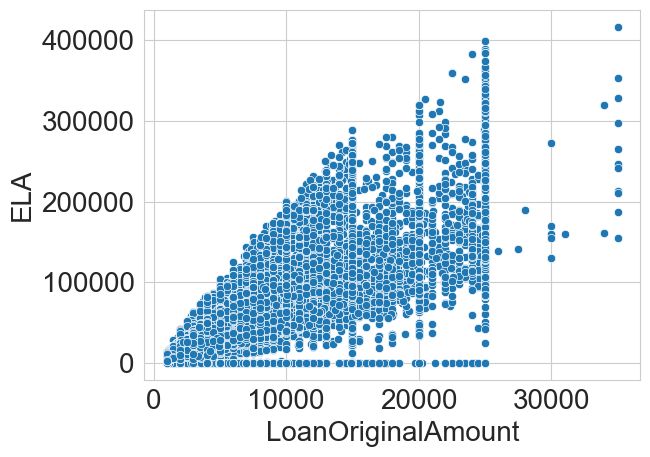

In [107]:
sns.scatterplot(x='LoanOriginalAmount', y='ELA', data=data)

<Axes: xlabel='BorrowerRate', ylabel='ELA'>

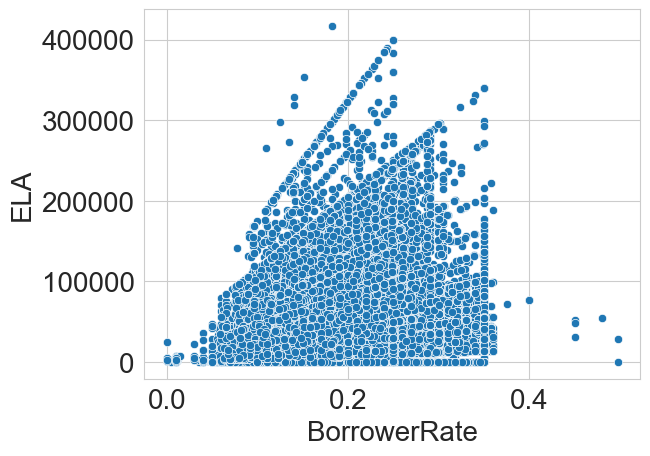

In [108]:
sns.scatterplot(x='BorrowerRate', y='ELA', data=data)

<Axes: xlabel='LoanTenure', ylabel='ELA'>

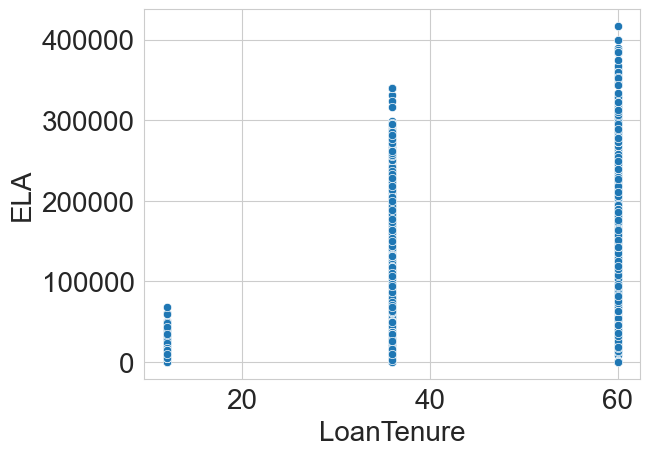

In [109]:
sns.scatterplot(x='LoanTenure', y='ELA', data=data)

<Axes: xlabel='StatedMonthlyIncome', ylabel='ELA'>

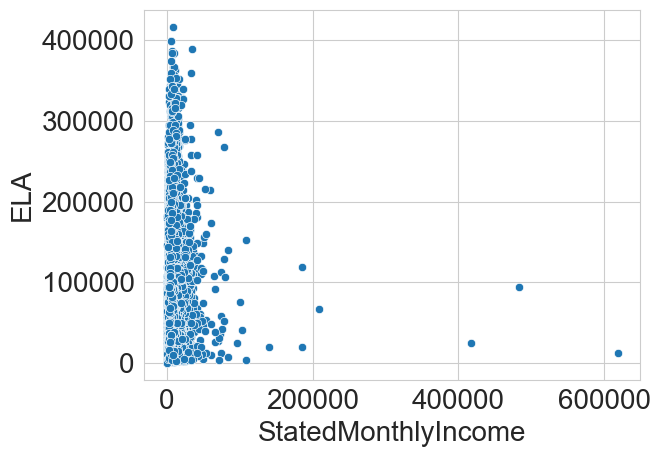

In [110]:
sns.scatterplot(x='StatedMonthlyIncome', y='ELA', data=data)

## Multivariate Analysis

### Distribution plot

Large dataset detected, using 10000 random samples for the plots. Summary statistics are still based on the entire dataset.
Note: The number of non binary numerical features is very large (56), please consider splitting the data. Showing plots for the first 20 numerical features. Override this by setting showall=True.


<Axes: xlabel='TotalInquiries', ylabel='Density'>

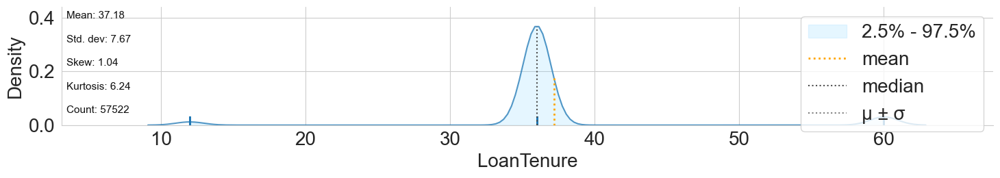

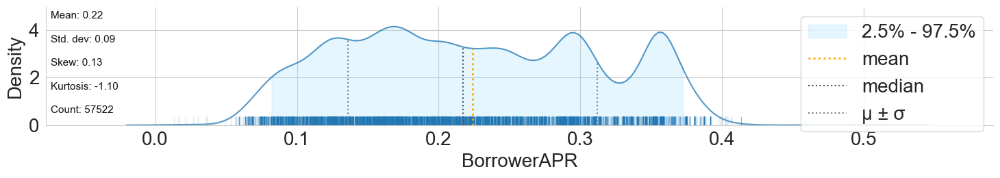

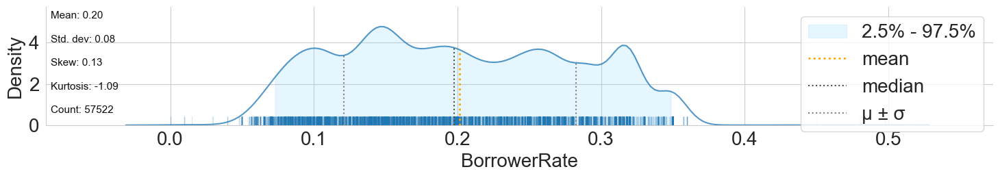

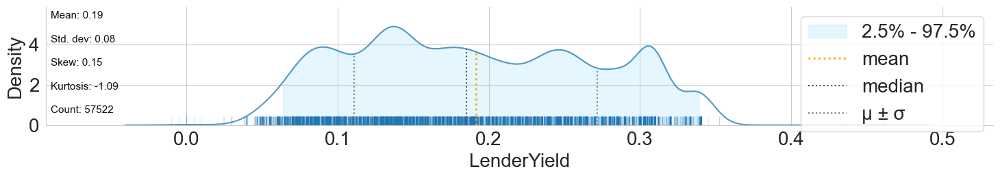

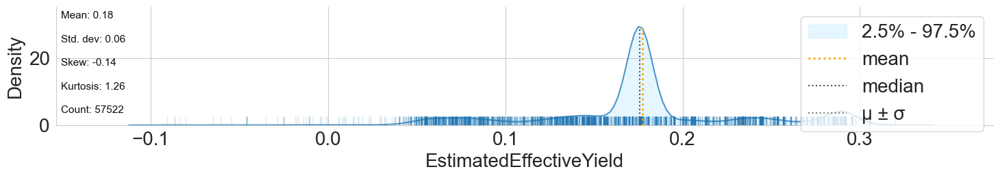

...

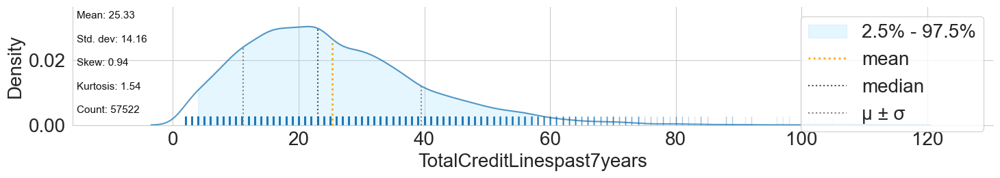

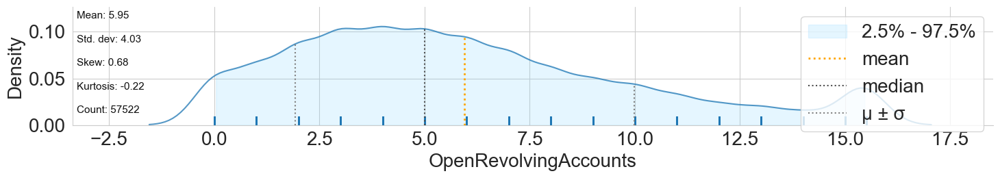

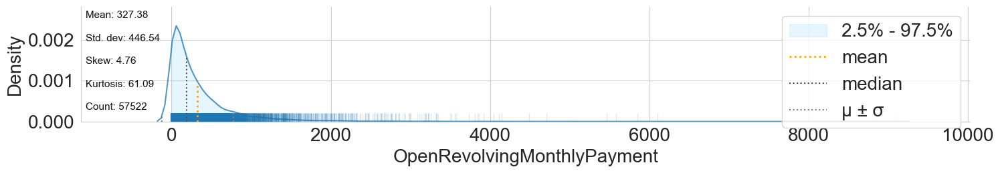

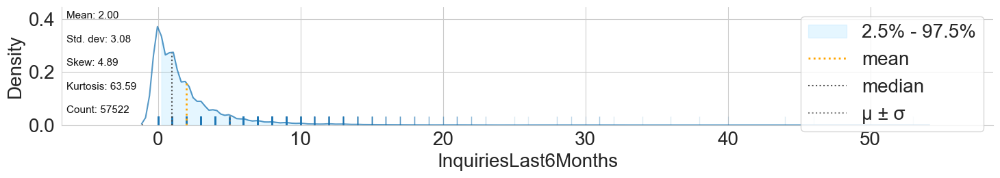

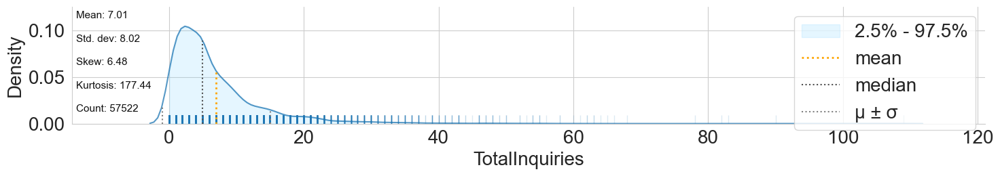

In [111]:
# returns a distribution plot for every numeric feature
klib.dist_plot(data) 

### To show the unique values in each feature whose datatype is object 

In [112]:
object = data.select_dtypes(include='object').columns
print(object)
for col in object:
    unique_vals = data[col].unique()
    print(col)
    print(unique_vals)

Index(['CreditGrade', 'ProsperRating (Alpha)', 'BorrowerState', 'Occupation',
       'EmploymentStatus', 'DateCreditPulled', 'IncomeRange',
       'LoanOriginationQuarter'],
      dtype='object')
CreditGrade
['C' 'HR' 'AA' 'D' 'B' 'E' 'A' 'NC']
ProsperRating (Alpha)
['D' 'B' 'HR' 'E' 'A' 'AA' 'C']
BorrowerState
['CO' 'GA' 'CA' 'AL' 'FL' 'MI' 'IL' 'NY' 'MO' 'NE' 'KS' 'VA' 'MN' 'MD'
 'WI' 'OH' 'PA' 'WA' 'NJ' 'TX' 'SC' 'CT' 'KY' 'AZ' 'OK' 'OR' 'NC' 'MA'
 'AR' 'TN' 'NM' 'ID' 'DC' 'WV' 'NV' 'UT' 'MT' 'IN' 'NH' 'VT' 'LA' 'ME'
 'AK' 'HI' 'RI' 'WY' 'DE' 'IA' 'MS' 'SD' 'ND']
Occupation
['Other' 'Waiter/Waitress' 'Sales - Retail' 'Professional' 'Skilled Labor'
 'Sales - Commission' 'Executive' 'Accountant/CPA' 'Construction'
 'Analyst' "Nurse's Aide" 'Fireman' 'Realtor' 'Clerical' 'Laborer'
 'Food Service Management' 'Truck Driver' 'Administrative Assistant'
 'Police Officer/Correction Officer' 'Nurse (RN)' 'Social Worker'
 'Computer Programmer' 'Military Officer' 'Military Enlisted'
 'Food Serv

> __we concluded from the previous 2 plots that upon increasing number of investors in the loan and dollar amount of investments that were made by friends ,
 my EstimatedEffectiveYield percentage decreases.__

# Feature Engineering

## Dropping the features which were used in target varaiables calculations

In [113]:
data.drop(['LoanCurrentDaysDelinquent' , 'LP_CustomerPrincipalPayments' , 'BorrowerRate' , 'LoanTenure' , 'LoanOriginalAmount' ,
           'StatedMonthlyIncome' , 'MonthlyLoanPayment' , 'ProsperRating (Alpha)' , 'ROI'] , axis = 1 , inplace = True )

## Dropping some features which aren't important

In [114]:
data.drop(['DateCreditPulled' ,'LoanMonthsSinceOrigination' , 'CreditGrade' , 'EstimatedLoss'], axis=1, inplace=True)

> __The LoanMonthsSinceOrigination = 0 when the borrower will subscribe for a loan and the model predict before this process.__

## Features correlation 

In [115]:
corrs= data.select_dtypes(include=np.number).corr()
corr_cols=set()

threshold= 0.7

for col,cor in corrs.items():
    if len(cor[abs(cor)>threshold])<2:
        continue
    c = tuple(cor[abs(cor)>threshold].index)
    corr_cols.add(c)

In [116]:
for cols in corr_cols:
    print(data[list(cols)].corr(), '\n_____________________________________________________________________________________\n')

                         EstimatedEffectiveYield  EstimatedReturn
EstimatedEffectiveYield                 1.000000         0.722374
EstimatedReturn                         0.722374         1.000000 
_____________________________________________________________________________________

                       CreditScoreRangeLower  CreditScoreRangeUpper
CreditScoreRangeLower               1.000000               0.949591
CreditScoreRangeUpper               0.949591               1.000000 
_____________________________________________________________________________________

             BorrowerAPR  LenderYield
BorrowerAPR      1.00000      0.98714
LenderYield      0.98714      1.00000 
_____________________________________________________________________________________

                      InquiriesLast6Months  TotalInquiries
InquiriesLast6Months              1.000000        0.750207
TotalInquiries                    0.750207        1.000000 
__________________________________________

### Heat map for every high correlated numeric features 

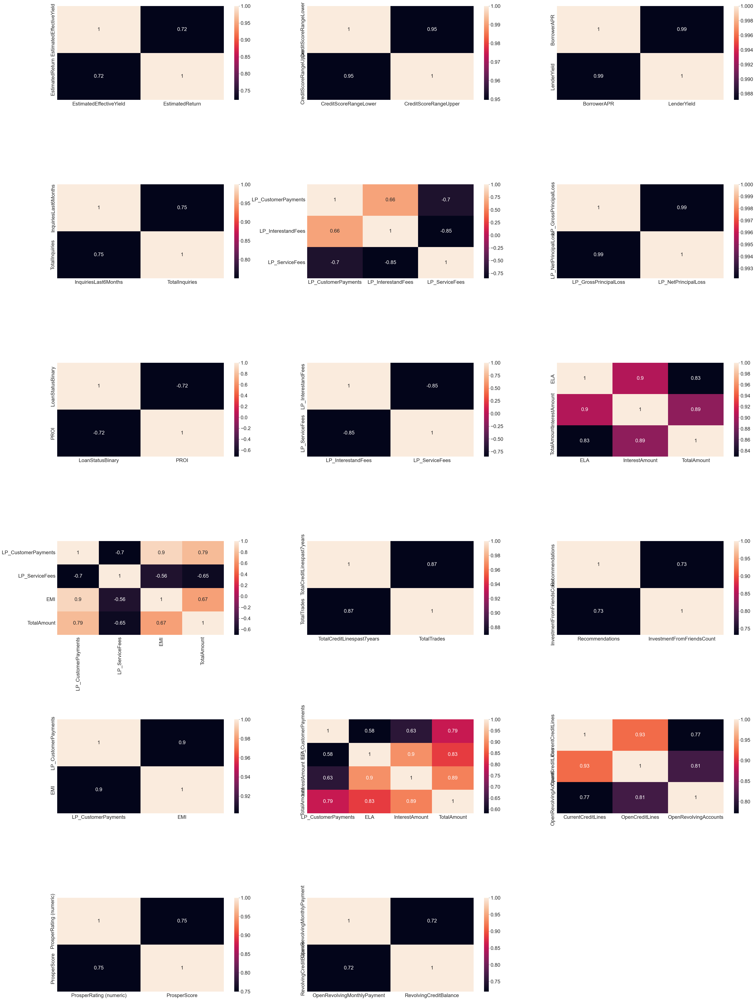

In [117]:
plt.figure(figsize=(50,70))
for i,cols in enumerate(corr_cols):
    plt.subplot(len(corr_cols)//3 + 1, 3,i+1)
    sns.heatmap(data[list(cols)].corr(), annot=True)

plt.subplots_adjust(hspace=0.9)

> __Columns with high correlation will be dealt with by keeping one and dropping the rest.__

## Dropping high correlated features and keeping one from each heat map

In [118]:
corr_drop = [ 'OpenRevolvingMonthlyPayment' , 'BorrowerAPR' ,  'TotalAmount', 'InterestAmount' , 'Recommendations' , 
             'LP_InterestandFees' , 'CreditScoreRangeUpper' , 'ProsperScore' , 'EstimatedEffectiveYield', 'InquiriesLast6Months'
             , 'OpenRevolvingAccounts' , 'CurrentCreditLines' , 'TotalCreditLinespast7years' ]

data.drop(corr_drop, axis=1, inplace=True)

In [119]:
data.shape

(57522, 42)

In [120]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57522 entries, 0 to 57521
Data columns (total 42 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   LenderYield                         57522 non-null  float64
 1   EstimatedReturn                     57522 non-null  float64
 2   ProsperRating (numeric)             57522 non-null  float64
 3   ListingCategory (numeric)           57522 non-null  int64  
 4   BorrowerState                       57522 non-null  object 
 5   Occupation                          57522 non-null  object 
 6   EmploymentStatus                    57522 non-null  object 
 7   EmploymentStatusDuration            57522 non-null  float64
 8   IsBorrowerHomeowner                 57522 non-null  bool   
 9   CurrentlyInGroup                    57522 non-null  bool   
 10  CreditScoreRangeLower               57522 non-null  float64
 11  OpenCreditLines                     57522

## New fearures

### Creating 2 new features 'OriginationQuarter' , 'OriginationYear' from the 'LoanOriginationQuarter'

In [121]:
data[['OriginationQuarter','OriginationYear']] = data['LoanOriginationQuarter'].str.split(expand=True)

data['OriginationQuarter'] = data['OriginationQuarter'].str[-1]

data[['OriginationQuarter','OriginationYear']] = data[['OriginationQuarter','OriginationYear']].astype(int)
data[['OriginationQuarter','OriginationYear', 'LoanOriginationQuarter']]

,OriginationQuarter,OriginationYear,LoanOriginationQuarter
0,3,2007,Q3 2007
1,1,2007,Q1 2007
2,4,2007,Q4 2007
3,1,2014,Q1 2014
4,2,2012,Q2 2012
...,...,...,...
57517,2,2008,Q2 2008
57518,2,2011,Q2 2011
57519,3,2013,Q3 2013
57520,4,2011,Q4 2011


### Dropping the 'LoanOriginationQuarter' feature

In [122]:
data.drop('LoanOriginationQuarter', axis=1, inplace=True)

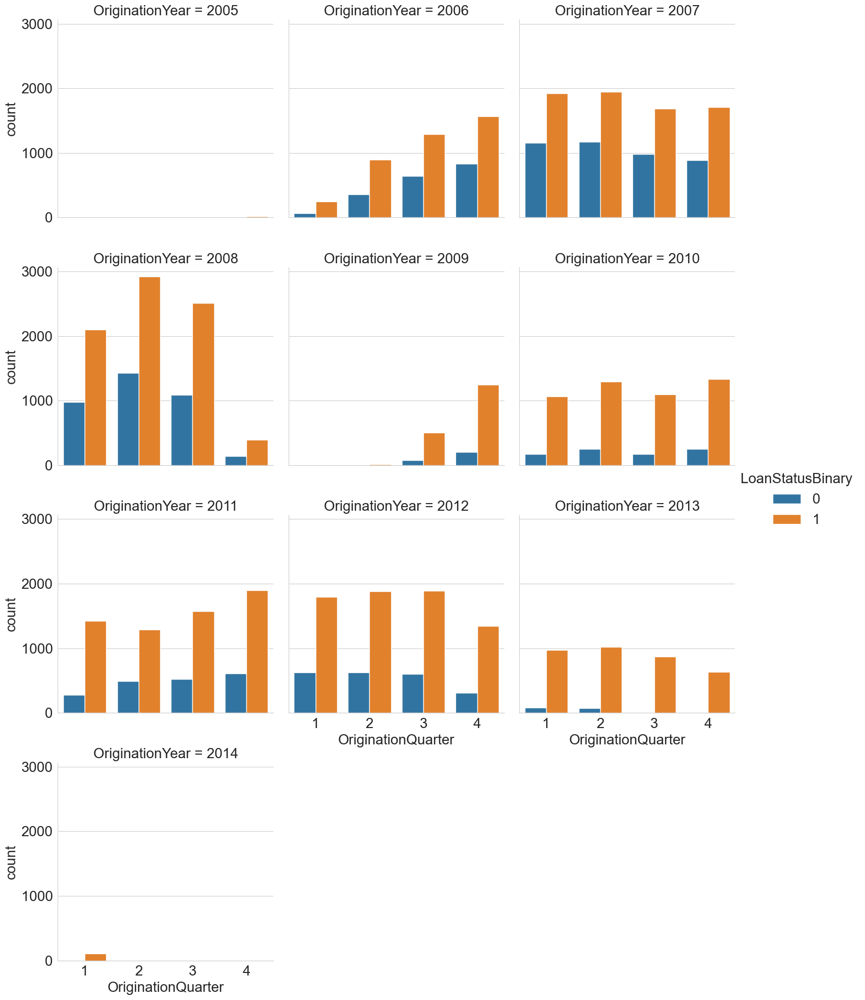

In [123]:
sns.catplot(x='OriginationQuarter', hue='LoanStatusBinary', col='OriginationYear', col_wrap=3, kind='count', data=data)

### Count plot for 'OriginationYear' based on 'LoanStatusBinary' value

<Axes: xlabel='OriginationYear', ylabel='count'>

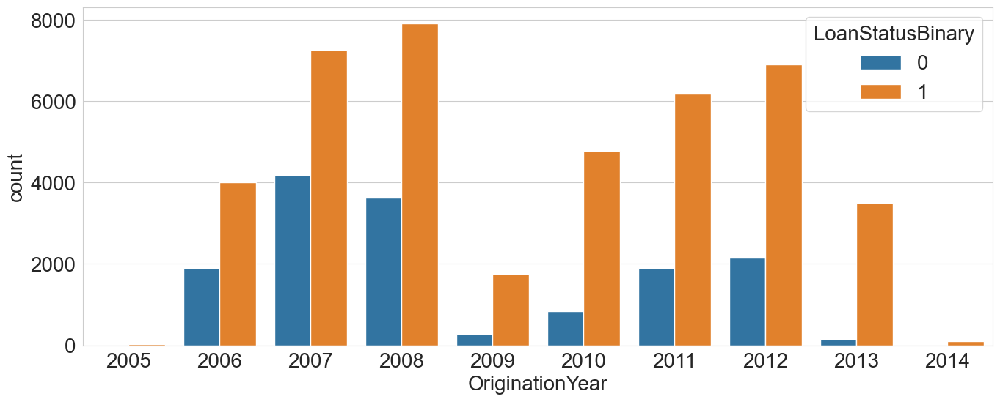

In [124]:
plt.figure(figsize=(16,6))
sns.countplot( x= data['OriginationYear'], hue='LoanStatusBinary' , data = data)

### Pair plot based on LoanStatusBinary 

<Figure size 1000x500 with 0 Axes>

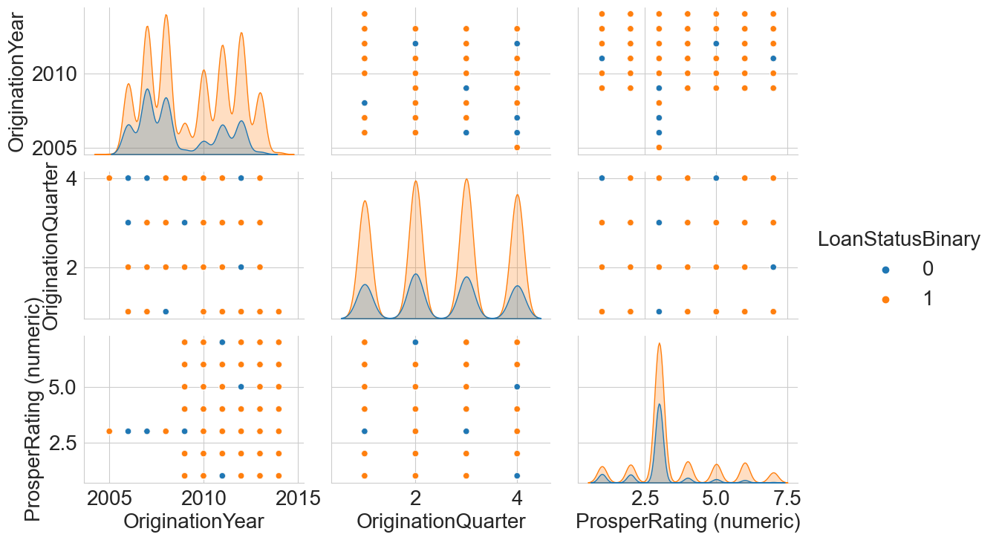

In [125]:
plt.figure(figsize=(10, 5))
sns.pairplot(data, x_vars=['OriginationYear', 'OriginationQuarter', 'ProsperRating (numeric)'],
             y_vars=['OriginationYear', 'OriginationQuarter', 'ProsperRating (numeric)'], hue='LoanStatusBinary',aspect=1.5)

# Data Encoding

### Categorical features label encoding

In [126]:
label_encoder = preprocessing.LabelEncoder()
for col in data.select_dtypes(include='object').columns:
    label_encoder.fit(data[col].unique())
    data[col]=label_encoder.transform(data[col])

In [127]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57522 entries, 0 to 57521
Data columns (total 43 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   LenderYield                         57522 non-null  float64
 1   EstimatedReturn                     57522 non-null  float64
 2   ProsperRating (numeric)             57522 non-null  float64
 3   ListingCategory (numeric)           57522 non-null  int64  
 4   BorrowerState                       57522 non-null  int32  
 5   Occupation                          57522 non-null  int32  
 6   EmploymentStatus                    57522 non-null  int32  
 7   EmploymentStatusDuration            57522 non-null  float64
 8   IsBorrowerHomeowner                 57522 non-null  bool   
 9   CurrentlyInGroup                    57522 non-null  bool   
 10  CreditScoreRangeLower               57522 non-null  float64
 11  OpenCreditLines                     57522

### Converting bool features into integer datatype ( 0 , 1 )

In [128]:
bool_cols = data.select_dtypes('bool').columns

In [129]:
data[bool_cols]

,IsBorrowerHomeowner,CurrentlyInGroup,IncomeVerifiable
0,True,True,True
1,False,True,True
2,False,False,True
3,False,False,True
4,True,False,True
...,...,...,...
57517,True,True,True
57518,False,False,True
57519,False,False,True
57520,True,False,True


In [130]:
data[bool_cols] = data[bool_cols].astype(int)

data[bool_cols]

,IsBorrowerHomeowner,CurrentlyInGroup,IncomeVerifiable
0,1,1,1
1,0,1,1
2,0,0,1
3,0,0,1
4,1,0,1
...,...,...,...
57517,1,1,1
57518,0,0,1
57519,0,0,1
57520,1,0,1


In [131]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57522 entries, 0 to 57521
Data columns (total 43 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   LenderYield                         57522 non-null  float64
 1   EstimatedReturn                     57522 non-null  float64
 2   ProsperRating (numeric)             57522 non-null  float64
 3   ListingCategory (numeric)           57522 non-null  int64  
 4   BorrowerState                       57522 non-null  int32  
 5   Occupation                          57522 non-null  int32  
 6   EmploymentStatus                    57522 non-null  int32  
 7   EmploymentStatusDuration            57522 non-null  float64
 8   IsBorrowerHomeowner                 57522 non-null  int32  
 9   CurrentlyInGroup                    57522 non-null  int32  
 10  CreditScoreRangeLower               57522 non-null  float64
 11  OpenCreditLines                     57522

## Storing each target variable and removing them from the data

In [132]:
Loan_status = data.pop('LoanStatusBinary')

In [133]:
regression_target_variables = data[['EMI', 'PROI', 'ELA']]

data.drop(['EMI', 'PROI', 'ELA'], axis=1, inplace = True)

### Checking for null values in the 'LoanStatus' target varaible

In [134]:
Loan_status.isna().sum()

0

## Feature Selection ( LoanStatusBinary --> LoanStatus )

### Mutual Information Classifier ( 1st approach )

> __Getting the score of mutual dependence between each feature and the target variable 'LoanStatus'.__

In [135]:
mi1_score = MIC(data,Loan_status)
print(mi1_score)

[4.92367768e-02 4.10669528e-02 2.68364781e-02 1.57563671e-02
 3.45920150e-03 1.37211032e-02 1.35323646e-02 2.04044168e-03
 4.15036583e-03 5.42995551e-03 2.90202472e-02 5.94569923e-03
 2.02738702e-02 1.22992394e-02 9.54357115e-03 6.72830303e-03
 6.86241689e-03 3.79918070e-04 4.59617454e-03 9.08972413e-03
 1.70454651e-02 4.76296308e-03 1.24815343e-02 5.46964284e-03
 4.85318624e-03 6.67046330e-03 6.56506789e-03 1.29878677e-01
 1.86391945e-02 4.12291422e-02 4.75091237e-01 4.70285904e-01
 5.07107010e-02 7.89229796e-03 0.00000000e+00 0.00000000e+00
 3.83739714e-03 3.15658258e-03 2.41695147e-02]


In [136]:
mi1_score = pd.Series(mi1_score, name="MI Scores", index=data.columns)
mi1_score = mi1_score[mi1_score>0]

mi1_score.sort_values(ascending=False).head(len(mi1_score))

LP_GrossPrincipalLoss                 0.475091
LP_NetPrincipalLoss                   0.470286
LP_CustomerPayments                   0.129879
LP_NonPrincipalRecoverypayments       0.050711
LenderYield                           0.049237
LP_CollectionFees                     0.041229
EstimatedReturn                       0.041067
CreditScoreRangeLower                 0.029020
ProsperRating (numeric)               0.026836
OriginationYear                       0.024170
TotalInquiries                        0.020274
LP_ServiceFees                        0.018639
AvailableBankcardCredit               0.017045
ListingCategory (numeric)             0.015756
Occupation                            0.013721
EmploymentStatus                      0.013532
TradesNeverDelinquent (percentage)    0.012482
CurrentDelinquencies                  0.012299
AmountDelinquent                      0.009544
BankcardUtilization                   0.009090
PercentFunded                         0.007892
PublicRecords

### Univariate Selection using Chi-squared   ( 2nd approach )

> __Measuring the difference between the observed , expected frequencies of the outcomes of a set of variables.__

In [137]:
minmax = MinMaxScaler()

In [138]:
data.columns[(data<0).sum()>0]

Index(['LenderYield', 'EstimatedReturn', 'LP_CustomerPayments',
       'LP_ServiceFees', 'LP_CollectionFees', 'LP_GrossPrincipalLoss',
       'LP_NetPrincipalLoss'],
      dtype='object')

In [139]:
negative_cols = data.columns[(data<0).sum()>0]

data[negative_cols] = minmax.fit_transform(data[negative_cols])

In [140]:
data.columns[(data<0).sum()>0]

Index([], dtype='object')

In [141]:
top_features = SelectKBest(score_func= chi2, k=15)

top_features.fit(data,Loan_status)

SelectKBest(k=15, score_func=<function chi2 at 0x000001AD5A1DE320>)

In [142]:
selectk = pd.Series(top_features.scores_,  index=data.columns, name="Select K Scores")
selectk.sort_values(ascending=False).head(len(selectk))

AvailableBankcardCredit               2.382615e+07
LP_NonPrincipalRecoverypayments       6.038304e+06
AmountDelinquent                      1.746870e+06
RevolvingCreditBalance                1.101748e+06
CreditScoreRangeLower                 2.945752e+04
TotalInquiries                        1.884898e+04
CurrentDelinquencies                  1.153091e+04
DelinquenciesLast7Years               1.083309e+04
LP_GrossPrincipalLoss                 6.077749e+03
LP_NetPrincipalLoss                   3.656723e+03
EmploymentStatusDuration              2.981815e+03
InvestmentFromFriendsAmount           2.223868e+03
Investors                             2.068337e+03
ListingCategory (numeric)             1.261031e+03
EmploymentStatus                      9.693288e+02
PublicRecordsLast10Years              9.656505e+02
Occupation                            9.114281e+02
TradesOpenedLast6Months               8.220824e+02
ProsperRating (numeric)               7.873518e+02
LP_CustomerPayments            

### Extra tree classifier ( 3rd approach )

> __This approach is used to implement a meta estimator that fits a number of randomized decision trees (a.k.a. extra-trees) on various sub-samples of the dataset and uses averaging to improve the predictive accuracy and control over-fitting.__

In [143]:
tc = ExtraTreesClassifier(n_estimators=100, random_state=0)
tc.fit(data, Loan_status)

ExtraTreesClassifier(random_state=0)

In [144]:
tc_score = pd.Series(tc.feature_importances_,  index=data.columns, name="ExtraTreeClassifier Scores")
tc_score.sort_values(ascending=False).head(len(tc_score))

LP_GrossPrincipalLoss                 0.351991
LP_NetPrincipalLoss                   0.334828
LP_CustomerPayments                   0.059628
LP_NonPrincipalRecoverypayments       0.022750
LenderYield                           0.020407
OriginationYear                       0.017389
LP_ServiceFees                        0.016465
CreditScoreRangeLower                 0.014610
LP_CollectionFees                     0.014549
ProsperRating (numeric)               0.012551
Investors                             0.009902
TotalInquiries                        0.008972
DebtToIncomeRatio                     0.006956
BorrowerState                         0.006697
CurrentDelinquencies                  0.006506
Occupation                            0.006268
TradesNeverDelinquent (percentage)    0.006150
OriginationQuarter                    0.005755
EmploymentStatus                      0.005643
DelinquenciesLast7Years               0.005382
EstimatedReturn                       0.005290
BankcardUtili

In [145]:
scores = pd.concat([mi1_score, selectk, tc_score], axis=1)

scores.head(len(scores))

,MI Scores,Select K Scores,ExtraTreeClassifier Scores
LenderYield,0.049237,1.775183e+02,0.020407
EstimatedReturn,0.041067,6.383721e+00,0.005290
ProsperRating (numeric),0.026836,7.873518e+02,0.012551
ListingCategory (numeric),0.015756,1.261031e+03,0.004322
BorrowerState,0.003459,5.012724e+02,0.006697
Occupation,0.013721,9.114281e+02,0.006268
EmploymentStatus,0.013532,9.693288e+02,0.005643
EmploymentStatusDuration,0.002040,2.981815e+03,0.004526
IsBorrowerHomeowner,0.004150,2.350657e+01,0.003377
CurrentlyInGroup,0.005430,4.736739e+02,0.004475


## All relevant  features based on MI scores descendingly 

In [146]:
scores.sort_values('MI Scores',ascending=False).head(len(scores))

,MI Scores,Select K Scores,ExtraTreeClassifier Scores
LP_GrossPrincipalLoss,0.475091,6.077749e+03,0.351991
LP_NetPrincipalLoss,0.470286,3.656723e+03,0.334828
LP_CustomerPayments,0.129879,7.613189e+02,0.059628
LP_NonPrincipalRecoverypayments,0.050711,6.038304e+06,0.022750
LenderYield,0.049237,1.775183e+02,0.020407
LP_CollectionFees,0.041229,3.302599e-01,0.014549
EstimatedReturn,0.041067,6.383721e+00,0.005290
CreditScoreRangeLower,0.029020,2.945752e+04,0.014610
ProsperRating (numeric),0.026836,7.873518e+02,0.012551
OriginationYear,0.024170,3.695296e+00,0.017389


## All relevant features based on select k scores descendingly 

In [147]:
scores.sort_values('Select K Scores',ascending=False).head(len(scores))

,MI Scores,Select K Scores,ExtraTreeClassifier Scores
AvailableBankcardCredit,0.017045,2.382615e+07,0.004606
LP_NonPrincipalRecoverypayments,0.050711,6.038304e+06,0.022750
AmountDelinquent,0.009544,1.746870e+06,0.002578
RevolvingCreditBalance,0.004596,1.101748e+06,0.004795
CreditScoreRangeLower,0.029020,2.945752e+04,0.014610
TotalInquiries,0.020274,1.884898e+04,0.008972
CurrentDelinquencies,0.012299,1.153091e+04,0.006506
DelinquenciesLast7Years,0.006728,1.083309e+04,0.005382
LP_GrossPrincipalLoss,0.475091,6.077749e+03,0.351991
LP_NetPrincipalLoss,0.470286,3.656723e+03,0.334828


## All relevant features on Extra trees classifier scores descendingly 

In [148]:
scores.sort_values('ExtraTreeClassifier Scores',ascending=False).head(len(scores))

,MI Scores,Select K Scores,ExtraTreeClassifier Scores
LP_GrossPrincipalLoss,0.475091,6.077749e+03,0.351991
LP_NetPrincipalLoss,0.470286,3.656723e+03,0.334828
LP_CustomerPayments,0.129879,7.613189e+02,0.059628
LP_NonPrincipalRecoverypayments,0.050711,6.038304e+06,0.022750
LenderYield,0.049237,1.775183e+02,0.020407
OriginationYear,0.024170,3.695296e+00,0.017389
LP_ServiceFees,0.018639,6.388388e+01,0.016465
CreditScoreRangeLower,0.029020,2.945752e+04,0.014610
LP_CollectionFees,0.041229,3.302599e-01,0.014549
ProsperRating (numeric),0.026836,7.873518e+02,0.012551


## Top 20 relevant features according to each approach from the feature selection

In [149]:
#Top 20 Features' scores according to each approach
LS_top = pd.DataFrame()

for col in scores.columns:
    LS_top[col[:-7]] = scores.sort_values(col,ascending=False).head(20).index
    

LS_top.head(20)

,MI,Select K,ExtraTreeClassifier
0,LP_GrossPrincipalLoss,AvailableBankcardCredit,LP_GrossPrincipalLoss
1,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,LP_NetPrincipalLoss
2,LP_CustomerPayments,AmountDelinquent,LP_CustomerPayments
3,LP_NonPrincipalRecoverypayments,RevolvingCreditBalance,LP_NonPrincipalRecoverypayments
4,LenderYield,CreditScoreRangeLower,LenderYield
5,LP_CollectionFees,TotalInquiries,OriginationYear
6,EstimatedReturn,CurrentDelinquencies,LP_ServiceFees
7,CreditScoreRangeLower,DelinquenciesLast7Years,CreditScoreRangeLower
8,ProsperRating (numeric),LP_GrossPrincipalLoss,LP_CollectionFees
9,OriginationYear,LP_NetPrincipalLoss,ProsperRating (numeric)


### Relevant features common between the 3 approaches  ( take the intersection between 3 approaches relevant features )

In [150]:
selected_fetures_for_LoanStatus = np.intersect1d(np.intersect1d(LS_top['MI'].values, LS_top['Select K'].values),
                                                 LS_top['ExtraTreeClassifier'].values)
selected_fetures_for_LoanStatus 

array(['CreditScoreRangeLower', 'CurrentDelinquencies',
       'EmploymentStatus', 'LP_CustomerPayments', 'LP_GrossPrincipalLoss',
       'LP_NetPrincipalLoss', 'LP_NonPrincipalRecoverypayments',
       'Occupation', 'ProsperRating (numeric)', 'TotalInquiries'],
      dtype=object)

### LoanStatus_data contains all features needed for predicting the LoanStatus

In [151]:
pd.set_option('display.max_columns', None)

In [152]:
LoanStatus_data = data[selected_fetures_for_LoanStatus] 

LoanStatus_data.head(20)

,CreditScoreRangeLower,CurrentDelinquencies,EmploymentStatus,LP_CustomerPayments,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,Occupation,ProsperRating (numeric),TotalInquiries
0,640.0,2.0,7,0.280029,0.003754,0.036778,0.00,35,3.0,3.0
1,480.0,1.0,2,0.102911,0.003754,0.036778,0.00,35,3.0,1.0
2,640.0,3.0,1,0.024911,0.003754,0.036778,0.00,66,3.0,5.0
3,680.0,0.0,0,0.003394,0.003754,0.036778,0.00,48,5.0,4.0
4,700.0,0.0,4,0.012860,0.154795,0.182812,0.00,35,1.0,1.0
5,760.0,2.0,2,0.130886,0.243357,0.268439,268.96,41,3.0,17.0
6,620.0,1.0,1,0.099826,0.003754,0.036778,0.00,41,3.0,8.0
7,680.0,0.0,0,0.005856,0.078762,0.109300,0.00,50,3.0,0.0
8,660.0,0.0,0,0.116146,0.003754,0.036778,0.00,47,2.0,3.0
9,700.0,0.0,1,0.112931,0.003754,0.036778,0.00,19,6.0,8.0


In [153]:
Loan_status.head(20)

0     1
1     1
2     1
3     1
4     1
5     0
6     1
7     0
8     1
9     1
10    1
11    1
12    1
13    0
14    1
15    0
16    1
17    0
18    1
19    1
Name: LoanStatusBinary, dtype: int64

### Creating a copy of the LoanStatus relevant feaures data into another one to be used in pipelining 

In [154]:
LS_pipeline_data = LoanStatus_data.copy()

## Standard scalling

In [155]:
scaler = StandardScaler()
LoanStatus_data[selected_fetures_for_LoanStatus] = scaler.fit_transform(LoanStatus_data[selected_fetures_for_LoanStatus])

C:\Users\noura\AppData\Local\Temp\ipykernel_21056\751198366.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [156]:
for features in selected_fetures_for_LoanStatus :
    print ( features , ' : ' , LoanStatus_data[features].value_counts() )

CreditScoreRangeLower  :   0.092125    7141
-0.405663    6582
-0.156769    6519
 0.341019    5734
 0.589913    5255
 0.838807    4187
-0.654558    3521
 1.087702    3343
-0.903452    3210
 1.336596    2360
-1.899028    1593
-1.650134    1474
 1.585490    1451
-1.401240    1357
-1.152346    1125
 1.834384     876
-2.147923     554
 2.083278     383
-2.396817     346
 2.332172     173
-2.645711     141
-8.370277     133
-2.894605      36
 2.581066      22
-3.143499       5
-3.890182       1
Name: CreditScoreRangeLower, dtype: int64
CurrentDelinquencies  :  -0.344930     42532
 0.047442      6441
 0.439813      2711
 0.832184      1486
 1.224556      1025
 1.616927       730
 2.009298       570
 2.401670       421
 2.794041       337
 3.186412       244
 3.578783       178
 3.971155       167
 4.363526       133
 4.755897        99
 5.540640        78
 5.148269        64
 5.933011        51
 6.717754        36
 6.325383        35
 7.894868        30
 7.110125        27
 7.502497        26

# Modeling

## Data splitting ( LoanStatus )

In [157]:
LoanStatus_data.columns

Index(['CreditScoreRangeLower', 'CurrentDelinquencies', 'EmploymentStatus',
       'LP_CustomerPayments', 'LP_GrossPrincipalLoss', 'LP_NetPrincipalLoss',
       'LP_NonPrincipalRecoverypayments', 'Occupation',
       'ProsperRating (numeric)', 'TotalInquiries'],
      dtype='object')

In [158]:
x = LoanStatus_data
y = Loan_status # target variable

# Splitting data into train and test
Loan_x_train, Loan_x_test, Loan_y_train , Loan_y_test = train_test_split(x, y, test_size=0.2, random_state=42, stratify=y)

In [159]:
# To see the size of data after splitting
print("Size of original dataset :", LoanStatus_data.shape)
print("Size of input - training set", Loan_x_train.shape)
print("Size of output - training set", Loan_y_train.shape)
print("Size of input - testing set", Loan_x_test.shape)
print("Size of output - testing set", Loan_y_test.shape)

Size of original dataset : (57522, 10)
Size of input - training set (46017, 10)
Size of output - training set (46017,)
Size of input - testing set (11505, 10)
Size of output - testing set (11505,)


## K-nearest neighbors ( KNN ) model ( LoanStatus )

> __It is a ML classification algorithm which uses proximity to make classifications or predictions about the grouping of an individual data point & the it's parameter determines how many nearest neighbors you want your datapoint to look at.__

### Train the model

In [160]:
knn = KNeighborsClassifier()
knn.fit(Loan_x_train, Loan_y_train)

KNeighborsClassifier()

In [161]:
# Make predictions on training and test data using KNN
knn_y_train_pred = knn.predict(Loan_x_train)
knn_y_test_pred = knn.predict(Loan_x_test)

# Compute training and testing accuracies for KNN
knn_train_accuracy = accuracy_score(Loan_y_train, knn_y_train_pred)
knn_test_accuracy = accuracy_score(Loan_y_test, knn_y_test_pred)

# Print the training and testing accuracies
print("KNN")
print("Training Accuracy:", knn_train_accuracy)
print("Testing Accuracy:", knn_test_accuracy)

KNN
Training Accuracy: 0.9527565899558859
Testing Accuracy: 0.940026075619296


### Test the model

In [162]:
knn.predict(Loan_x_test)

array([1, 1, 1, ..., 1, 1, 0], dtype=int64)

### Calculate the model accuracy

In [163]:
knn.score(Loan_x_test,Loan_y_test)*100  

94.0026075619296

### Classification report

In [164]:
print(classification_report(Loan_y_test, knn.predict(Loan_x_test)))

              precision    recall  f1-score   support

           0       0.89      0.88      0.88      3013
           1       0.96      0.96      0.96      8492

    accuracy                           0.94     11505
   macro avg       0.92      0.92      0.92     11505
weighted avg       0.94      0.94      0.94     11505



### Confusion matrix

In [165]:
con_matrix = confusion_matrix(Loan_y_test, knn.predict(Loan_x_test))
print ( con_matrix )

[[2645  368]
 [ 322 8170]]


Text(38.722222222222214, 0.5, 'True Value')

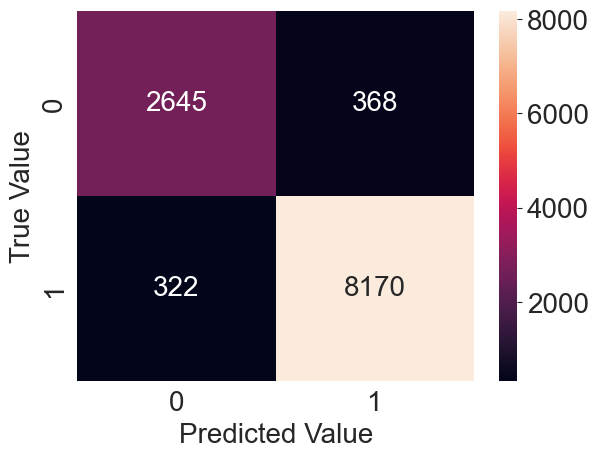

In [166]:
sns.heatmap(con_matrix , annot=True, fmt='d')
plt.xlabel('Predicted Value')
plt.ylabel('True Value')

> __We will use Hyperparameter Tunning (Elbow method ) as a try to increase accuracy by determining the optimal k value.__

## HyperParameter tunning ( Elbow method ) ( LoanStatus )

In [167]:
error_rate=[]
for i in range(1,40):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(Loan_x_train , Loan_y_train)
    pred_i = knn.predict(Loan_x_test)
    error_rate.append(np.mean(pred_i != Loan_y_test))

Text(0, 0.5, 'Error Rate')

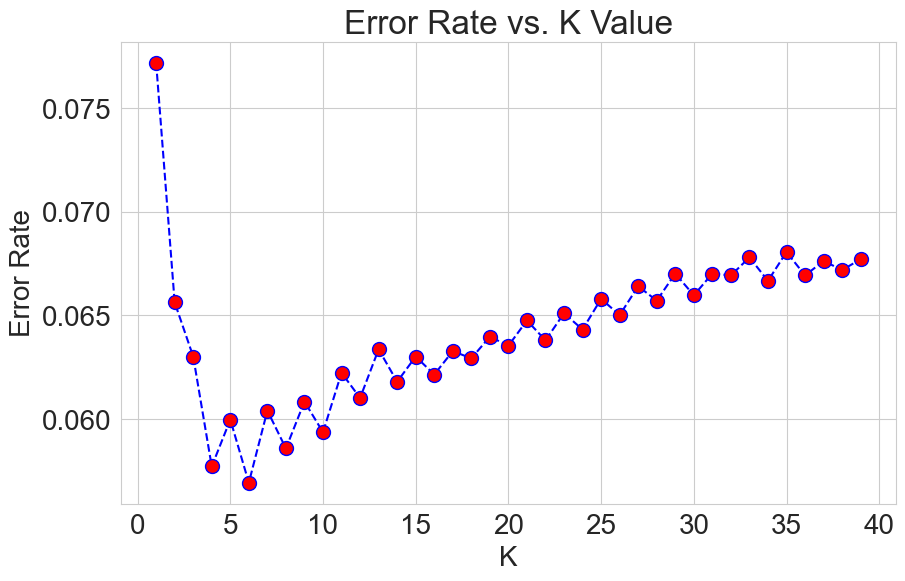

In [168]:
plt.figure(figsize=(10,6))
plt.plot(range(1,40),error_rate,color= 'blue', linestyle='dashed', marker='o', markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

> __The best k value ( number of neighbors ) is 6.__

## Train the model using the new value of k

In [169]:
best_model = KNeighborsClassifier( n_neighbors= 6 )
best_model.fit(Loan_x_train , Loan_y_train)

KNeighborsClassifier(n_neighbors=6)

In [170]:
best_model.predict(Loan_x_test)

array([1, 1, 1, ..., 1, 1, 0], dtype=int64)

### Calculate the model accuracy

In [171]:
# To calculate the model accuracy after Hyperparameter Tunning
best_model.score(Loan_x_test , Loan_y_test) * 100

94.30682312038245

### Classification report

In [172]:
print(classification_report(Loan_y_test, knn.predict(Loan_x_test)))

              precision    recall  f1-score   support

           0       0.89      0.85      0.87      3013
           1       0.95      0.96      0.95      8492

    accuracy                           0.93     11505
   macro avg       0.92      0.91      0.91     11505
weighted avg       0.93      0.93      0.93     11505



In [173]:
con_matrix = confusion_matrix(Loan_y_test, knn.predict(Loan_x_test))
print ( con_matrix )

[[2567  446]
 [ 333 8159]]


Text(38.722222222222214, 0.5, 'True Value')

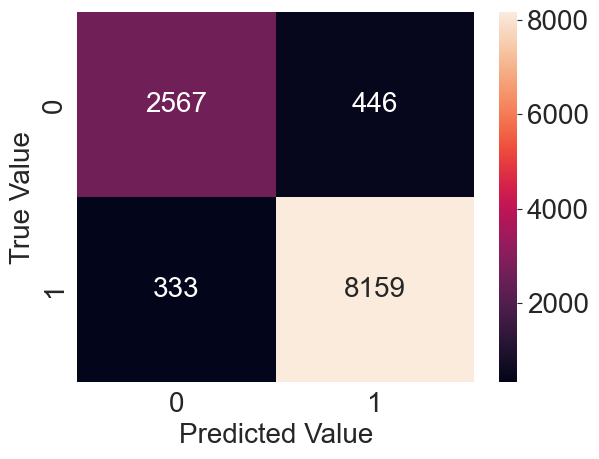

In [174]:
sns.heatmap(con_matrix , annot=True, fmt='d')
plt.xlabel('Predicted Value')
plt.ylabel('True Value')

> __So we concluded that the scores of KNN model for LoanStatus prediction before hyperparameter tunning was better than after hyperparameter tunning.__

## XGBoost Classifier model ( LoanStaus )

### Train the model

In [175]:
XGB_model = XGBClassifier()
XGB_model.fit(Loan_x_train,Loan_y_train,verbose=False)

print(f'Data training score: {XGB_model.score(Loan_x_train, Loan_y_train)}\nData testing score:{XGB_model.score(Loan_x_test, Loan_y_test)}')
      

Data training score: 0.9797031531825195
Data testing score:0.9687961755758366


In [176]:
# Using cross-validation
scores = cross_val_score(XGB_model, data, Loan_status, cv=5)

# Print mean accuracy and standard deviation of scores
print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))


Accuracy: 0.97 (+/- 0.00)


## Test the model

In [177]:
train_pred = XGB_model.predict(Loan_x_train)
y_preds = XGB_model.predict(Loan_x_test)

print(f"Training score = {accuracy_score(Loan_y_train,train_pred)}")
print(f"Testing score = {accuracy_score(Loan_y_test,y_preds)}")

Training score = 0.9797031531825195
Testing score = 0.9687961755758366


> __Since the training score & testing score are so close to each other , then the XGB classifier doesn't overfit.__

### Classification Report

In [178]:
report = classification_report(Loan_y_test,y_preds)
print(report)

              precision    recall  f1-score   support

           0       0.90      0.99      0.94      3013
           1       1.00      0.96      0.98      8492

    accuracy                           0.97     11505
   macro avg       0.95      0.97      0.96     11505
weighted avg       0.97      0.97      0.97     11505



### Confusion matrix

Text(38.722222222222214, 0.5, 'True Value')

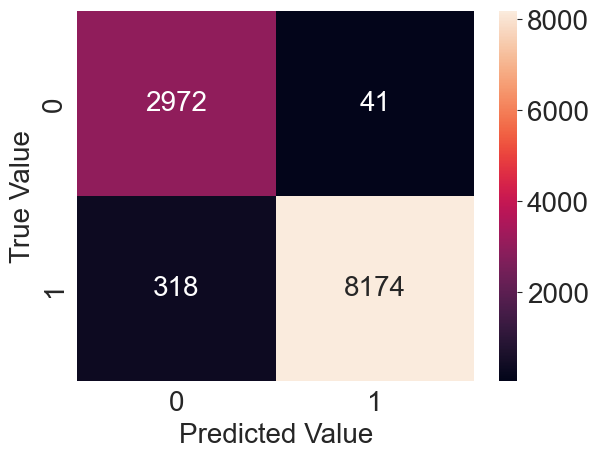

In [179]:
cm = confusion_matrix(Loan_y_test,y_preds)

sns.heatmap(cm , annot=True, fmt='d')
plt.xlabel('Predicted Value')
plt.ylabel('True Value')

In [180]:
print ( cm )
print ('________________________________________________________________________________________________________________')

[[2972   41]
 [ 318 8174]]
________________________________________________________________________________________________________________


### Checking for null values in our target variables 'EMI' , 'ROI' , 'ELA

In [181]:
regression_target_variables.isna().sum()

EMI     8
PROI    0
ELA     0
dtype: int64

In [182]:
### Filling these null values
regression_target_variables['EMI'].fillna(regression_target_variables['EMI'].median(), inplace=True)

C:\Users\noura\AppData\Local\Temp\ipykernel_21056\2133566657.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [183]:
regression_target_variables.isna().sum()

EMI     0
PROI    0
ELA     0
dtype: int64

In [184]:
data.shape , regression_target_variables.shape

((57522, 39), (57522, 3))

## Feature Selection ( preferred EMI , preferred ROI , ELA)  

# EMI

### MI Regressor approach

In [185]:
EMI_mir_score = MIR(data,regression_target_variables['EMI'])
EMI_mir_score = pd.Series(EMI_mir_score, name="MI Scores", index=data.columns)

EMI_mir_score = EMI_mir_score[EMI_mir_score>0]
EMI_mir_score.sort_values(ascending=False).head(len(EMI_mir_score))

LenderYield                           1.745988
LP_CustomerPayments                   1.659840
EstimatedReturn                       0.979956
LP_ServiceFees                        0.607309
LP_GrossPrincipalLoss                 0.475041
LP_NetPrincipalLoss                   0.456385
ProsperRating (numeric)               0.425802
OriginationYear                       0.418575
CreditScoreRangeLower                 0.184010
EmploymentStatus                      0.174734
Investors                             0.156321
ListingCategory (numeric)             0.122083
OriginationQuarter                    0.100800
IncomeRange                           0.087809
AvailableBankcardCredit               0.074026
BankcardUtilization                   0.069056
RevolvingCreditBalance                0.066697
TradesNeverDelinquent (percentage)    0.063864
TotalTrades                           0.051293
CurrentDelinquencies                  0.046951
OpenCreditLines                       0.043523
EmploymentSta

### Univariate Selection f_regression approach

In [186]:
top_features_EMI = SelectKBest(score_func=f_regression, k=10)
top_features_EMI.fit(data, regression_target_variables['EMI'])

selectk_EMI = pd.Series(top_features_EMI.scores_, index=data.columns, name="Select K Scores")
selectk_EMI = selectk_EMI[top_features_EMI.get_support()].sort_values(ascending=False)

print(selectk_EMI)

LP_CustomerPayments       251023.608337
LP_ServiceFees             26320.804211
Investors                   9666.172276
LP_GrossPrincipalLoss       2839.536649
LP_NetPrincipalLoss         2795.926462
CreditScoreRangeLower       2392.695753
RevolvingCreditBalance      1726.542362
OriginationYear             1395.114079
CurrentDelinquencies        1166.153014
OpenCreditLines              965.130697
Name: Select K Scores, dtype: float64


### Extra Tree Regressor approach

In [187]:
EMI_tr = ExtraTreesRegressor(n_estimators=100)
EMI_tr.fit(data, regression_target_variables['EMI'] )

ExtraTreesRegressor()

In [188]:
EMI_tr_score = pd.Series(EMI_tr.feature_importances_,  index=data.columns, name="ExtraTreeRegressor Scores")
EMI_tr_score.sort_values(ascending=False).head(len(EMI_tr_score))

LP_CustomerPayments                   0.712929
LenderYield                           0.115985
LP_ServiceFees                        0.112609
LP_GrossPrincipalLoss                 0.012273
ProsperRating (numeric)               0.011800
LP_NetPrincipalLoss                   0.011023
OriginationYear                       0.007028
EstimatedReturn                       0.005523
Investors                             0.001706
CreditScoreRangeLower                 0.001604
EmploymentStatus                      0.001187
LP_CollectionFees                     0.000617
RevolvingCreditBalance                0.000515
IncomeRange                           0.000494
ListingCategory (numeric)             0.000375
CurrentDelinquencies                  0.000341
BankcardUtilization                   0.000296
OriginationQuarter                    0.000282
DebtToIncomeRatio                     0.000276
AvailableBankcardCredit               0.000255
TradesOpenedLast6Months               0.000235
TotalInquirie

## All relevant features according to all approaches

In [189]:
scores = pd.concat([EMI_mir_score, selectk_EMI , EMI_tr_score], axis=1)
scores.head(len(scores))

,MI Scores,Select K Scores,ExtraTreeRegressor Scores
LenderYield,1.745988,NaN,0.115985
EstimatedReturn,0.979956,NaN,0.005523
ProsperRating (numeric),0.425802,NaN,0.011800
ListingCategory (numeric),0.122083,NaN,0.000375
BorrowerState,0.031391,NaN,0.000203
Occupation,0.027149,NaN,0.000221
EmploymentStatus,0.174734,NaN,0.001187
EmploymentStatusDuration,0.042104,NaN,0.000209
IsBorrowerHomeowner,0.018308,NaN,0.000171
CurrentlyInGroup,0.032407,NaN,0.000179


## Top 20 relevant features according to each approach from the feature selection

In [190]:
EMI_top= pd.DataFrame()

for col in scores.columns:
    EMI_top[col[:-7]] = scores.sort_values(col,ascending=False).head(20).index



EMI_top

,MI,Select K,ExtraTreeRegressor
0,LenderYield,LP_CustomerPayments,LP_CustomerPayments
1,LP_CustomerPayments,LP_ServiceFees,LenderYield
2,EstimatedReturn,Investors,LP_ServiceFees
3,LP_ServiceFees,LP_GrossPrincipalLoss,LP_GrossPrincipalLoss
4,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,ProsperRating (numeric)
5,LP_NetPrincipalLoss,CreditScoreRangeLower,LP_NetPrincipalLoss
6,ProsperRating (numeric),RevolvingCreditBalance,OriginationYear
7,OriginationYear,OriginationYear,EstimatedReturn
8,CreditScoreRangeLower,CurrentDelinquencies,Investors
9,EmploymentStatus,OpenCreditLines,CreditScoreRangeLower


### Features common between the 3 approaches  

In [191]:
selected_fetures_for_EMI = np.union1d(np.union1d(EMI_top['MI'].values, EMI_top['Select K'].values),
                                                 EMI_top['ExtraTreeRegressor'].values)

selected_fetures_for_EMI

array(['AvailableBankcardCredit', 'BankcardUtilization', 'BorrowerState',
       'CreditScoreRangeLower', 'CurrentDelinquencies',
       'CurrentlyInGroup', 'DebtToIncomeRatio', 'EmploymentStatus',
       'EmploymentStatusDuration', 'EstimatedReturn', 'IncomeRange',
       'Investors', 'IsBorrowerHomeowner', 'LP_CollectionFees',
       'LP_CustomerPayments', 'LP_GrossPrincipalLoss',
       'LP_NetPrincipalLoss', 'LP_ServiceFees', 'LenderYield',
       'ListingCategory (numeric)', 'Occupation', 'OpenCreditLines',
       'OriginationQuarter', 'OriginationYear', 'ProsperRating (numeric)',
       'RevolvingCreditBalance', 'TotalTrades',
       'TradesNeverDelinquent (percentage)'], dtype=object)

# ROI

### MI Regressor approach

In [192]:
ROI_mir_score = MIR(data,regression_target_variables['PROI'])
ROI_mir_score = pd.Series(ROI_mir_score, name="MI Scores", index=data.columns)

ROI_mir_score = ROI_mir_score[ROI_mir_score>0]
ROI_mir_score.sort_values(ascending=False).head(len(ROI_mir_score))

LP_GrossPrincipalLoss                 0.544501
LP_NetPrincipalLoss                   0.530956
LP_CustomerPayments                   0.454127
LP_ServiceFees                        0.142356
LenderYield                           0.088075
LP_CollectionFees                     0.060036
EstimatedReturn                       0.060033
LP_NonPrincipalRecoverypayments       0.057149
Investors                             0.048512
OriginationYear                       0.025886
CreditScoreRangeLower                 0.025144
ProsperRating (numeric)               0.018936
CurrentDelinquencies                  0.018826
TotalInquiries                        0.016538
ListingCategory (numeric)             0.013597
Occupation                            0.013143
TradesNeverDelinquent (percentage)    0.012081
IncomeRange                           0.011865
EmploymentStatus                      0.008993
AvailableBankcardCredit               0.008722
DebtToIncomeRatio                     0.007571
RevolvingCred

### Univariate Selection f_regression approach

In [193]:
top_features_ROI = SelectKBest(score_func=f_regression, k=10)
top_features_ROI.fit(data, regression_target_variables['PROI'])

selectk_ROI = pd.Series(top_features_ROI.scores_, index=data.columns, name="Select K Scores")
selectk_ROI = selectk_ROI[top_features_ROI.get_support()].sort_values(ascending=False)

print(selectk_ROI)

LP_GrossPrincipalLoss              49182.656866
LP_NetPrincipalLoss                47668.034075
LenderYield                         3680.190934
LP_CustomerPayments                 2418.584349
LP_NonPrincipalRecoverypayments     1866.453071
LP_CollectionFees                   1529.757905
TotalInquiries                      1273.398427
EstimatedReturn                     1144.348495
ProsperRating (numeric)             1125.519630
CreditScoreRangeLower                863.875560
Name: Select K Scores, dtype: float64


### Extra Tree Regressor approach

In [194]:
ROI_tr = ExtraTreesRegressor(n_estimators=100)
ROI_tr.fit(data, regression_target_variables['PROI'] )

ExtraTreesRegressor()

In [195]:
ROI_tr_score = pd.Series(ROI_tr.feature_importances_,  index=data.columns, name="ExtraTreeRegressor Scores")
ROI_tr_score.sort_values(ascending=False).head(len(ROI_tr_score))

LP_GrossPrincipalLoss                 0.356913
LP_NetPrincipalLoss                   0.333450
LP_CustomerPayments                   0.132357
LP_ServiceFees                        0.053510
OriginationYear                       0.031641
LenderYield                           0.015753
LP_CollectionFees                     0.008553
Investors                             0.006142
EstimatedReturn                       0.005854
ProsperRating (numeric)               0.004474
OriginationQuarter                    0.004047
EmploymentStatus                      0.003730
LP_NonPrincipalRecoverypayments       0.003321
IncomeRange                           0.002695
CreditScoreRangeLower                 0.002574
DebtToIncomeRatio                     0.002388
TotalInquiries                        0.002170
Occupation                            0.002163
BorrowerState                         0.002071
ListingCategory (numeric)             0.002067
BankcardUtilization                   0.001954
EmploymentSta

## All relevant features according to all approaches

In [196]:
scores = pd.concat([ROI_mir_score, selectk_ROI , ROI_tr_score], axis=1)
scores.head(len(scores))

,MI Scores,Select K Scores,ExtraTreeRegressor Scores
LenderYield,0.088075,3680.190934,0.015753
EstimatedReturn,0.060033,1144.348495,0.005854
ProsperRating (numeric),0.018936,1125.519630,0.004474
ListingCategory (numeric),0.013597,NaN,0.002067
BorrowerState,0.006320,NaN,0.002071
Occupation,0.013143,NaN,0.002163
EmploymentStatus,0.008993,NaN,0.003730
EmploymentStatusDuration,0.001133,NaN,0.001950
CurrentlyInGroup,0.000716,NaN,0.000919
CreditScoreRangeLower,0.025144,863.875560,0.002574


## Top 20 relevant features according to each approach from the feature selection

In [197]:
ROI_top= pd.DataFrame()

for col in scores.columns:
    ROI_top[col[:-7]] = scores.sort_values(col,ascending=False).head(20).index


ROI_top

,MI,Select K,ExtraTreeRegressor
0,LP_GrossPrincipalLoss,LP_GrossPrincipalLoss,LP_GrossPrincipalLoss
1,LP_NetPrincipalLoss,LP_NetPrincipalLoss,LP_NetPrincipalLoss
2,LP_CustomerPayments,LenderYield,LP_CustomerPayments
3,LP_ServiceFees,LP_CustomerPayments,LP_ServiceFees
4,LenderYield,LP_NonPrincipalRecoverypayments,OriginationYear
5,LP_CollectionFees,LP_CollectionFees,LenderYield
6,EstimatedReturn,TotalInquiries,LP_CollectionFees
7,LP_NonPrincipalRecoverypayments,EstimatedReturn,Investors
8,Investors,ProsperRating (numeric),EstimatedReturn
9,OriginationYear,CreditScoreRangeLower,ProsperRating (numeric)


### Features common between the 3 approaches  

In [198]:
selected_fetures_for_ROI = np.union1d(np.union1d(ROI_top['MI'].values, ROI_top['Select K'].values),
                                                 ROI_top['ExtraTreeRegressor'].values)

selected_fetures_for_ROI

array(['AmountDelinquent', 'AvailableBankcardCredit', 'BorrowerState',
       'CreditScoreRangeLower', 'CurrentDelinquencies',
       'CurrentlyInGroup', 'DebtToIncomeRatio', 'DelinquenciesLast7Years',
       'EmploymentStatus', 'EmploymentStatusDuration', 'EstimatedReturn',
       'IncomeRange', 'Investors', 'LP_CollectionFees',
       'LP_CustomerPayments', 'LP_GrossPrincipalLoss',
       'LP_NetPrincipalLoss', 'LP_NonPrincipalRecoverypayments',
       'LP_ServiceFees', 'LenderYield', 'ListingCategory (numeric)',
       'Occupation', 'OpenCreditLines', 'OriginationQuarter',
       'OriginationYear', 'ProsperRating (numeric)', 'TotalInquiries',
       'TradesNeverDelinquent (percentage)'], dtype=object)

# ELA

### MI Regressor approach

In [199]:
ELA_mir_score = MIR(data,regression_target_variables['ELA'])
ELA_mir_score = pd.Series(ELA_mir_score, name="MI Scores", index=data.columns)

ELA_mir_score = ELA_mir_score[ELA_mir_score>0]
ELA_mir_score.sort_values(ascending=False).head(len(ELA_mir_score))

LenderYield                           2.842721
EstimatedReturn                       1.652367
LP_CustomerPayments                   0.873700
OriginationYear                       0.725374
ProsperRating (numeric)               0.684273
LP_ServiceFees                        0.482209
EmploymentStatus                      0.356846
CreditScoreRangeLower                 0.307412
LP_GrossPrincipalLoss                 0.292474
LP_NetPrincipalLoss                   0.278352
Investors                             0.244178
ListingCategory (numeric)             0.237901
IncomeRange                           0.226085
OriginationQuarter                    0.158370
DebtToIncomeRatio                     0.135545
AvailableBankcardCredit               0.114868
TradesNeverDelinquent (percentage)    0.106746
BankcardUtilization                   0.106249
RevolvingCreditBalance                0.100220
EmploymentStatusDuration              0.077540
TotalTrades                           0.075673
BorrowerState

### Univariate Selection f_regression approach

In [200]:
top_features_ELA = SelectKBest(score_func=f_regression, k=10)
top_features_ELA.fit(data, regression_target_variables['ELA'])

selectk_ELA = pd.Series(top_features_ELA.scores_, index=data.columns, name="Select K Scores")
selectk_ELA = selectk_ELA[top_features_ELA.get_support()].sort_values(ascending=False)

print(selectk_ELA)

LP_CustomerPayments       29503.930347
LP_ServiceFees            20026.543965
LP_GrossPrincipalLoss     10310.744183
LP_NetPrincipalLoss       10197.479260
Investors                  8567.659823
OriginationYear            4111.206730
EstimatedReturn            2277.570915
RevolvingCreditBalance     1825.890692
CreditScoreRangeLower      1595.995648
LenderYield                1419.278312
Name: Select K Scores, dtype: float64


### Extra Tree Regressor approach

In [201]:
ELA_tr = ExtraTreesRegressor(n_estimators=100)
ELA_tr.fit(data, regression_target_variables['ELA'] )

ExtraTreesRegressor()

In [202]:
ELA_tr_score = pd.Series(ELA_tr.feature_importances_,  index=data.columns, name="ExtraTreeRegressor Scores")
ELA_tr_score.sort_values(ascending=False).head(len(ELA_tr_score))

LP_CustomerPayments                   0.306037
LP_ServiceFees                        0.141259
LP_GrossPrincipalLoss                 0.115134
LenderYield                           0.094861
LP_NetPrincipalLoss                   0.094418
OriginationYear                       0.077618
EstimatedReturn                       0.057308
IncomeRange                           0.025088
IncomeVerifiable                      0.014267
ProsperRating (numeric)               0.011551
EmploymentStatus                      0.010683
DebtToIncomeRatio                     0.008617
OriginationQuarter                    0.006948
Investors                             0.006904
LP_CollectionFees                     0.002530
CreditScoreRangeLower                 0.002283
ListingCategory (numeric)             0.002071
AvailableBankcardCredit               0.001551
TradesOpenedLast6Months               0.001529
BorrowerState                         0.001521
EmploymentStatusDuration              0.001482
RevolvingCred

## All relevant features according to all approaches

In [203]:
scores = pd.concat([ELA_mir_score, selectk_ELA , ELA_tr_score], axis=1)
scores.head(len(scores))

,MI Scores,Select K Scores,ExtraTreeRegressor Scores
LenderYield,2.842721,1419.278312,0.094861
EstimatedReturn,1.652367,2277.570915,0.057308
ProsperRating (numeric),0.684273,NaN,0.011551
ListingCategory (numeric),0.237901,NaN,0.002071
BorrowerState,0.074803,NaN,0.001521
Occupation,0.042603,NaN,0.001355
EmploymentStatus,0.356846,NaN,0.010683
EmploymentStatusDuration,0.077540,NaN,0.001482
IsBorrowerHomeowner,0.028843,NaN,0.001056
CurrentlyInGroup,0.064823,NaN,0.000696


## Top 20 relevant features according to each approach from the feature selection

In [204]:
ELA_top= pd.DataFrame()

for col in scores.columns:
    ELA_top[col[:-7]] = scores.sort_values(col,ascending=False).head(20).index



ELA_top

,MI,Select K,ExtraTreeRegressor
0,LenderYield,LP_CustomerPayments,LP_CustomerPayments
1,EstimatedReturn,LP_ServiceFees,LP_ServiceFees
2,LP_CustomerPayments,LP_GrossPrincipalLoss,LP_GrossPrincipalLoss
3,OriginationYear,LP_NetPrincipalLoss,LenderYield
4,ProsperRating (numeric),Investors,LP_NetPrincipalLoss
5,LP_ServiceFees,OriginationYear,OriginationYear
6,EmploymentStatus,EstimatedReturn,EstimatedReturn
7,CreditScoreRangeLower,RevolvingCreditBalance,IncomeRange
8,LP_GrossPrincipalLoss,CreditScoreRangeLower,IncomeVerifiable
9,LP_NetPrincipalLoss,LenderYield,ProsperRating (numeric)


### Features common between the 3 approaches  

In [205]:
selected_fetures_for_ELA = np.union1d(np.union1d(ELA_top['MI'].values, ELA_top['Select K'].values),
                                                 ELA_top['ExtraTreeRegressor'].values)

selected_fetures_for_ELA

array(['AvailableBankcardCredit', 'BankcardUtilization', 'BorrowerState',
       'CreditScoreRangeLower', 'CurrentlyInGroup', 'DebtToIncomeRatio',
       'EmploymentStatus', 'EmploymentStatusDuration', 'EstimatedReturn',
       'IncomeRange', 'IncomeVerifiable', 'Investors',
       'IsBorrowerHomeowner', 'LP_CollectionFees', 'LP_CustomerPayments',
       'LP_GrossPrincipalLoss', 'LP_NetPrincipalLoss', 'LP_ServiceFees',
       'LenderYield', 'ListingCategory (numeric)', 'Occupation',
       'OpenCreditLines', 'OriginationQuarter', 'OriginationYear',
       'ProsperRating (numeric)', 'RevolvingCreditBalance',
       'TotalInquiries', 'TradesNeverDelinquent (percentage)',
       'TradesOpenedLast6Months'], dtype=object)

## Getting relevant features for the three target variables ( union of all relevant features ) 

In [206]:
relevant_features = np.union1d(np.union1d(selected_fetures_for_EMI, selected_fetures_for_ROI), selected_fetures_for_ELA)

len(relevant_features) , relevant_features

(34,
 array(['AmountDelinquent', 'AvailableBankcardCredit',
        'BankcardUtilization', 'BorrowerState', 'CreditScoreRangeLower',
        'CurrentDelinquencies', 'CurrentlyInGroup', 'DebtToIncomeRatio',
        'DelinquenciesLast7Years', 'EmploymentStatus',
        'EmploymentStatusDuration', 'EstimatedReturn', 'IncomeRange',
        'IncomeVerifiable', 'Investors', 'IsBorrowerHomeowner',
        'LP_CollectionFees', 'LP_CustomerPayments',
        'LP_GrossPrincipalLoss', 'LP_NetPrincipalLoss',
        'LP_NonPrincipalRecoverypayments', 'LP_ServiceFees', 'LenderYield',
        'ListingCategory (numeric)', 'Occupation', 'OpenCreditLines',
        'OriginationQuarter', 'OriginationYear', 'ProsperRating (numeric)',
        'RevolvingCreditBalance', 'TotalInquiries', 'TotalTrades',
        'TradesNeverDelinquent (percentage)', 'TradesOpenedLast6Months'],
       dtype=object))

### Creating new dataset containing all data of the relevant features to be used in modeling

In [207]:
final_data = pd.DataFrame()
for feature in relevant_features :
    final_data[feature] = data[feature]

In [208]:
print ( final_data.shape )

(57522, 34)


In [209]:
# To print all column in the data
pd.set_option('display.max_columns', None)

In [210]:
final_data.head(20)

,AmountDelinquent,AvailableBankcardCredit,BankcardUtilization,BorrowerState,CreditScoreRangeLower,CurrentDelinquencies,CurrentlyInGroup,DebtToIncomeRatio,DelinquenciesLast7Years,EmploymentStatus,EmploymentStatusDuration,EstimatedReturn,IncomeRange,IncomeVerifiable,Investors,IsBorrowerHomeowner,LP_CollectionFees,LP_CustomerPayments,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,LP_ServiceFees,LenderYield,ListingCategory (numeric),Occupation,OpenCreditLines,OriginationQuarter,OriginationYear,ProsperRating (numeric),RevolvingCreditBalance,TotalInquiries,TotalTrades,TradesNeverDelinquent (percentage),TradesOpenedLast6Months
0,472.0,1500.0,0.00,5,640.0,2.0,1,0.17,4.0,7,2.0,0.634863,3,1,258,1,1.000000,0.280029,0.003754,0.036778,0.00,0.153955,0.314292,0,35,4.0,3,2007,3.0,0.000,3.0,11.0,0.81,0.0
1,0.0,3229.5,0.57,10,480.0,1.0,1,0.06,0.0,2,53.0,0.634863,6,1,41,0,1.000000,0.102911,0.003754,0.036778,0.00,0.711943,0.530898,0,35,8.0,1,2007,3.0,6113.500,1.0,20.0,0.92,1.0
2,2224.0,2580.0,0.32,4,640.0,3.0,0,0.27,1.0,1,19.0,0.634863,1,1,53,0,1.000000,0.024911,0.003754,0.036778,0.00,0.831344,0.281376,0,66,2.0,4,2007,3.0,1220.000,5.0,7.0,0.40,0.0
3,0.0,3626.0,0.70,1,680.0,0.0,0,0.18,0.0,0,1.0,0.550386,3,1,1,0,1.000000,0.003394,0.003754,0.036778,0.00,0.818441,0.304736,1,48,7.0,1,2014,5.0,8624.000,4.0,20.0,1.00,0.0
4,0.0,178.0,0.97,9,700.0,0.0,0,0.49,0.0,4,121.0,0.658877,4,1,10,1,1.000000,0.012860,0.154795,0.182812,0.00,0.785621,0.674666,13,35,9.0,2,2012,1.0,9103.000,1.0,17.0,0.94,0.0
5,0.0,3229.5,0.57,4,760.0,2.0,1,0.12,0.0,2,53.0,0.634863,6,1,85,1,1.000000,0.130886,0.243357,0.268439,268.96,0.556241,0.270758,0,41,8.0,3,2006,3.0,6113.500,17.0,20.0,0.92,1.0
6,5200.0,1366.0,0.08,22,620.0,1.0,1,0.09,5.0,1,36.0,0.634863,3,1,53,0,1.000000,0.099826,0.003754,0.036778,0.00,0.574110,0.440646,0,41,4.0,4,2007,3.0,134.000,8.0,6.0,0.37,0.0
7,0.0,607.0,0.84,14,680.0,0.0,0,0.39,0.0,0,3.0,0.617067,3,1,30,0,1.000000,0.005856,0.078762,0.109300,0.00,0.810812,0.513697,15,50,7.0,2,2013,3.0,7975.000,0.0,22.0,1.00,0.0
8,0.0,3619.0,0.30,34,660.0,0.0,0,0.11,0.0,0,25.0,0.659305,3,1,37,0,1.000000,0.116146,0.003754,0.036778,0.00,0.703700,0.596517,1,47,6.0,1,2013,2.0,2033.000,3.0,10.0,1.00,1.0
9,0.0,30794.0,0.09,5,700.0,0.0,0,0.26,0.0,1,10.0,0.522084,5,1,121,1,1.000000,0.112931,0.003754,0.036778,0.00,0.504989,0.195371,1,19,16.0,2,2010,6.0,7246.000,8.0,40.0,1.00,2.0


In [211]:
regression_target_variables.head(20)

,EMI,PROI,ELA
0,1496.764570,0.115206,63034.0
1,825.406311,0.115206,32711.0
2,134.019825,0.115206,5770.0
3,12.822517,0.215206,24664.0
4,66.640814,0.265206,49749.0
5,505.700802,0.165206,55000.0
6,623.202574,0.115206,25410.0
7,28.490571,0.165206,19417.0
8,1123.600398,0.115206,71416.0
9,384.162168,0.065206,17248.0


### Creating a copy of the three target variables relevant feaures data into another one to be used in pipelining 

In [212]:
regression_pipelines_data = final_data.copy()

## Standard scalling

In [213]:
scaler = StandardScaler()

final_data[relevant_features] =scaler.fit_transform(final_data[relevant_features])

print("_________________________________________________________________________________________")

_________________________________________________________________________________________


## Data Splitting ( preferred ROI , preferred EMI , ELA )

In [214]:
x = final_data
y = regression_target_variables # target variables

# Splitting data into train and test
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [215]:
# To see the size of data after splitting
print("Size of original dataset :", final_data.shape)
print("Size of input - training set", x_train.shape)
print("Size of output - training set", y_train.shape)
print("Size of input - testing set", x_test.shape)
print("Size of output - testing set", y_test.shape)

Size of original dataset : (57522, 34)
Size of input - training set (46017, 34)
Size of output - training set (46017, 3)
Size of input - testing set (11505, 34)
Size of output - testing set (11505, 3)


# Modeling

## Creating polynomial features 

In [216]:
# degree = 2 --> means that one new variable will be added for each input feature depending on data features
poly = PolynomialFeatures(degree=2)
x_train_poly = poly.fit_transform(x_train)
x_test_poly = poly.fit_transform(x_test)

## Lasso Regression model

## Train the model

In [217]:
lasso_model = MultiTaskLasso(alpha = 1e-05)
lasso_model.fit(x_train_poly, y_train)

D:\Anaconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:2418: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 6390772439922.651, tolerance: 10899881414.762613



MultiTaskLasso(alpha=1e-05)

## Test the model

In [218]:
# Evaluate model performance on test set
y_pred = lasso_model.predict(x_test_poly)
y_pred

array([[1.17396367e+03, 1.43529885e-01, 5.66683669e+04],
       [4.05100062e+02, 9.15068936e-02, 1.69203548e+04],
       [1.27859055e+03, 1.17533046e-01, 4.52792689e+04],
       ...,
       [9.12183228e+02, 1.07558114e-01, 3.14136078e+04],
       [1.84500396e+03, 1.08377523e-01, 6.57116027e+04],
       [1.20496136e+03, 1.10469109e-01, 6.96892701e+04]])

## Model Evaluation

In [219]:
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print( "Lasso Regression model : ")
print("Mean Squared Error (MSE):", mse)
print("R-squared (R2) Score:", r2)
print(f'Training score: {lasso_model.score(x_train_poly,y_train)} \nTest score: {lasso_model.score(x_test_poly, y_test)}')

print("_________________________________________________________________________________________")

Lasso Regression model : 
Mean Squared Error (MSE): 95085086.29568706
R-squared (R2) Score: 0.8593085505826843
Training score: 0.8673529460785855 
Test score: 0.8593085505826843
_________________________________________________________________________________________


## Polynomial Regression model

## Multiple Linear regressor

## Train the model

In [220]:
model = LinearRegression()

model.fit(x_train_poly, y_train)

LinearRegression()

## Test the model

In [221]:
y_pred = model.predict(x_test_poly)

## Model Evaluation

In [222]:
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)


print("Polynomial Regression for Multiple Linear Regression :\nMean Squared Error:", mse)
print("R-squared (R2) Score:", r2)
print(f'Training score : {model.score(x_train_poly,y_train)} \nTest score : {model.score(x_test_poly, y_test)}')

print("_________________________________________________________________________________________")

Polynomial Regression for Multiple Linear Regression :
Mean Squared Error: 95206019.87863916
R-squared (R2) Score: 0.8589699791209725
Training score : 0.8673728987616013 
Test score : 0.8589699791209725
_________________________________________________________________________________________


## XGB Regressor

## Train the model

In [223]:
xgb = XGBRegressor()

xgb.fit(x_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

## Test the model

In [224]:
y_pred = xgb.predict(x_test)

## Model Evaluation

In [225]:
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Polynomial Regression for XGB regression model :\nMean Squared Error:", mse)
print("R-squared (R2) Score:", r2)
print(f'Training score : {xgb.score(x_train,y_train)} \nTest score : {xgb.score(x_test, y_test)}')
print("_________________________________________________________________________________________")

Polynomial Regression for XGB regression model :
Mean Squared Error: 29147639.512463715
R-squared (R2) Score: 0.9646090935324266
Training score : 0.9824509550707328 
Test score : 0.9646090935324266
_________________________________________________________________________________________


## Decision Tree Regressor 

## Train the model

In [226]:
dt = DecisionTreeRegressor()

dt.fit(x_train, y_train)

DecisionTreeRegressor()

## Test the model 

In [227]:
y_pred = dt.predict(x_test)

## Model Evaluation

In [228]:
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Polynomial Regression for Decision Tree regression model :\nMean Squared Error:", mse)
print("R-squared (R2) Score:", r2)
print(f'Training score : {dt.score(x_train,y_train)} \nTest score : {dt.score(x_test, y_test)}')
print("_________________________________________________________________________________________")

Polynomial Regression for Decision Tree regression model :
Mean Squared Error: 76209571.665374
R-squared (R2) Score: 0.9034039921608924
Training score : 0.9999999999999881 
Test score : 0.9034039921608924
_________________________________________________________________________________________


## Ridge Regressor

## Train the model

In [229]:
ridge = Ridge(alpha=1e-05)
ridge.fit(x_train_poly, y_train)

Ridge(alpha=1e-05)

## Test the model

In [230]:
y_pred = ridge.predict(x_test_poly)

## Model Evaluation

In [231]:
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Polynomial Regression for Ridge regression model :\nMean Squared Error:", mse)
print("R-squared (R2) Score:", r2)
print(f'Training score : {ridge.score(x_train_poly,y_train)} \nTest score : {ridge.score(x_test_poly, y_test)}')

Polynomial Regression for Ridge regression model :
Mean Squared Error: 95205995.4771211
R-squared (R2) Score: 0.8589686193794571
Training score : 0.8673729159038333 
Test score : 0.8589686193794571


## Conclusion

**Classification models :** 
- KNN model accuracy: 94% ( before tunning ) , 94.3% ( after tunning )
- XGB model accuracy : 96.87% , mean accuracy : 97% 

  ______________________________________________________________________________
  
**Regression models :**
- **Lasso Regression model score :** 
  
   - Mean Squared Error (MSE): 95085086.29568706
   - R-squared (R2) Score: 0.8593085505826843
   - Training score: 0.8673529460785855 
   - Test score: 0.8593085505826843

  ______________________________________________________________________________
  
  - **Polynomial Regression :**
  
  
    - **Multiple Linear Regression model score :**
  
       - Mean Squared Error: 95206019.87863916
       - R-squared (R2) Score: 0.8589699791209725
       - Training score : 0.8673728987616013 
       - Test score : 0.8589699791209725
      
       ______________________________________________________
        

    - **XGB regression model score :** 
    
       - Mean Squared Error: 29147639.512463715
       - R-squared (R2) Score: 0.9646090935324266
       - Training score : 0.9824509550707328 
       - Test score : 0.9646090935324266
      

      ______________________________________________________
      

    - **Decision Tree Regressor model score :**
    
       - Mean Squared Error: 76209571.665374
       - R-squared (R2) Score: 0.9034039921608924
       - Training score : 0.9999999999999881 
       - Test score : 0.9034039921608924

      ______________________________________________________
      
    
    - **Ridge Regression model score :** 
     
       - Mean Squared Error: 95205995.4771211
       - R-squared (R2) Score: 0.8589686193794571
       - Training score : 0.8673729159038333 
       - Test score : 0.8589686193794571
      
      
**____________________________________________________________________________________________________________**

# Pipelining 

## Classification models ( LoanStatus )

### Data splitting

In [232]:
x_class = LS_pipeline_data
y_class = Loan_status

ls_x_train, ls_x_test, ls_y_train, ls_y_test = train_test_split(x_class, y_class, test_size=0.20, random_state=0)


## Classification

## KNN classification model

In [233]:
# Creating the pipeline
knn_pipeline = Pipeline( [ ('Standard Scaling', StandardScaler()) , ('PCA' , PCA(n_components = 4) ), 
                          ('KNN Classifier',KNeighborsClassifier() ) ])

# Fitting the pipeline on the training data
knn_pipeline.fit(ls_x_train, ls_y_train)

# Pipelining predictions
y_pred = knn_pipeline.predict(ls_x_test)

# Calculating the pipeline accuracy 
print('Test accuracy = ', round(accuracy_score(ls_y_test, y_pred)*100, 2), '%')

Test accuracy =  94.78 %


### Classification report

In [234]:
print(classification_report(ls_y_test, knn_pipeline.predict(ls_x_test)))

              precision    recall  f1-score   support

           0       0.88      0.92      0.90      2958
           1       0.97      0.96      0.96      8547

    accuracy                           0.95     11505
   macro avg       0.93      0.94      0.93     11505
weighted avg       0.95      0.95      0.95     11505



### Confusion Matrix 

Text(38.722222222222214, 0.5, 'True Value')

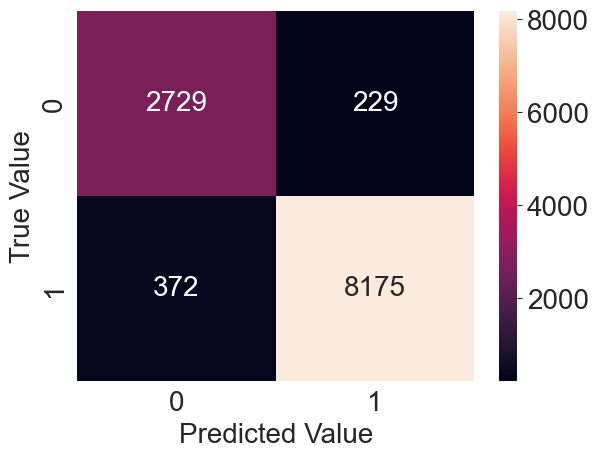

In [235]:
cm = confusion_matrix(ls_y_test,y_pred)

sns.heatmap(cm , annot=True, fmt='d')
plt.xlabel('Predicted Value')
plt.ylabel('True Value')

## XGB classification model

In [236]:
# Creating the pipeline
xgb_pipeline =  Pipeline( [ ('Standard Scaling', StandardScaler()) , ('PCA' , PCA(n_components = 4) ) ,
                                  ('XGB Classifier' , XGBClassifier() ) ])

# Fitting the pipeline on the training data
xgb_pipeline.fit(ls_x_train, ls_y_train)

# Pipelining predictions
y_pred = xgb_pipeline.predict(ls_x_test)

# Calculating the pipeline accuracy  
print('Test accuracy = ', round(accuracy_score(ls_y_test, y_pred)*100, 2), '%')

Test accuracy =  95.22 %


### Classification report

In [237]:
print(classification_report(ls_y_test, knn_pipeline.predict(ls_x_test)))

              precision    recall  f1-score   support

           0       0.88      0.92      0.90      2958
           1       0.97      0.96      0.96      8547

    accuracy                           0.95     11505
   macro avg       0.93      0.94      0.93     11505
weighted avg       0.95      0.95      0.95     11505



### Confusion Matrix 

Text(38.722222222222214, 0.5, 'True Value')

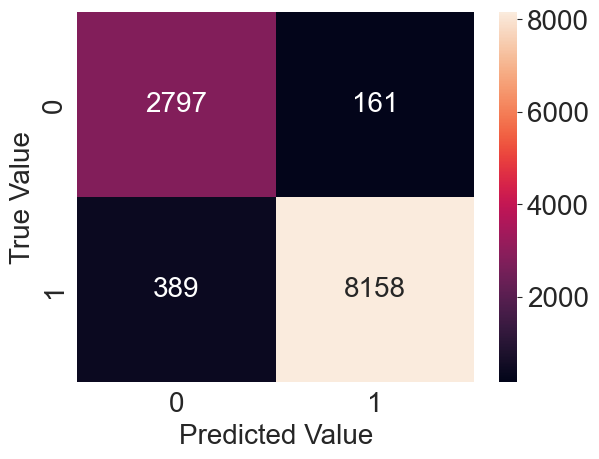

In [238]:
cm = confusion_matrix(ls_y_test,y_pred)

sns.heatmap(cm , annot=True, fmt='d')
plt.xlabel('Predicted Value')
plt.ylabel('True Value')

**_________________________________________________________________________________________**

## Regressor models ( EMI , PROI , ELA )

### Data splitting

In [239]:
x_reg = regression_pipelines_data
y_reg = regression_target_variables

reg_x_train, reg_x_test, reg_y_train, reg_y_test = train_test_split(x_reg, y_reg, test_size=0.2, random_state=35)

## Regression

## Lasso Regression pipeline

In [241]:
# Creating the pipeline
lasso_pipeline = Pipeline( [ ('Standard Scaling', StandardScaler()) , ('polynomial', PolynomialFeatures(degree=2) ) , 
                            ('Lasso Regressor' , MultiTaskLasso(alpha=1e-05) ) ] )

# Fitting the pipeline on the training data
lasso_pipeline.fit(reg_x_train, reg_y_train)

# Pipelining predictions
y_pred = lasso_pipeline.predict(reg_x_test)


# Calculating the pipeline scores
mse = mean_squared_error(reg_y_test, y_pred)
r2 = r2_score(reg_y_test, y_pred)

print("Polynomial Regression for Lasso regression pipeline :\nMean Squared Error:", mse)
print ( "R-squared (R2) Score:", r2 )
print('Test accuracy : ', lasso_pipeline.score(reg_x_test , reg_y_test))

D:\Anaconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:2418: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 6448805805098.25, tolerance: 10903718266.564266



Polynomial Regression for Lasso regression pipeline :
Mean Squared Error: 91630483.49043061
R-squared (R2) Score: 0.8635104203300562
Test accuracy :  0.8635104203300562


## Multiple Linear regression pipeline

In [242]:
# Creating the pipeline
lr_pipeline = Pipeline( [ ('Standard Scaling', StandardScaler()) , ('polynomial', PolynomialFeatures(degree=2) )  , 
                         ('Linear Regression' , LinearRegression() ) ] )

# Fitting the pipeline on the training data
lr_pipeline.fit(reg_x_train, reg_y_train)

# Pipelining predictions
y_pred = lr_pipeline.predict(reg_x_test)


# Calculating the pipeline scores
mse = mean_squared_error(reg_y_test, y_pred)
r2 = r2_score(reg_y_test, y_pred)

print("Polynomial Regression for Multiple Linear regression pipeline :\nMean Squared Error:", mse)
print ( "R-squared (R2) Score:", r2 )
print('Test accuracy : ', lr_pipeline.score(reg_x_test , reg_y_test))

Polynomial Regression for Multiple Linear regression pipeline :
Mean Squared Error: 91812926.2827947
R-squared (R2) Score: 0.8633698185372349
Test accuracy :  0.8633698185372349


## XGB Regression pipeline

In [243]:
# Creating the pipeline
xgb_reg_pipeline = Pipeline( [ ('Standard Scaling', StandardScaler()) , ('XGB Regression' , XGBRegressor() ) ] )

# Fitting the pipeline on the training data
xgb_reg_pipeline.fit(reg_x_train, reg_y_train)

# Pipelining predictions
y_pred = xgb_reg_pipeline.predict(reg_x_test)


# Calculating the pipeline scores
mse = mean_squared_error(reg_y_test, y_pred)
r2 = r2_score(reg_y_test, y_pred)

print("Polynomial Regression for XGB regression pipeline :\nMean Squared Error:", mse)
print ( "R-squared (R2) Score:", r2 )
print('Test accuracy : ', xgb_reg_pipeline.score(reg_x_test , reg_y_test))

Polynomial Regression for XGB regression pipeline :
Mean Squared Error: 28179331.966207165
R-squared (R2) Score: 0.9650833115345022
Test accuracy :  0.9650833115345022


## Decision Tree Regression pipeline

In [244]:
# Creating the pipeline
dt_reg_pipeline = Pipeline( [ ('Standard Scaling', StandardScaler()) , ('Decision Tree Regression' ,DecisionTreeRegressor())])

# Fitting the pipeline on the training data
dt_reg_pipeline.fit(reg_x_train, reg_y_train)

# Pipelining predictions
y_pred = dt_reg_pipeline.predict(reg_x_test)


# Calculating the pipeline scores
mse = mean_squared_error(reg_y_test, y_pred)
r2 = r2_score(reg_y_test, y_pred)

print("Polynomial Regression for Decision Tree regression pipeline :\nMean Squared Error:", mse)
print ( "R-squared (R2) Score:", r2 )
print('Test accuracy : ', dt_reg_pipeline.score(reg_x_test , reg_y_test))

Polynomial Regression for Decision Tree regression pipeline :
Mean Squared Error: 59059258.57099292
R-squared (R2) Score: 0.9045215562030279
Test accuracy :  0.9045215562030279


> __We concluded that by using polynomial features in XGB Regressor , Decision tree regressor models and pipelines , the scores decreased. So, we used it only in the other multi-regression models.__

## Ridge Regression pipeline

In [245]:
# Creating the pipeline
ridge_pipeline = Pipeline( [ ('Standard Scaling', StandardScaler()) , ('polynomial', PolynomialFeatures(degree=2) ) ,
                            ('Ridge Regression' , Ridge() ) ] )

# Fitting the pipeline on the training data
ridge_pipeline.fit(reg_x_train, reg_y_train)

# Pipelining predictions
y_pred = ridge_pipeline.predict(reg_x_test)


# Calculating the pipeline scores
mse = mean_squared_error(reg_y_test, y_pred)
r2 = r2_score(reg_y_test, y_pred)

print("Polynomial Regression for Ridge regression pipeline :\nMean Squared Error:", mse)
print ( "R-squared (R2) Score:", r2 )
print('Test accuracy : ', ridge_pipeline.score(reg_x_test , reg_y_test))

Polynomial Regression for Ridge regression pipeline :
Mean Squared Error: 91791757.84027362
R-squared (R2) Score: 0.8634030653568772
Test accuracy :  0.8634030653568772


In [246]:
pipe = Pipeline(steps=[ ('Standard Scalling' , StandardScaler() ) , ('polynomial', PolynomialFeatures(degree=2) ) ,
                       ('ridge' , Ridge() ) ]  )


param_grid = { 'ridge__alpha': np.logspace(0, 4, 5)}
              

search = GridSearchCV(pipe, param_grid, cv=5 ,return_train_score=False)

search.fit(reg_x_train, reg_y_train)
print("Best parameter (CV score=%0.3f):" % search.best_score_)
print(search.best_params_)

Best parameter (CV score=0.857):
{'ridge__alpha': 100.0}


> __We concluded that the highest score which can be obtained from pipelining using Ridge reggression as an estimator is : 86.3%.__

### Creating one pipeline containing both classification & mult-regressor models

In [ ]:
# from sklearn.pipeline import FeatureUnion
# from sklearn.compose import ColumnTransformer
# from sklearn.multioutput import MultiOutputRegressor



# Splitting the data 
# frames = [ LS_pipeline_data , regression_pipelines_data]
# target = [ Loan_status , regression_target_variables ]

# final_x = pd.concat(frames)
# final_y = pd.concat(target)

# final_x_train, final_x_test, final_y_train, final_y_test = train_test_split(final_x, final_y, test_size=0.2, random_state=35) 


# Define the features for the classification model
# classification_features = LS_pipeline_data.columns

# Define the features for the regression model
# regression_features = regression_pipelines_data.columns

# Define the transformers for the different types of features
# preprocessor = ColumnTransformer( transformers=[ ('numeric', StandardScaler(), regression_features),
#         ('binary', StandardScaler(), classification_features) ])

# Define the classification model
# classification_model = XGBClassifier()

# Define the regression model
# regression_model = XGBRegressor()

# Combine the models using multi-output regression
# multi_model = MultiOutputRegressor(estimator = Pipeline([ ('preprocessor', preprocessor),('regressor', regression_model) ]))


# Define the pipeline, concatenating the classification and regression models
# final_pipeline = Pipeline([ ('Standard Scaling', StandardScaler()) , ('union', FeatureUnion([ ('classification', classification_model),
#                 ('regression', regression_model) ])) ])


# Fitting the pipeline on the training data
# final_pipeline.fit(final_x_train, final_y_train)

# Pipelining predictions
# final_y_pred = final_pipeline.predict(final_x_test)


# Calculating the pipeline scores
# mse = mean_squared_error(final_y_test, final_y_pred)
# r2 = r2_score(final_y_test, final_y_pred)

# print("Polynomial Regression for Ridge regression pipeline :\nMean Squared Error:", mse)
# print ( "R-squared (R2) Score:", r2 )
# print('Test accuracy : ', final_pipeline.score(final_x_test , final_y_test))

## Conclusion

**Classification models :** 
- KNN pipelining accuracy: 94.78  %
- XGB pipelining accuracy : 95.22  %

  ______________________________________________________________________________
  
**Regression models :**
- **Lasso Regression pipelining score :** 
  
    - Mean Squared Error: 91630483.49043061
    - R-squared (R2) Score: 0.8635104203300562
    - Test accuracy :  0.8635104203300562
  
   ______________________________________________________________________________
  
  - **Polynomial Regression :**
  
  
    - **Multiple Linear Regression pipelining score :**
  
        - Mean Squared Error: 91812926.2827947
        - R-squared (R2) Score: 0.8633698185372349
        - Test accuracy :  0.8633698185372349
      
      
       ______________________________________________________
        

    - **XGB regression pipelining score :** 
    
       - Mean Squared Error: 28179331.966207165
       - R-squared (R2) Score: 0.9650833115345022
       - Test accuracy :  0.9650833115345022
      
      
      ______________________________________________________
      

    - **Decision Tree Regressor pipelining score :**
    
        - Mean Squared Error: 59059258.57099292
        - R-squared (R2) Score: 0.9045215562030279
        - Test accuracy :  0.9045215562030279
      
      ______________________________________________________
      
    
    - **Ridge Regression pipelining score :** 
     
       - Mean Squared Error: 91791757.84027362
       - R-squared (R2) Score: 0.8634030653568772
       - Test accuracy :  0.8634030653568772
      
      
**__________________________________________________________________________________________________________**

# Saving the model for deployment

## Classification model

In [247]:
# Saving the model
filename = 'classification_model.pkl'
pickle.dump(xgb_pipeline, open(filename, 'wb'))

# loading the saved model
loaded_model = pickle.load(open('classification_model.pkl', 'rb'))

## Multi-regressor model

In [248]:
# Saving the model
filename = 'multi-regressor_model.pkl'
pickle.dump(xgb_reg_pipeline, open(filename, 'wb'))

# loading the saved model
loaded_model = pickle.load(open('multi-regressor_model.pkl', 'rb'))